In [1]:
import os
import pynwb
import h5py
from tqdm import tqdm
import pandas as pd
from pathlib import Path
import numpy as np
import seaborn as sns
import pywt
import matplotlib
import graph
import time
import itertools

import matplotlib.pyplot as plt
from matplotlib_venn import venn2
from scipy.ndimage import uniform_filter1d
from ripple_detection import filter_ripple_band,Kay_ripple_detector

from scipy import signal
from scipy.stats import pearsonr
from scipy.fftpack import next_fast_len
from scipy.io import loadmat
from scipy.ndimage import gaussian_filter1d
from scipy.signal import filtfilt, hilbert, remez, sosfiltfilt, butter
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

In [2]:
sz1 = 14
sz2 = 20
sns.set(style="ticks", rc={"lines.linewidth": 1.5})
matplotlib.rc('xtick', labelsize=sz1) 
matplotlib.rc('ytick', labelsize=sz1) 
matplotlib.rc('axes', labelsize=sz1)  
matplotlib.rc('axes', titlesize=sz1)  
matplotlib.rc('figure', titlesize=sz2)
matplotlib.rc('legend', fontsize=sz1) 
matplotlib.rc('legend', title_fontsize=sz1)
matplotlib.rcParams['axes.spines.right'] = False
matplotlib.rcParams['axes.spines.top'] = False

In [3]:
def import_LFP(date):

    # get LFP data
    lfpFile = h5py.File('/Volumes/Extreme SSD/Teleworld/bart_I/raw/spikes/Bart_TeleWorld_v13_%s-spikes.mat' % date, 'r')
    timestamps = np.array(lfpFile['/lfpTimeStamps']).ravel()
    lfpData = lfpFile['/lfpTable']
    
    return timestamps, lfpData

In [4]:
def import_behavior(date):
    
    # get beh data
    DATA_DIR = Path('/Volumes/Extreme SSD')
    os.chdir(DATA_DIR)
    
    filename = 'Bart_TeleWorld_v13_%s.nwb' % date
    nwbfile = pynwb.NWBHDF5IO(filename, "r").read()

    return nwbfile

In [5]:
def preprocess_LFP(lfp, cutoff=15, fs=1000):
    
    # remove 60Hz and harmonics
    
    preprocessed = lfp.copy()
    
    for f0 in [60, 120, 180, 240]:# design 10th order band-stop (Butterworth) filter for each noise frequency +/- 2 Hz
        notchfilt = butter(10, (f0-2,f0+2), 'bandstop', fs=fs, output='sos')
        preprocessed = sosfiltfilt(notchfilt, preprocessed)


    # detect big deflections, caused by static electric noise etc. 
    
    diff = np.diff(preprocessed)
    zscored = (diff-diff.mean())/diff.std()
    noise, _ = signal.find_peaks(np.abs(zscored),height=cutoff)
    
    
    return preprocessed, noise

In [11]:
def detect_ripple(preprocessed, noise, band, fs=1000):

    # 1. bandpass, ripple band 150-250 (rat), NHP band 80-180
    
    sos = butter(5, band, btype='bandpass', output='sos', fs=fs)
    rippleband = sosfiltfilt(sos, preprocessed)

    
    # 2. calculate the power of ripple band
    
    envelope = np.abs(hilbert(rippleband))
    gauss_kernel = signal.windows.gaussian(101,20) # gaussian smoothing s.d. 20ms
    gauss_kernel /= gauss_kernel.sum()  # normalize
    smoothed = signal.convolve(envelope.ravel(),gauss_kernel,mode='same')

    
    # 3. replace noise with median
    
    median = np.median(smoothed)
    for nn in noise:
        smoothed[np.arange(nn-100,nn+100)] = median

    
    # 4, find local peaks > 3s.d. of the mean with minimal interval 50ms 
        
    zscored = (smoothed-smoothed.mean())/smoothed.std()
    candidate_peaks,_ = signal.find_peaks(zscored,height=3,distance=50)


    # 4. only keep peaks with >50ms width above 3sd
    true_peaks = []
    ons = []
    offs = []

    for _peak in candidate_peaks:

        if (_peak-500>0) & (_peak+500<len(zscored)):

            try:
                on = np.max(np.where(zscored[_peak-500:_peak]<3)[0]) + _peak - 500
                off = np.min(np.where(zscored[_peak:_peak+500]<3)[0]) + _peak
                    
                if off-on>50:
                    
                    true_peaks.append(_peak)
                    ons.append(on)
                    offs.append(off)
            except:
                pass

    true_peaks = np.array(true_peaks)
    ons = np.array(ons)
    offs = np.array(offs)

    return rippleband, smoothed, zscored, true_peaks, ons, offs

In [13]:
def create_grid(n,barriers=[],teleports=[]):

    # create n*n grid, transition matrix
    T = np.zeros((n*n,n*n))
    block = np.diag(np.ones(n-1), k=1) + np.diag(np.ones(n-1), k=-1)
    
    for c in range(n):
        T[c*n:(c+1)*n,c*n:(c+1)*n] = block
        cols = np.arange(c, n*n, n)  
        row_idx, col_idx = np.meshgrid(cols, cols, indexing='ij')  # shape (4, 4)
        T[row_idx, col_idx] = block

    if len(barriers)>0:
        for barrier in barriers:
            T[barrier[0],barrier[1]]=0
            T[barrier[1],barrier[0]]=0

    if len(teleports)>0:
        for teleport in teleports:
            T[teleport[0],teleport[1]]=1
            T[teleport[1],teleport[0]]=1  
    
    return T


def distance_matrix(T):
    
    # calculate distance 
    n_state = T.shape[0]
    D=np.zeros((n_state,n_state))
    step=0
    connected = np.eye(n_state)
    nsteps = np.eye(n_state)

    if np.sum(T.mean(axis=0)==0)>0:

        D = np.nan    # check if all the nodes are reachable

    else:
    
        while connected.mean()<1:
        
            step=step+1
            nsteps = np.dot(nsteps,T)*(1-connected)
        
            D[nsteps>0]=step
            connected[nsteps>0]=1

    return D

D = distance_matrix(create_grid(4,teleports=[[0,15]]))

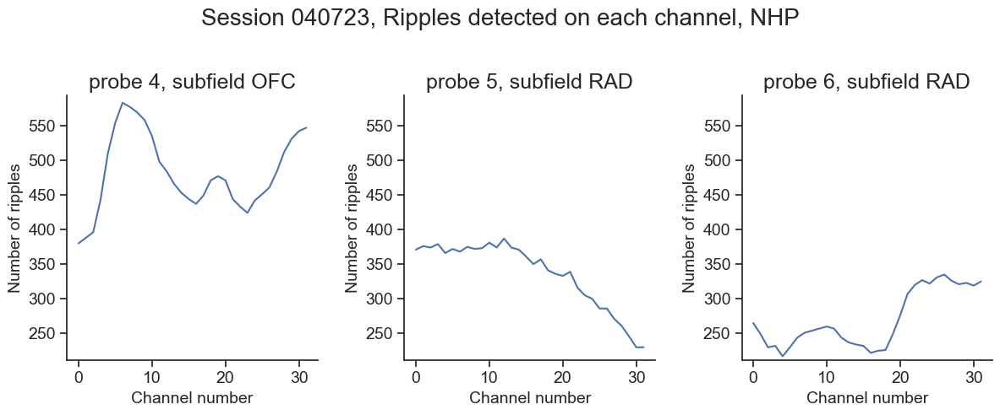

In [151]:
dates = ['031723','032823','033123','032023','040423','040723']
band = [80,180]

for date in dates:

    data = np.load("/Volumes/Extreme SSD/Session %s, Band %i %i ripples.npy" % (date,band[0],band[1]), allow_pickle=True).item()
    probe_info, spikesData, unitNames, neuron_df = load_date_spikes(date)
    ses_probes = probe_info.probe.values
    
    plt.close('all')
    fig, axes = plt.subplots(1,3,figsize=(12,5))
    plt.suptitle('Session %s, Ripples detected on each channel, NHP' % date)
    
    for probe in ses_probes:  
    
        region = unitNames.query("(probe==@probe)").region.unique()[0]
        subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
            
        if region=='HPC':
            
            # Now `data` is the dict you originally saved
            probe_idx = probe-4
            ses_peaks = data["peaks"][probe_idx]
            channels = np.concatenate([np.ones(len(list))*ii for ii,list in enumerate(ses_peaks)])
            peaks = np.concatenate(ses_peaks)
            
            ons = np.concatenate(data["ons"][probe_idx])
            offs   = np.concatenate(data["offs"][probe_idx])
            smoothed = np.concatenate(data["smoothed"][probe_idx])
            zscored = np.concatenate(data["zscored"][probe_idx])
            
            ripple_matrix = np.zeros((spikesData.shape[0],32))
            
            for ii in range(32):
                ts = ses_peaks[ii]
                ripple_matrix[ts,ii] = 1
    
            axes[probe_idx].plot(ripple_matrix.sum(axis=0))
            axes[probe_idx].set_xlabel('Channel number')
            axes[probe_idx].set_ylabel('Number of ripples')
            axes[probe_idx].set_title('probe %i, subfield %s' % (probe,subfield),fontsize=18)
    
    if probe<6:
        axes[2].axis('off')

    ymin = min(ax.get_ylim()[0] for ax in axes[:probe-3])
    ymax = max(ax.get_ylim()[1] for ax in axes[:probe-3])
    
    # Apply same ylim to all axes
    for ax in axes:
        ax.set_ylim(ymin, ymax)
    
    plt.tight_layout(h_pad=2,w_pad=2,rect=[0, 0, 1, 0.95])
    plt.savefig('Session %s, Ripples detected on each channel, NHP' % date)

In [15]:
def get_signal_per_probe(probe_info,date,probe,timestamps,band,all_peaks):

# this retrieves signal from all channels in one probe at a certain timestamp/window

    _, lfpData = import_LFP(date)
    
    int_date = int(date[1:])
    ch_start, ch_end = probe_info.query("(date==@int_date) & (probe==@probe)")[['start_channel','end_channel']].values[0]

    lfps = lfpData[timestamps,:][:,np.arange(ch_start-1, ch_end)]
    rippleband = np.zeros(lfps.shape)
    rippletime = np.zeros(lfps.shape)

    sos = butter(5, band, btype='bandpass', output='sos', fs=1000)

    for ii, channel in enumerate(range(ch_start-1, ch_end)):

        peaks = all_peaks[ii]
        rel_onset = (peaks[(peaks> timestamps[0]) & (peaks<timestamps[-1])]-timestamps[0]).astype(int)
        
        if len(rel_onset)>0:
            rippletime[rel_onset,ii] = 1
    
        preprocessed, _ = preprocess_LFP(lfps[:,ii])
        rippleband[:,ii] = sosfiltfilt(sos, preprocessed)
    

    return lfps,rippleband,rippletime


In [279]:
ripple_df = combine_ripples_per_probe('031723',4,[80,180],interval=25)
ripple_df

,Session,probe,RippleID,peaks,ons,offs,smoothed,zscored,channels
0,031723,4.0,0,6439,6401,6484,0.021372,5.904010,12.0
1,031723,4.0,1,12692,12657,12710,0.023927,3.586704,31.0
2,031723,4.0,2,14595,14568,14621,0.028210,4.702397,31.0
3,031723,4.0,3,22549,22520,22585,0.021404,5.299034,28.0
4,031723,4.0,4,23909,23874,23936,0.018198,4.628714,15.0
...,...,...,...,...,...,...,...,...,...
1893,031723,4.0,1893,5395873,5395844,5395903,0.026773,5.094383,30.0
1894,031723,4.0,1894,5396854,5396827,5396884,0.025108,4.613136,30.0
1895,031723,4.0,1895,5396884,5396846,5396906,0.016581,3.844783,19.0
1896,031723,4.0,1896,5396971,5396943,5397001,0.029524,5.044745,31.0


(array([689., 845., 250.,  60.,  32.,   8.,   3.,   6.,   2.,   3.]),
 array([ 3.15139151,  4.35477809,  5.55816467,  6.76155125,  7.96493783,
         9.16832441, 10.371711  , 11.57509758, 12.77848416, 13.98187074,
        15.18525732]),
 <BarContainer object of 10 artists>)

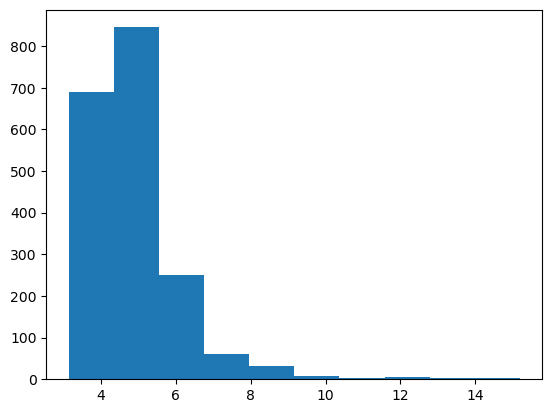

In [281]:
ripple_df.peaks.values

In [285]:
def check_within(x, y, z, tol=25):
 
    within_y = (np.abs(x[:, None] - y[None, :]) <= tol).any(axis=1)
    within_z = (np.abs(x[:, None] - z[None, :]) <= tol).any(axis=1)
    
    return within_y, within_z


In [295]:
x=np.array([1,50,100])
y=np.array([5,80,180,200])
z=np.array([-40,65,110,200,300])

In [297]:
check_within(x, y, z, tol=25)

(array([ True, False,  True]), array([False,  True,  True]))

In [ ]:
def common_ripple_across_probes(date):

    ses_probes=[4,5,6]

    session_ripple = [[] for i in range(len(ses_probes))]
    peaks = [[] for i in range(len(ses_probes))]

    for ii, probe in enumerate(ses_probes):
        
        ripple_df = combine_ripples_per_probe(date,probe,band,interval=25)
        session_ripple[ii] = ripple_df
        peaks[ii]=ripple_df.peaks.values


    idx_A = check_within(peaks[0], peaks[1], peaks[2])
    idx_B = check_within(peaks[1], peaks[0], peaks[2])
    idx_C = check_within(peaks[2], peaks[0], peaks[1])

    
    ripple_df = pd.DataFrame({
        "Session": [date]*len(peaks),
        "probe": probe*np.ones(len(peaks)),
        "RippleID": np.arange(len(peaks)),
        "peaks": peaks,
        "ons": ons,
        "offs": offs,
        "smoothed": smoothed,
        "zscored": zscored,
        "channels": channels
        # "counts": channel_counts
    })

In [17]:
def combine_ripples_per_probe(date,probe,band,interval=25):

    # need refinement, 
    # check ripple interval between channels within a probe, look at amplitude and zscore, 
    # if there are consistent across ripples or not, and how much is the span

    
    data = np.load("/Volumes/Extreme SSD/Session %s, Band %i %i ripples.npy" % (date,band[0],band[1]), allow_pickle=True).item()
    probe_idx = probe-4
    
    # Now `data` is the dict you originally saved
    ses_peaks = data["peaks"][probe_idx]
    channels = np.concatenate([np.ones(len(list))*ii for ii,list in enumerate(ses_peaks)])
    peaks = np.concatenate(ses_peaks)
    ripple_matrix = np.zeros((peaks.max()+1,32))
    
    ons = np.concatenate(data["ons"][probe_idx])
    offs   = np.concatenate(data["offs"][probe_idx])
    smoothed = np.concatenate(data["smoothed"][probe_idx])
    zscored = np.concatenate(data["zscored"][probe_idx])

    uniques, idx = np.unique(peaks,return_index=True)
    
    while True:
    
        if np.sum(np.diff(uniques)<interval)==0:
    
            break
            
        else:
    
            uniques, idx = np.unique(peaks,return_index=True)
            to_be_merged = np.where(np.diff(uniques)<interval)[0]
            
            new_idx = idx.copy()
            
            for ii in to_be_merged:
                
                times_to_merge = np.array([peaks[idx[ii]],peaks[idx[ii+1]]])
                lower = np.argmin([zscored[idx[ii]],zscored[idx[ii+1]]])
                lower_idx = np.array([idx[ii],idx[ii+1]])[lower]
                new_idx = new_idx[new_idx!=lower_idx]
                
            peaks = peaks[new_idx]
            ons = ons[new_idx]
            offs  = offs[new_idx]
            smoothed = smoothed[new_idx]
            zscored = zscored[new_idx]
            channels = channels[new_idx]

    
    # for ii in range(32):
    #     ts = ses_peaks[ii]
    #     ripple_matrix[ts,ii] = 1
        
    # count_ripple = uniform_filter1d(ripple_matrix, size=interval, axis=0, mode="nearest") * interval
    # channel_counts = count_ripple.sum(axis=1)
    # channel_counts = channel_counts[peaks]

    
    ripple_df = pd.DataFrame({
        "Session": [date]*len(peaks),
        "probe": probe*np.ones(len(peaks)),
        "RippleID": np.arange(len(peaks)),
        "peaks": peaks,
        "ons": ons,
        "offs": offs,
        "smoothed": smoothed,
        "zscored": zscored,
        "channels": channels
        # "counts": channel_counts
    })

    
    return ripple_df

<Axes: xlabel='counts', ylabel='Count'>

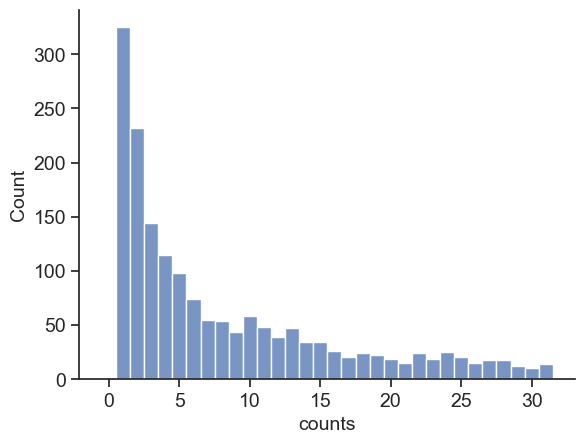

In [127]:
# many counts detect the sample ripple
plt.close('all')
sns.histplot(data=ripple_df,x='counts',bins=np.arange(-0.5,32))

# whether that is correlated to the ripple power
plt.close('all')
sns.scatterplot(data=ripple_df,x='counts',y='zscore')

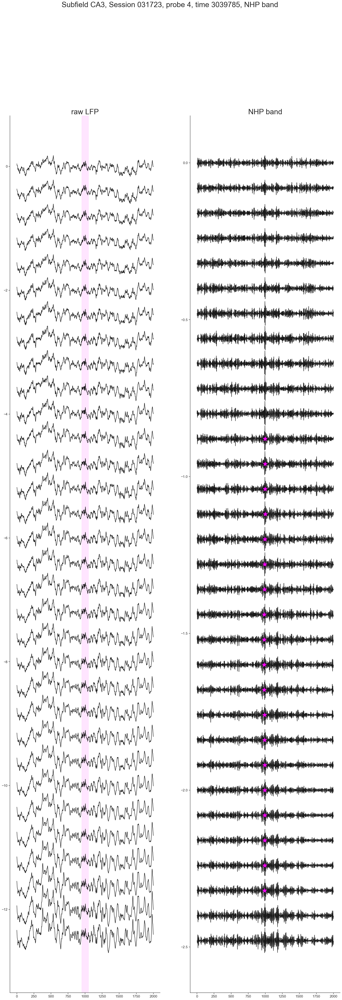

In [209]:
plot_ripple_per_probe(probe_info, unitNames, ripple_df, ses_peaks, subfield, date, probe, counts=15)

In [19]:
def plot_ripple_per_probe(probe_info, unitNames, ripple_df, ses_peaks, subfield,
                          date, probe, band=[80,180], bandname='NHP',
                          counts=1, nsample=10):

    centers = ripple_df.query("counts==@counts").peaks.values
    nsample = np.min([len(centers),nsample])
    
    for center in np.random.choice(centers,size=nsample,replace=False):
        
        timestamps = np.arange(center-1000, center+1000)
        lfps, nhp_ripple_band, nhp_ripple_time = get_signal_per_probe(probe_info, date, probe, timestamps, [80,180], ses_peaks)

        plt.close('all')
        fig, ax = plt.subplots(1, 2, figsize=(24, 64))

        for ii in range(32):
            ax[0].plot(lfps[:, ii] - 0.4*ii, 'k-')
            ax[1].plot(nhp_ripple_band[:, ii] - 0.08*ii, 'k-')

            cols = np.where(nhp_ripple_time[:, ii])[0]
            for jj, col in enumerate(cols):
                ax[1].scatter(col, -0.08*ii, marker='*', s=400,
                              color='magenta', zorder=2)

        ax[0].axvspan(950, 1050, color='magenta', alpha=0.1)
        ax[0].set_title('raw LFP', fontsize=30)
        ax[1].set_title('NHP band', fontsize=30)

        plt.suptitle(
            f"Subfield {subfield}, Session {date}, probe {probe}, time {center}, {bandname} band",
            fontsize=30
        )
        plt.savefig(
            f"Subfield {subfield}, Session {date}, probe {probe}, time {center}, {bandname} band"
        )


In [ ]:
# detect ripples and save the data

dates = ['031723','032023','032823','033123','040423','040723']
band = [80,180]

for date in dates:
    
    date_int = int(date[1:])
    
    timestamps, lfpData  = import_LFP(date)
    nwbfile = import_behavior(date)
    probe_info = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx').query("date==@date_int")
    
    unitNames = nwbfile.units.to_dataframe()
    unit_params = {"drift": 2, "min_fr": 1}
    ses_probes = probe_info.probe.values
    true_peaks_all = []
    ons_all = []
    offs_all = []
    smooth_all = []
    zscore_all = []
    
    for nprobe in ses_probes:
    
        # check if the probe is in pyramidal layer
        region = unitNames.query("(probe==@nprobe)").region.unique()[0]
        subfield = unitNames.query("(probe==@nprobe)").subfield.unique()[0]
    
        if region=='HPC':
    
            print('~~~~~~')
            print(date,nprobe,subfield)
            ch_start, ch_end = probe_info.query("probe==@nprobe")[['start_channel','end_channel']].values[0]
            true_peaks_probe = []
            ons_probe = []
            offs_probe = []  
            smooth_probe = []
            zscore_probe = []
        
            for ch in tqdm(range(ch_start-1, ch_end)):
                    
                preprocessed, noise = preprocess_LFP(lfpData[:, ch], cutoff=15, fs=1000)
                rippleband, smoothed, zscored, true_peaks, ons, offs = detect_ripple(preprocessed, noise, band)

                try:
                    _, idx = np.unique(ons,return_index=True)
                    ons_probe.append(ons[idx])
                    offs_probe.append(offs[idx])
                    true_peaks_probe.append(true_peaks[idx])
                    smooth_probe.append([smoothed[a:b].max() for a, b in zip(ons[idx], offs[idx])])
                    zscore_probe.append([zscored[a:b].max() for a, b in zip(ons[idx], offs[idx])])
                except:
                    print(date,nprobe,'peaks failed to combine')
                    ons_probe.append(ons)
                    offs_probe.append(offs)
                    true_peaks_probe.append(true_peaks)
                    smooth_probe.append([smoothed[a:b].max() for a, b in zip(ons, offs)])
                    zscore_probe.append([zscored[a:b].max() for a, b in zip(ons, offs)])
                    
            true_peaks_all.append(true_peaks_probe)
            ons_all.append(ons_probe)
            offs_all.append(offs_probe)
            smooth_all.append(smooth_probe)
            zscore_all.append(zscore_probe)

    results = {
        "peaks": true_peaks_all,
        "ons": ons_all,
        "offs": offs_all,
        "smoothed": smooth_all,
        "zscored": zscore_all,
    }
    np.save('Session %s, Band %i %i ripples' % (date,band[0],band[1]),results, allow_pickle=True)

~~~~~~
031723 4 CA3


100%|███████████████████████████████████████████| 32/32 [19:29<00:00, 36.55s/it]


~~~~~~
031723 5 CA3


100%|███████████████████████████████████████████| 32/32 [19:05<00:00, 35.81s/it]


~~~~~~
031723 6 CA3


100%|███████████████████████████████████████████| 32/32 [20:27<00:00, 38.37s/it]


~~~~~~
032023 4 CA1


 12%|█████▌                                      | 4/32 [02:13<15:23, 32.98s/it]

In [21]:
def corr_with_pval(x, y):
    # need at least 2 unique values to compute correlation
    if len(x) < 2 or x.nunique() == 1 or y.nunique() == 1:
        return pd.Series({"r": np.nan, "p": np.nan})
    r, p = pearsonr(x, y)
    return pd.Series({"r": r, "p": p})

In [23]:
from matplotlib.colors import LinearSegmentedColormap
def interpolate_colors(color1, color2, num_colors):
    """
    Interpolates a list of colors between two given colors.

    Parameters:
    color1 (str or tuple): The starting color, can be a name or an RGB tuple.
    color2 (str or tuple): The ending color, can be a name or an RGB tuple.
    num_colors (int): The number of colors to generate between color1 and color2.

    Returns:
    list: A list of interpolated colors in RGBA format.
    """
    cmap = LinearSegmentedColormap.from_list('custom_cmap', [color1, color2], N=num_colors)
    colors = [cmap(i) for i in range(num_colors)]
    return colors
    
c1 = "#fc0303" # red
c2 = "#d000ff" # purple
c3 = "#0800ff" # blue
c4 = "#03b6fc" # cyan

caxis_1 = interpolate_colors(c1, c2, 4)
caxis_2 = interpolate_colors(c3, c4, 4)
cmap_2d = np.array([interpolate_colors(caxis_1[i], caxis_2[i], 4) for i in range(4)])

In [25]:
def add_behavior_to_ripple(date,probe,band=[80,180]): 

    # load behavior
    nwbfile = import_behavior(date)
    trial_df = nwbfile.intervals['trials'].to_dataframe().query("trialerror<2")

    # load ripple
    ripple_df = combine_ripples_per_probe(date,probe,band,interval=25)
    if date=='031723':
        ripple_df = ripple_df.query("peaks<4388393") # only for session 031723, had large noise at the end

    # store ripples happend during ITI verus during a trial separately
    ITI = np.zeros(len(ripple_df))  # 1 if happened during ITI, 0 if during a trial
    time_aligned = np.zeros(len(ripple_df)) # if ITI, aligned to stop_time, if within trial, aligned to start_time
    trial = np.zeros(len(ripple_df))
    
    for rr in range(len(ripple_df)):
    
        ripple_time = ripple_df.iloc[rr].peaks
        
        trial_idx = np.where((ripple_time>trial_df.start_time.values) & (ripple_time<trial_df.stop_time.values))[0]
    
        if len(trial_idx)>0:
            time_aligned[rr] = ripple_time - trial_df.iloc[trial_idx[0]].start_time
            trial[rr] = trial_idx[0]
        else:
            iti_idx = np.where((ripple_time<trial_df.start_time.values[1:]) & (ripple_time>trial_df.stop_time.values[:-1]))[0]
            if len(iti_idx)>0:
                ITI[rr]=1
                # trial[rr] = iti_idx[0]   # this aligns to the previous trial 
                # time_aligned[rr] = ripple_time - trial_df.iloc[iti_idx[0]].stop_time
                trial[rr] = iti_idx[0]+1 # this aligns to the next trial 
                time_aligned[rr] = ripple_time - trial_df.iloc[iti_idx[0]+1].start_time
                
            else:
                time_aligned[rr] = np.nan
                trial[rr] = np.nan
                ITI[rr]=np.nan

    trial_ripple = ripple_df.loc[ITI==0,:].copy()
    trial_ripple['time_aligned'] = time_aligned[ITI==0]
    trial_ripple['trial'] = trial[ITI==0]
    trial_ripple = trial_ripple.merge(trial_df.iloc[:,:-1],on='trial')
    trial_ripple["count"] = trial_ripple.groupby("trial")["trial"].transform("size")
    
    ITI_ripple = ripple_df.loc[ITI==1,:].copy()
    ITI_ripple['time_aligned'] = time_aligned[ITI==1]
    ITI_ripple['trial'] = trial[ITI==1]
    ITI_ripple = ITI_ripple.merge(trial_df.iloc[:,:-1],on='trial')
    ITI_ripple["count"] = ITI_ripple.groupby("trial")["trial"].transform("size")


    return trial_ripple, ITI_ripple

In [ ]:
# find ripples that appear at all three probes

one_ripple_index = []
for ii in range(3):
    all_ripple = ripples_all_probes[ii]
    one_ripple_index.append(all_ripple[(all_ripple['count'].values==1) & (all_ripple['time_aligned'].values>0)].trial.values)

intersect = np.intersect1d(np.intersect1d(one_ripple_index[0], one_ripple_index[1]), one_ripple_index[2])

In [25]:
neuron_df = pd.read_hdf("/Volumes/Extreme SSD/SingleNeurons_all_first.h5", key="data")
both = neuron_df.query("spatial_all & spatial_first")
node_neuron = both[both.ref_node_all==both.ref_node_first]
node_neuron

,Session,unitNumber,spatial_all,ref_node_all,diff_node_all,spatial_first,ref_node_first,diff_node_first,probe,region,subfield,distance_first,distance_all
8,031723,108,True,13.0,14,True,13.0,14,4,HPC,CA3,False,True
13,031723,115,True,10.0,10,True,10.0,15,4,HPC,CA3,False,False
28,031723,131,True,14.0,13,True,14.0,15,5,HPC,CA3,True,False
30,031723,134,True,4.0,11,True,4.0,7,5,HPC,CA3,True,True
45,031723,166,True,15.0,11,True,15.0,6,6,HPC,CA3,True,True
62,031723,183,True,15.0,13,True,15.0,11,6,HPC,CA3,True,True
65,031723,188,True,5.0,12,True,5.0,12,6,HPC,CA3,False,False
68,031723,191,True,5.0,14,True,5.0,11,6,HPC,CA3,False,True
70,031723,193,True,15.0,11,True,15.0,14,6,HPC,CA3,False,True
84,032823,145,True,12.0,15,True,12.0,15,4,HPC,CA3,False,True


In [271]:
ripple_in_multiple_probes = pd.DataFrame(data=trial_ripple_time_all,columns=['probe4','probe5','probe6'])
ripple_in_multiple_probes['trial']=intersect

In [277]:
all_ripple

,Session,probe,RippleID,peaks,ons,offs,smoothed,zscored,channels,time_aligned,...,start_time,stop_time,trialerror,nsteps,start,target,block,blocktrialnumber,nodes,count
0,031723,6.0,4,23902,23859,23954,0.013223,5.427514,1.0,5.0,...,23897.0,26023.0,1.0,0.0,7.0,7.0,1.0,2.0,7,1
1,031723,6.0,5,27750,27682,27795,0.018644,9.190254,2.0,273.0,...,27477.0,32955.0,0.0,3.0,9.0,7.0,1.0,3.0,"9,10,11,7",1
2,031723,6.0,6,34417,34394,34446,0.011328,4.389535,4.0,9.0,...,34408.0,38902.0,0.0,2.0,5.0,7.0,1.0,4.0,"5,6,7",4
3,031723,6.0,7,35556,35524,35584,0.012084,4.448304,6.0,1148.0,...,34408.0,38902.0,0.0,2.0,5.0,7.0,1.0,4.0,"5,6,7",4
4,031723,6.0,8,35992,35959,36039,0.015454,7.127750,4.0,1584.0,...,34408.0,38902.0,0.0,2.0,5.0,7.0,1.0,4.0,"5,6,7",4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
738,031723,6.0,1251,4093568,4093535,4093591,0.019340,4.064091,20.0,3346.0,...,3556144.0,3559240.0,0.0,1.0,4.0,8.0,89.0,3.0,"4,8",1
739,031723,6.0,1252,4096623,4096595,4096693,0.011808,4.622779,5.0,237.0,...,3560692.0,3564688.0,0.0,2.0,0.0,8.0,89.0,4.0,"0,4,8",4
740,031723,6.0,1253,4096682,4096614,4096710,0.013860,4.080386,12.0,296.0,...,3560692.0,3564688.0,0.0,2.0,0.0,8.0,89.0,4.0,"0,4,8",4
741,031723,6.0,1254,4096790,4096755,4096820,0.013359,5.704903,3.0,404.0,...,3560692.0,3564688.0,0.0,2.0,0.0,8.0,89.0,4.0,"0,4,8",4


In [273]:
ripple_in_multiple_probes

,probe4,probe5,probe6,trial
0,12.0,16.0,5.0,1.0
1,NaN,NaN,NaN,15.0
2,42.0,36.0,39.0,68.0
3,318.0,311.0,314.0,71.0
4,463.0,460.0,466.0,76.0
5,38.0,NaN,41.0,82.0
6,194.0,199.0,194.0,84.0
7,NaN,NaN,NaN,86.0
8,257.0,267.0,260.0,98.0
9,NaN,NaN,NaN,113.0


In [265]:
# date = '031723'

# ripples_all_probes = [[] for ii in range(3)]
# one_ripple_index = []

# for ii in range(3):
    
#     probe = ii+4
#     trial_ripple, ITI_ripple = add_behavior_to_ripple(date, probe)    
#     ripples_all_probes[ii]=trial_ripple
#     one_ripple_index.append(trial_ripple[(trial_ripple['count'].values==1) & (trial_ripple['time_aligned'].values>0)].trial.values)

# intersect = np.intersect1d(np.intersect1d(one_ripple_index[0], one_ripple_index[1]), one_ripple_index[2])

trial_ripple_time_all = np.zeros((len(intersect),3))

for ii in range(3):
    
    all_ripple = ripples_all_probes[ii]
    
    for jj, trial in enumerate(intersect):
        
        trial_ripple_time = all_ripple.query('trial==@trial').time_aligned.values
        trial_ripple_time = trial_ripple_time[(trial_ripple_time>0) & (trial_ripple_time<500)]
        
        if len(trial_ripple_time)==0:
            trial_ripple_time_all[jj,ii]=np.nan
        else:
            trial_ripple_time_all[jj,ii]=trial_ripple_time

/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_63464/1407443484.py:25: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trial_ripple_time_all[jj,ii]=trial_ripple_time
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_63464/1407443484.py:25: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  trial_ripple_time_all[jj,ii]=trial_ripple_time
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_63464/1407443484.py:25: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated Num

In [87]:
one_ripple_index = []
for ii in range(3):
    all_ripple = ripples_all_probes[ii]
    one_ripple_index.append(all_ripple[(all_ripple['count'].values==1) & (all_ripple['time_aligned'].values>0)].trial.values)

In [91]:
intersect = np.intersect1d(np.intersect1d(one_ripple_index[0], one_ripple_index[1]), one_ripple_index[2])

Text(0.5, 1.0, 'Ripple time detected at each probe, session 031723')

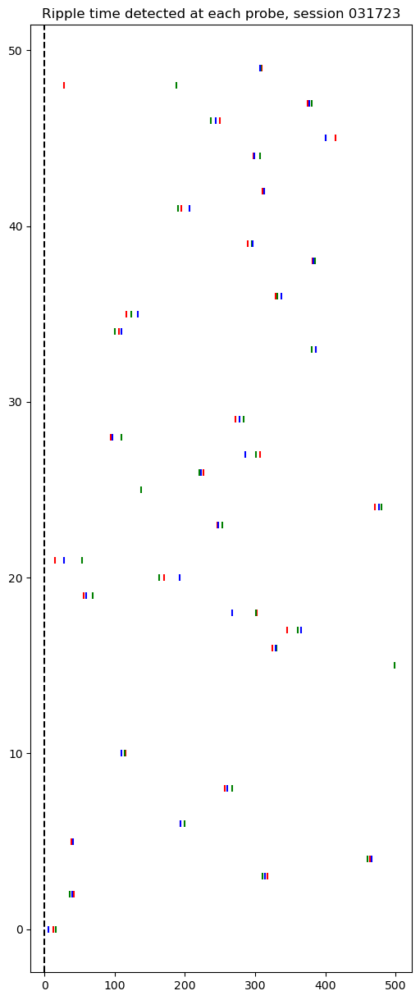

In [263]:
plt.close('all')
plt.figure(figsize=(6,15))
colors=['r','g','b']

for ii in range(3):
    all_ripple = ripples_all_probes[ii].query('time_aligned>0')
    for jj, trial in enumerate(intersect):
        trial_ripple_time = all_ripple.query('trial==@trial').time_aligned.values
        trial_ripple_time = trial_ripple_time[(trial_ripple_time>-500) & (trial_ripple_time<500)]
        plt.scatter(trial_ripple_time,np.ones(len(trial_ripple_time))*jj,marker='|',color=colors[ii])
plt.axvline(0,color='k',ls='--')
plt.title('Ripple time detected at each probe, session %s' % date)
# plt.savefig('Ripple time detected at each probe, session %s' % date)

In [227]:
date = '031723'

ses_neuron = neuron_df.query('Session==@date').copy()

distance2goal = np.zeros((len(ses_neuron),4))
for ii,node in enumerate(ses_neuron.ref_node_first.values):
    for jj,target in enumerate([1,7,8,14]):
        distance2goal[ii,jj]=graph.distance(node,target)
ses_neuron['target_distance_first']=list(distance2goal)

distance2goal = np.zeros((len(ses_neuron),4))
for ii,node in enumerate(ses_neuron.ref_node_all.values):
    for jj,target in enumerate([1,7,8,14]):
        distance2goal[ii,jj]=graph.distance(node,target)
ses_neuron['target_distance_all']=list(distance2goal)

probe = 6

trial_ripple, ITI_ripple = add_behavior_to_ripple(date, probe)
all_ripple = pd.concat([trial_ripple,ITI_ripple])
all_rippleID = all_ripple.RippleID.values

ses_neuron['active_prob_probe%i'%probe] = list(get_activation_prob(date,probe))

Ripples from date 031723, probe 6, CA3


In [237]:
probe = 5

trial_ripple, ITI_ripple = add_behavior_to_ripple(date, probe)
all_ripple = pd.concat([trial_ripple,ITI_ripple])
all_rippleID = all_ripple.RippleID.values

ses_neuron['active_prob_probe%i'%probe] = list(get_activation_prob(date,probe))

Ripples from date 031723, probe 5, CA3


In [239]:
ses_neuron

,Session,unitNumber,spatial_all,ref_node_all,diff_node_all,spatial_first,ref_node_first,diff_node_first,probe,region,subfield,distance_first,distance_all,target_distance_first,target_distance_all,active_prob_probe6,active_prob_probe4,active_prob_probe5
0,031723,97,False,3.0,14,False,8.0,15,4,HPC,CA3,False,False,"[3.0, 4.0, 0.0, 3.0]","[2.0, 1.0, 5.0, 4.0]","[0.21968365553602812, 0.21830985915492956, 0.2...","[0.20798514391829154, 0.19029850746268656, 0.1...","[0.2605042016806723, 0.2510822510822511, 0.292..."
1,031723,98,True,14.0,6,True,8.0,13,4,HPC,CA3,True,False,"[3.0, 4.0, 0.0, 3.0]","[3.0, 3.0, 3.0, 0.0]","[0.2680140597539543, 0.2007042253521127, 0.261...","[0.22284122562674094, 0.19402985074626866, 0.2...","[0.2804621848739496, 0.29004329004329005, 0.22..."
2,031723,100,False,12.0,9,False,15.0,3,4,HPC,CA3,False,False,"[2.0, 2.0, 3.0, 1.0]","[4.0, 5.0, 1.0, 2.0]","[0.5685413005272407, 0.5669014084507042, 0.517...","[0.1532033426183844, 0.1791044776119403, 0.126...","[0.3161764705882353, 0.30303030303030304, 0.33..."
3,031723,102,False,12.0,9,False,13.0,8,4,HPC,CA3,False,False,"[3.0, 4.0, 2.0, 1.0]","[4.0, 5.0, 1.0, 2.0]","[0.24165202108963094, 0.25, 0.2300884955752212...","[0.23584029712163418, 0.27238805970149255, 0.1...","[0.20798319327731093, 0.20346320346320346, 0.2..."
4,031723,103,True,4.0,14,True,8.0,15,4,HPC,CA3,True,False,"[3.0, 4.0, 0.0, 3.0]","[2.0, 3.0, 1.0, 3.0]","[0.1687170474516696, 0.15140845070422534, 0.18...","[0.28040854224698236, 0.26119402985074625, 0.2...","[0.7289915966386554, 0.7142857142857143, 0.673..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,031723,199,True,15.0,13,True,11.0,9,6,HPC,CA3,False,False,"[3.0, 1.0, 3.0, 2.0]","[2.0, 2.0, 3.0, 1.0]","[0.07908611599297012, 0.05985915492957746, 0.0...","[0.2590529247910863, 0.2462686567164179, 0.229...","[0.23004201680672268, 0.23376623376623376, 0.2..."
76,031723,201,True,15.0,8,True,7.0,6,6,HPC,CA3,True,True,"[3.0, 0.0, 4.0, 3.0]","[2.0, 2.0, 3.0, 1.0]","[0.25746924428822493, 0.25704225352112675, 0.2...","[0.0882079851439183, 0.08582089552238806, 0.07...","[0.07142857142857142, 0.05627705627705628, 0.0..."
77,031723,202,True,11.0,14,True,3.0,14,6,HPC,CA3,False,False,"[2.0, 1.0, 5.0, 4.0]","[3.0, 1.0, 3.0, 2.0]","[0.1827768014059754, 0.15845070422535212, 0.14...","[0.08170844939647168, 0.09701492537313433, 0.0...","[0.1869747899159664, 0.1471861471861472, 0.222..."
78,031723,204,True,10.0,7,False,7.0,9,6,HPC,CA3,False,False,"[3.0, 0.0, 4.0, 3.0]","[3.0, 2.0, 2.0, 1.0]","[0.0913884007029877, 0.08098591549295775, 0.10...","[0.16991643454038996, 0.16044776119402984, 0.1...","[0.07878151260504201, 0.07792207792207792, 0.0..."


In [25]:
def get_activation_prob(date,probe,all_rippleID):
    
    spikes_in_ripple_df = get_spikes_in_ripples(date, probe, 'all')

    unitNumbers = spikes_in_ripple_df.unitNumber.unique()
    active_prob = np.zeros((len(unitNumbers),5))
    
    for ii,nn in enumerate(unitNumbers):
    
        active_rippleID = spikes_in_ripple_df.query("unitNumber==@nn").RippleID.values
        active_idx = np.isin(all_rippleID,active_rippleID)
        active_prob[ii,0] = active_idx.mean()
        active_prob[ii,1:] = [active_idx[all_ripple.target.values==g].mean() for g in [1,7,8,14]]

    return active_prob

In [253]:
ses_neuron.groupby('probe')['active_prob_probe6'].apply(
    lambda lists: np.mean(np.stack(lists), axis=0).tolist()
)

probe
4    [0.32623836490268826, 0.318205529473135, 0.320...
5    [0.3570103495411052, 0.3517214397496088, 0.358...
6    [0.19522972633693195, 0.1865191146881287, 0.18...
Name: active_prob_probe6, dtype: object

In [255]:
ses_neuron.groupby('probe')['active_prob_probe4'].apply(
    lambda lists: np.mean(np.stack(lists), axis=0).tolist()
)

probe
4    [0.33343650056741975, 0.3217247097844114, 0.32...
5    [0.3133188899205612, 0.3024461028192372, 0.306...
6    [0.18405624088075342, 0.17515991471215356, 0.1...
Name: active_prob_probe4, dtype: object

In [257]:
ses_neuron.groupby('probe')['active_prob_probe5'].apply(
    lambda lists: np.mean(np.stack(lists), axis=0).tolist()
)

probe
4    [0.38495953937130417, 0.3864037197370532, 0.38...
5    [0.23412698412698413, 0.22967772967772973, 0.2...
6    [0.20354141656662667, 0.20123685837971556, 0.1...
Name: active_prob_probe5, dtype: object

In [ ]:
# should probably exclude choice period

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     2.368
Date:                Thu, 18 Sep 2025   Prob (F-statistic):              0.126
Time:                        01:07:45   Log-Likelihood:                 53.765
No. Observations:                 140   AIC:                            -103.5
Df Residuals:                     138   BIC:                            -97.65
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2336      0.033      7.156      0.0

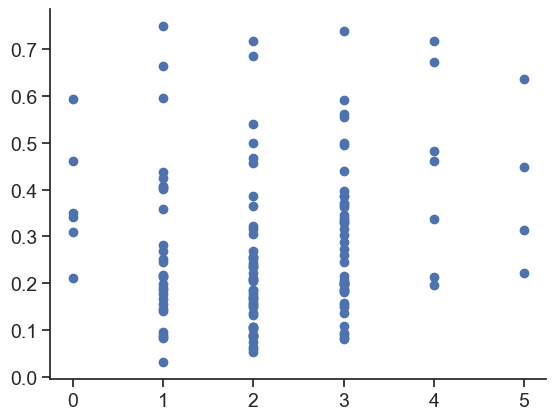

In [249]:
idx = ses_neuron.spatial_all 
y = np.vstack(ses_neuron.active_prob_probe6)[idx,1:]
X = np.vstack(ses_neuron.target_distance_all)[idx]

model = sm.OLS(y.ravel(),add_constant(X.ravel()))
res = model.fit()
print(res.summary())

plt.scatter(X.ravel(),y.ravel())

In [59]:
presence.query("unitNumber==108").values.mean()

0.16911416390336334

(array([10., 15., 22., 11.,  7.,  5.,  3.,  3.,  1.,  3.]),
 array([0.06478659, 0.13132622, 0.19786585, 0.26440549, 0.33094512,
        0.39748476, 0.46402439, 0.53056402, 0.59710366, 0.66364329,
        0.73018293]),
 <BarContainer object of 10 artists>)

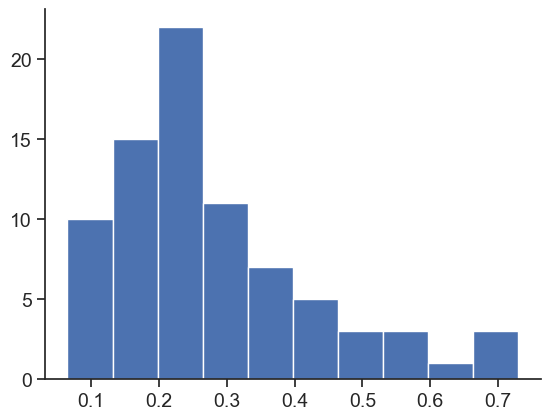

In [83]:
# activation probability for a neuron
presence = (
    spikes_in_ripple_df.groupby(["unitNumber", "RippleID"])
      .size()                         # count occurrences
      .unstack(fill_value=0)          # wide format: Neuron x ripple_id
      .astype(bool)                   # convert to True/False
      .astype(int)                    # optional: 1 for True, 0 for False
)
plt.close('all')
plt.hist(presence.mean(axis=1))

In [ ]:
# look at if teleport neurons have higher activation probability during trials when teleport is used


In [ ]:
# for neurons favor a specific target node, whether it has higher activation probability during the corresponding target block


<Axes: xlabel='time_aligned', ylabel='Percent'>

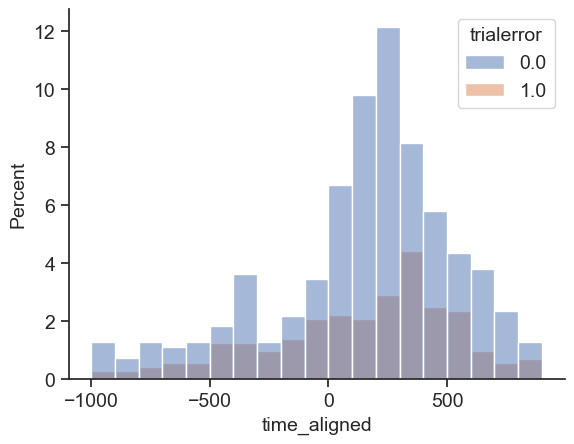

In [159]:
plt.close('all')
sns.histplot(data=all_ripple,x='time_aligned',hue='trialerror',bins=np.arange(-1000,1000,100),stat='percent')

In [77]:
in_trial = ripple_df.query('ITI==0').groupby("trial")[['probe', 'start_time',
       'stop_time', 'trialerror', 'nsteps', 'start', 'target', 'block',
       'blocktrialnumber', 'count']].mean()

In [81]:
iti_count = ripple_df.query('ITI==1').groupby("trial")[['probe', 'start_time',
       'stop_time', 'trialerror', 'nsteps', 'start', 'target', 'block',
       'blocktrialnumber', 'count']].mean()

<Axes: xlabel='blocktrialnumber', ylabel='count'>

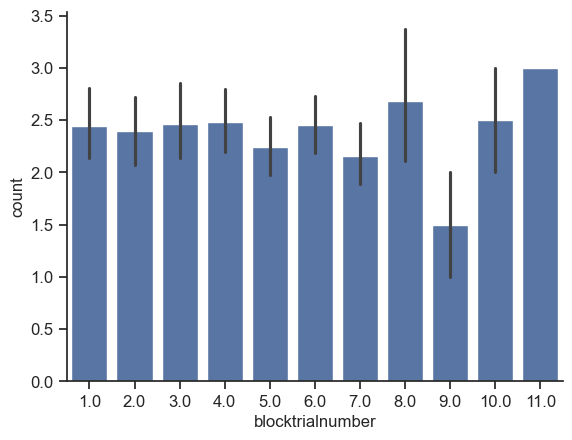

In [79]:
plt.close('all')
sns.barplot(data=in_trial, x='blocktrialnumber',y='count')

<Axes: xlabel='blocktrialnumber', ylabel='count'>

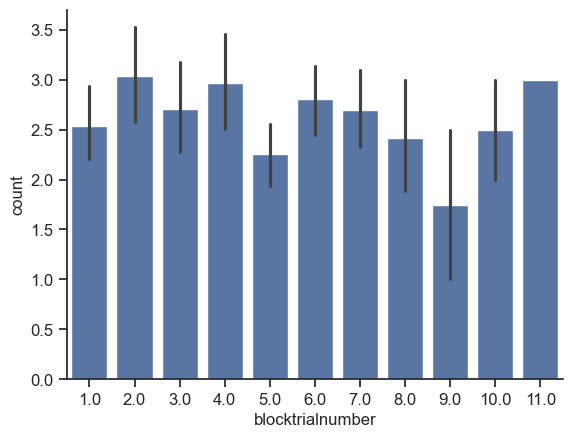

In [83]:
plt.close('all')
sns.barplot(data=iti_count, x='blocktrialnumber',y='count')

Text(0, 0.5, 'Occurrences')

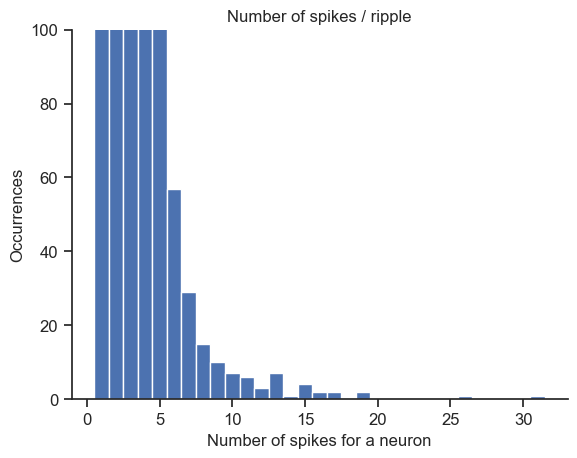

In [105]:
plt.close('all')
plt.hist(spikes_in_ripple_df.Counts.values,bins=np.arange(0.5,32))
plt.ylim(0,100)
plt.title('Number of spikes / ripple')
plt.xlabel('Number of spikes for a neuron')
plt.ylabel('Occurrences')

In [31]:
pd.read_hdf("/Volumes/Extreme SSD/SingleNeurons_all_first.h5", key="data")

,Session,unitNumber,spatial_all,ref_node_all,diff_node_all,spatial_first,ref_node_first,diff_node_first,probe,region,subfield,distance_first,distance_all
0,031723,97,False,3.0,14,False,8.0,15,4,HPC,CA3,False,False
1,031723,98,True,14.0,6,True,8.0,13,4,HPC,CA3,True,False
2,031723,100,False,12.0,9,False,15.0,3,4,HPC,CA3,False,False
3,031723,102,False,12.0,9,False,13.0,8,4,HPC,CA3,False,False
4,031723,103,True,4.0,14,True,8.0,15,4,HPC,CA3,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
478,040723,163,False,4.0,4,False,7.0,0,6,HPC,RAD,False,False
479,040723,164,False,1.0,2,False,12.0,5,6,HPC,RAD,False,False
480,040723,165,False,3.0,5,False,2.0,2,6,HPC,RAD,False,False
481,040723,166,False,10.0,1,False,15.0,1,6,HPC,RAD,True,False


In [27]:
def load_date_spikes(date): 
    
    date_int = int(date[1:])
    probe_info = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx').query("date==@date_int")
    
    lfpFile = h5py.File('/Volumes/Extreme SSD/Teleworld/bart_I/raw/spikes/Bart_TeleWorld_v13_%s-spikes.mat' % date, 'r')
    spikesData = lfpFile['spikeTable']

    nwbfile = import_behavior(date)
    unitNames = nwbfile.units.to_dataframe()   

    neuron_df = pd.read_hdf("/Volumes/Extreme SSD/SingleNeurons_all_first.h5", key="data").query("Session==@date")

    return probe_info, spikesData, unitNames, neuron_df

In [220]:
def get_spikes_in_ripples(date, r_probe, whichspikes, rippleband=[80,180],unit_params = {"drift": 2, "min_fr": 1}):

    # ripple_probes determines which probe ripples are extracted from
    # spike_probes determines from which probe, the neurons are aligned to ripples

    probe_info, spikesData, unitNames, neuron_df = load_date_spikes(date)
    ses_probes = probe_info.probe.values
    spikes_in_ripple_df = pd.DataFrame([])

    region = unitNames.query("(probe==@r_probe)").region.unique()[0]
    subfield = unitNames.query("(probe==@r_probe)").subfield.unique()[0]

    if whichspikes=='all':
        spike_probes = ses_probes
    if whichspikes=='separate':
        spike_probes = [r_probe]

    _, ripple_df = add_behavior_to_ripple(date,probe,band=[80,180])
    
    if date=='031723':
        ripple_df = ripple_df.query("peaks<4388393")
    ch_start, ch_end = probe_info.query("probe==@r_probe")[['start_channel','end_channel']].values[0]  
    peaks, ons, offs = ripple_df[['peaks', 'ons', 'offs']].values.T
    print('Ripples from date %s, probe %i, %s' % (date,r_probe,subfield))

    unit_idx = np.where((unitNames.region == 'HPC') & (unitNames.group == "good") & (unitNames.drift <= unit_params["drift"]) 
                        & (unitNames.fr >= unit_params["min_fr"]) & np.isin(unitNames.probe.values,spike_probes))[0]
        
    for ii in range(len(peaks)):
    
        timestamps = np.arange(ons[ii],offs[ii])
        ripple_spikes = spikesData[timestamps,:][:,unit_idx]      

        spikes_in_ripple = [[],[]]
        for jj, cid in enumerate(unit_idx):
            cid_spikes = np.where(ripple_spikes[:,jj])[0]
            if len(cid_spikes)>0:
                spikes_in_ripple[0].append(np.array([cid+1, unitNames.iloc[cid].probe,
                                                     cid_spikes.mean(), len(cid_spikes),]))
                spikes_in_ripple[1].append(cid_spikes)

        if len(spikes_in_ripple[0])>0:
            df1 = pd.DataFrame(spikes_in_ripple[0], columns=["unitNumber", "SpikeProbe", "SpikeTime", "Counts"])
            df1["SpikesArray"] = spikes_in_ripple[1]
            df1["RippleID"] = ii
            df1["RippleProbe"] = r_probe
            df1["Session"] = date
            spikes_in_ripple_df = pd.concat([spikes_in_ripple_df,df1])
                
    spikes_in_ripple_df = spikes_in_ripple_df.merge(neuron_df,on=['unitNumber','Session'],how="inner")
    spikes_in_ripple_df = spikes_in_ripple_df.merge(ripple_df.drop(columns=["probe"]),on=["Session",'RippleID'],how='inner')

    return spikes_in_ripple_df

In [31]:
def get_pairwise_spikes(spikes_in_ripple_df,whichnode,query="spatial_first & (diff_node_first>5)",mode='neuron'):

    spatial_spikes = spikes_in_ripple_df.query(query)
    pairwise = []

    if mode=='neuron':
    
        for rr in spatial_spikes.RippleID.unique():
        
            ripple_spikes = spatial_spikes.query("RippleID==@rr")
            unitNumber, spiketime, probe, fav_node = ripple_spikes[['unitNumber','SpikeTime','probe',whichnode]].values.T
        
            for i, j in itertools.combinations(np.arange(len(ripple_spikes)), 2):
                
                distance = D[int(fav_node[i]),int(fav_node[j])]
                interval = spiketime[i] - spiketime[j]
                
                pairwise.append(np.array([rr,unitNumber[i],unitNumber[j],probe[i],probe[j],
                                          fav_node[i],fav_node[j],distance,interval]))
    
        if len(pairwise)>0:
            pairwise_df = pd.DataFrame(data = np.vstack(pairwise), columns=['ripple_id','cell1','cell2','probe1','probe2',
                                                                            'node1','node2','distance','interval'])
            pairwise_df['abs_interval'] = np.abs(pairwise_df['interval'])
        else:
            pairwise_df = pd.DataFrame([])


    if mode=='node':
        
        node_spikes = (
            spatial_spikes
            .groupby(["fav_node","RippleID"])["SpikesArray"]
            .apply(lambda x: np.concatenate(x.to_list()))
            .reset_index()
        )
        
        node_spikes['SpikeTime'] = node_spikes['SpikesArray'].apply(lambda x: np.mean(x))
        
        for rr in node_spikes.RippleID.unique():
        
            ripple_spikes = node_spikes.query("RippleID==@rr")
            spiketime, fav_node = ripple_spikes[['SpikeTime','fav_node']].values.T
        
            for i, j in itertools.combinations(np.arange(len(ripple_spikes)), 2):
                
                distance = D[int(fav_node[i]),int(fav_node[j])]
                interval = spiketime[i] - spiketime[j]
                
                pairwise.append(np.array([rr,fav_node[i],fav_node[j],distance,interval]))
        
        if len(pairwise)>0:
            pairwise_df = pd.DataFrame(data = np.vstack(pairwise), columns=['ripple_id','node1','node2','distance','interval'])
            pairwise_df['abs_interval'] = np.abs(pairwise_df['interval'])
        else:
            pairwise_df = pd.DataFrame([])
    
    return pairwise_df

In [115]:
def add_behavior_to_ripple(date,probe,band=[80,180]): 

    # load behavior
    nwbfile = import_behavior(date)
    trial_df = nwbfile.intervals['trials'].to_dataframe().query("trialerror<2")
    node_df = nwbfile.intervals["node_on"].to_dataframe().query("(trialerror<2) & (step==0)")
    action_df = nwbfile.intervals["action_on"].to_dataframe().query("(trialerror<2) & (step==0)")
    
    # load ripple
    ripple_df = combine_ripples_per_probe(date,probe,band,interval=25)
    if date=='031723':
        ripple_df = ripple_df.query("peaks<4388393") # only for session 031723, had large noise at the end

    # store ripples happend during ITI verus during a trial separately
    ITI = np.zeros(len(ripple_df))  # 1 if happened during ITI, 0 if during a trial
    time_aligned = np.zeros(len(ripple_df)) # if ITI, aligned to stop_time, if within trial, aligned to start_time
    trial = np.zeros(len(ripple_df))
    node_ons = np.zeros(len(ripple_df))
    action_ons = np.zeros(len(ripple_df))
    
    for rr in range(len(ripple_df)):
    
        ripple_time = ripple_df.iloc[rr].peaks
        
        trial_idx = np.where((ripple_time>trial_df.start_time.values) & (ripple_time<trial_df.stop_time.values))[0]
    
        if len(trial_idx)>0:
            trial_on = trial_df.iloc[trial_idx[0]].start_time
            time_aligned[rr] = ripple_time - trial_on
            trial[rr] = trial_idx[0]
            node_ons[rr] = node_df.t_on.values[trial_idx[0]] - trial_on
            action_ons[rr] = action_df.t_on.values[trial_idx[0]] - trial_on
        else:
            iti_idx = np.where((ripple_time<trial_df.start_time.values[1:]) & (ripple_time>trial_df.stop_time.values[:-1]))[0]
            if len(iti_idx)>0:
                ITI[rr]=1
                # trial[rr] = iti_idx[0]   # this aligns to the previous trial 
                # time_aligned[rr] = ripple_time - trial_df.iloc[iti_idx[0]].stop_time
                trial[rr] = iti_idx[0]+1 # this aligns to the next trial 
                time_aligned[rr] = ripple_time - trial_df.iloc[iti_idx[0]+1].start_time
                
            else:
                time_aligned[rr] = np.nan
                trial[rr] = np.nan
                ITI[rr]=np.nan

    trial_ripple = ripple_df.loc[ITI==0,:].copy()
    trial_ripple['time_aligned'] = time_aligned[ITI==0]
    trial_ripple['trial'] = trial[ITI==0]
    trial_ripple['node_on'] = node_ons[ITI==0]
    trial_ripple['action_on'] = action_ons[ITI==0]
    trial_ripple['trial2node'] = trial_ripple['time_aligned']<trial_ripple['node_on']
    trial_ripple['node2action'] = (trial_ripple['time_aligned']>trial_ripple['node_on']) & (trial_ripple['time_aligned']<trial_ripple['action_on'])  
    trial_ripple = trial_ripple.merge(trial_df.iloc[:,:-1],on='trial')
    trial_ripple["count"] = trial_ripple.groupby("trial")["trial"].transform("size")
    
    ITI_ripple = ripple_df.loc[ITI==1,:].copy()
    ITI_ripple['time_aligned'] = time_aligned[ITI==1]
    ITI_ripple['trial'] = trial[ITI==1]
    ITI_ripple = ITI_ripple.merge(trial_df.iloc[:,:-1],on='trial')
    ITI_ripple["count"] = ITI_ripple.groupby("trial")["trial"].transform("size")

    
    return trial_ripple, ITI_ripple

In [35]:
neuron_df = pd.read_hdf("/Volumes/Extreme SSD/SingleNeurons_all_first.h5", key="data")
both = neuron_df.query("spatial_all & spatial_first")
node_neuron = both[both.ref_node_all==both.ref_node_first]

In [61]:
trial_ripple, _ = add_behavior_to_ripple(date,probe,band=[80,180])

In [81]:
date = '040423'
probe = 6
spikes_in_ripple_df = get_spikes_in_ripples(date, probe, 'all')

Ripples from date 040423, probe 6, CA1


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_58704/1246449129.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial_all & ~g.distance_all).mean())


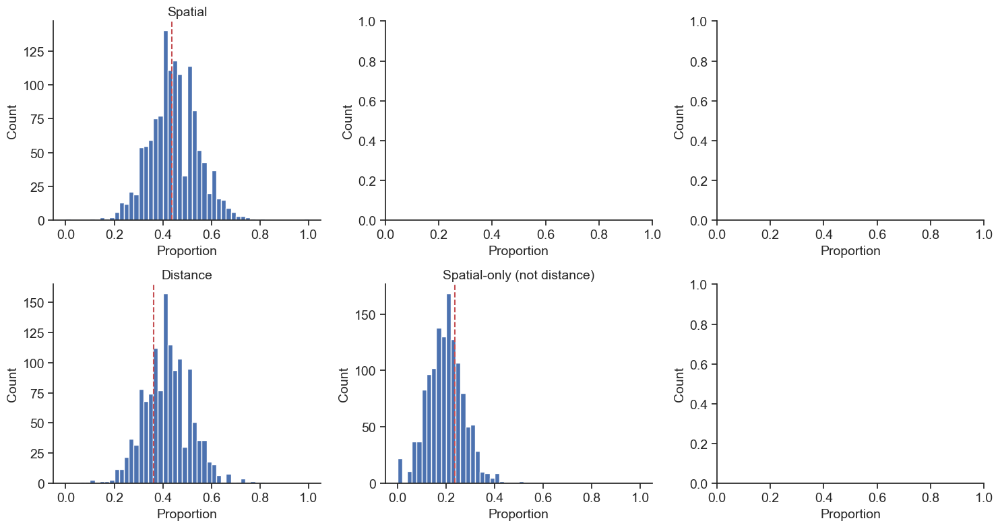

In [219]:
# group once
grp = spikes_in_ripple_df.groupby("RippleID")

fig, ax = plt.subplots(2, 3, figsize=(15, 8))

# existing group means
spatial_vals  = grp.spatial_all.mean()
# target_vals   = grp.target.mean()
# reward_vals   = grp.reward.mean()
distance_vals = grp.distance_all.mean()

# new categories
# spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
spatial_only_vals = grp.apply(lambda g: (g.spatial_all & ~g.distance_all).mean())
# none_vals         = grp.apply(lambda g: (~(g.spatial | g.target | g.reward | g.distance)).mean())

# plot settings
bins = np.arange(0, 1.02, 0.02)

# 1) Spatial
ax[0, 0].hist(spatial_vals, bins=bins)
ax[0, 0].set_title("Spatial")
ax[0, 0].axvline(neuron_df.query("Session==@date").spatial_all.mean(), color='r', ls='--')

# # 2) Target
# ax[0, 1].hist(target_vals, bins=bins)
# ax[0, 1].set_title("Target")
# ax[0, 1].axvline(neuron_df.query("Session==@date").target.mean(), color='r', ls='--')

# # 3) Reward
# ax[0, 2].hist(reward_vals, bins=bins)
# ax[0, 2].set_title("Reward")
# ax[0, 2].axvline(neuron_df.query("Session==@date").reward.mean(), color='r', ls='--')

# 4) Distance
ax[1, 0].hist(distance_vals, bins=bins)
ax[1, 0].set_title("Distance")
ax[1, 0].axvline(neuron_df.query("Session==@date").distance_all.mean(), color='r', ls='--')

# # 5) Spatial-only
# ax[1, 1].hist(spatial_only_vals, bins=bins)
# ax[1, 1].set_title("Spatial-only (not target/reward/distance)")
# ax[1, 1].axvline(
#     (neuron_df.query("Session==@date").eval("spatial & ~(target | reward | distance)")).mean(),
#     color='r', ls='--'
# )

# 5) Spatial-only
ax[1, 1].hist(spatial_only_vals, bins=bins)
ax[1, 1].set_title("Spatial-only (not distance)")
ax[1, 1].axvline(
    (neuron_df.query("Session==@date").eval("spatial_all & ~distance_all")).mean(),
    color='r', ls='--'
)

# # 6) None
# ax[1, 2].hist(none_vals, bins=bins)
# ax[1, 2].set_title("None (all false)")
# ax[1, 2].axvline(
#     (neuron_df.query("Session==@date").eval("~(spatial | target | reward | distance)")).mean(),
#     color='r', ls='--'
# )

# labels
for a in ax.flat:
    a.set_xlabel("Proportion")
    a.set_ylabel("Count")

plt.tight_layout()
plt.show()


Ripples from date 031723, probe 4, CA3


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 031723, probe 5, CA3


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 031723, probe 6, CA3


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 032823, probe 4, CA3


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 032823, probe 5, CA1


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 032823, probe 6, CA1


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 033123, probe 4, CA3


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 033123, probe 5, CA3


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 033123, probe 6, CA3


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 032023, probe 4, CA1


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 032023, probe 5, CA1


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 040423, probe 4, RAD


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 040423, probe 5, CA1


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 040423, probe 6, CA1


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 040723, probe 4, OFC


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 040723, probe 5, RAD


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

Ripples from date 040723, probe 6, RAD


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:33: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_93796/2325579214.py:34: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  none_vals         = grp.apply(lambda g: (~(g.spatial |

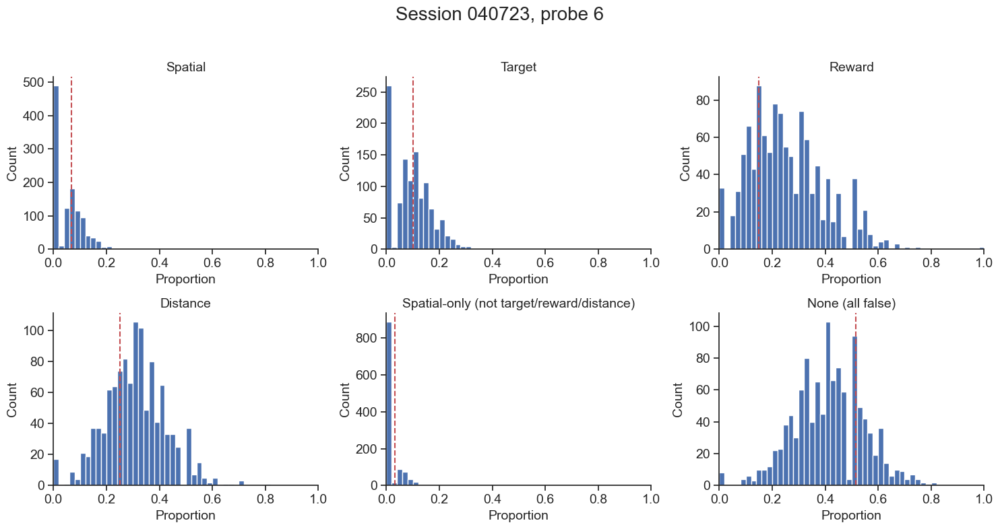

In [81]:
dates = ['031723','032823','033123','032023','040423','040723']

# dates = ['031723']

for date in dates:
        
    date_int = int(date[1:])
    probe_info, spikesData, unitNames, neuron_df = load_date_spikes(date)
    ses_probes = probe_info.probe.values
    
    
    for probe in ses_probes:  
    
        region = unitNames.query("(probe==@probe)").region.unique()[0]
        subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
            
        if region=='HPC':
        
            spikes_in_ripple_df = get_spikes_in_ripples(date, probe, 'all')
            # group once to avoid repeating
            grp = spikes_in_ripple_df.groupby("RippleID")

            plt.close('all')
            fig, ax = plt.subplots(2, 3, figsize=(15, 8))
            
            # existing group means
            spatial_vals  = grp.spatial.mean()
            target_vals   = grp.target.mean()
            reward_vals   = grp.reward.mean()
            distance_vals = grp.distance.mean()
            
            # new categories
            spatial_only_vals = grp.apply(lambda g: (g.spatial & ~(g.target | g.reward | g.distance)).mean())
            none_vals         = grp.apply(lambda g: (~(g.spatial | g.target | g.reward | g.distance)).mean())
            
            # plot settings
            bins = np.arange(0, 1.02, 0.02)
            
            # 1) Spatial
            ax[0, 0].hist(spatial_vals, bins=bins)
            ax[0, 0].set_title("Spatial")
            ax[0, 0].axvline(neuron_df.query("Session==@date").spatial.mean(), color='r', ls='--')
            
            # 2) Target
            ax[0, 1].hist(target_vals, bins=bins)
            ax[0, 1].set_title("Target")
            ax[0, 1].axvline(neuron_df.query("Session==@date").target.mean(), color='r', ls='--')
            
            # 3) Reward
            ax[0, 2].hist(reward_vals, bins=bins)
            ax[0, 2].set_title("Reward")
            ax[0, 2].axvline(neuron_df.query("Session==@date").reward.mean(), color='r', ls='--')
            
            # 4) Distance
            ax[1, 0].hist(distance_vals, bins=bins)
            ax[1, 0].set_title("Distance")
            ax[1, 0].axvline(neuron_df.query("Session==@date").distance.mean(), color='r', ls='--')
            
            # 5) Spatial-only
            ax[1, 1].hist(spatial_only_vals, bins=bins)
            ax[1, 1].set_title("Spatial-only (not target/reward/distance)")
            ax[1, 1].axvline(
                (neuron_df.query("Session==@date").eval("spatial & ~(target | reward | distance)")).mean(),
                color='r', ls='--'
            )
            
            # 6) None
            ax[1, 2].hist(none_vals, bins=bins)
            ax[1, 2].set_title("None (all false)")
            ax[1, 2].axvline(
                (neuron_df.query("Session==@date").eval("~(spatial | target | reward | distance)")).mean(),
                color='r', ls='--'
            )
            
            # labels
            for a in ax.flat:
                a.set_xlabel("Proportion")
                a.set_ylabel("Count")
                        
            # set the same x-axis limits across all
            xmin = min(spatial_vals.min(), target_vals.min(), reward_vals.min(), distance_vals.min())
            xmax = max(spatial_vals.max(), target_vals.max(), reward_vals.max(), distance_vals.max())
            for a in ax.flat:
                a.set_xlim(xmin, xmax)
            
            plt.tight_layout(rect=[0,0,1,0.9])
            plt.suptitle("Session %s, probe %i" % (date,probe))
            plt.savefig("Session %s, probe %i, proportion of spatial, nonspatial neurons in ripple" % (date,probe))


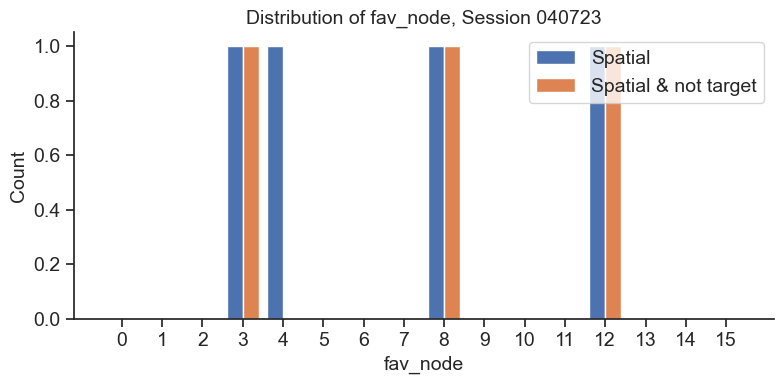

In [77]:
dates = ['031723','032023','032823','033123','040423','040723']

for date in dates:
    neuron_df = pd.read_hdf("/Volumes/Extreme SSD/SingleNeurons.h5", key="data").query("Session==@date")
    plot_fav_node_dist(neuron_df)

In [75]:
def plot_fav_node_dist(neuron_df):
    
    plt.close('all')
    fig, ax = plt.subplots(figsize=(8, 4))
    
    # data
    data1 = neuron_df.query("spatial").fav_node.values
    data2 = neuron_df.query("spatial & ~target").fav_node.values
    
    # bins (centers at integers)
    bins = np.arange(-0.5, 16)
    
    # histogram counts
    counts1, _ = np.histogram(data1, bins=bins)
    counts2, _ = np.histogram(data2, bins=bins)
    
    # x positions (center of each bin)
    x = np.arange(16)
    
    # bar width (make them narrower so they don’t overlap)
    width = 0.4
    
    ax.bar(x - width/2, counts1, width=width, color="C0", label="Spatial")
    ax.bar(x + width/2, counts2, width=width, color="C1", label="Spatial & not target")
    
    ax.set_xticks(x)
    ax.set_xlabel("fav_node")
    ax.set_ylabel("Count")
    ax.set_title("Distribution of fav_node, Session %s" % date)
    ax.legend()
    
    plt.tight_layout()
    plt.savefig("Distribution of fav_node, Session %s" % date)


In [145]:
correlation = [[] for ii in range(4)]
pvalues = [[] for ii in range(4)]

dates = ['031723','032823','033123','032023','040423','040723']


for date in dates:
        
    date_int = int(date[1:])
    probe_info, spikesData, unitNames, neuron_df = load_date_spikes(date)
    ses_probes = probe_info.probe.values
    
    for probe in ses_probes:  
    
        region = unitNames.query("(probe==@probe)").region.unique()[0]
        subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
            
        if region=='HPC':
        
            spikes_in_ripple_df = get_spikes_in_ripples(date, probe, 'all')
            
            pairwise_df = get_pairwise_spikes(spikes_in_ripple_df,'ref_node_first',query='spatial_first & trial2node',mode='neuron')
            if len(pairwise_df)>0:
                r,p = pearsonr(pairwise_df.distance.values,pairwise_df.abs_interval.values)
                correlation[0].append(r)
                pvalues[0].append(p)
            else: 
                correlation[0].append(np.nan)
                pvalues[0].append(np.nan)
                
            pairwise_df = get_pairwise_spikes(spikes_in_ripple_df,'ref_node_all',query='spatial_all & trial2node',mode='neuron')
            if len(pairwise_df)>0:
                r,p = pearsonr(pairwise_df.distance.values,pairwise_df.abs_interval.values)
                correlation[1].append(r)
                pvalues[1].append(p)
            else: 
                correlation[1].append(np.nan)
                pvalues[1].append(np.nan)
            
            pairwise_df = get_pairwise_spikes(spikes_in_ripple_df,'ref_node_first',query='spatial_first & node2action',mode='neuron')
            if len(pairwise_df)>0:
                r,p = pearsonr(pairwise_df.distance.values,pairwise_df.abs_interval.values)
                correlation[2].append(r)
                pvalues[2].append(p)
            else: 
                correlation[2].append(np.nan)
                pvalues[2].append(np.nan)
                
            pairwise_df = get_pairwise_spikes(spikes_in_ripple_df,'ref_node_all',query='spatial_all & node2action',mode='neuron')
            if len(pairwise_df)>0:
                r,p = pearsonr(pairwise_df.distance.values,pairwise_df.abs_interval.values)
                correlation[3].append(r)
                pvalues[3].append(p)
            else: 
                correlation[3].append(np.nan)
                pvalues[3].append(np.nan)


Ripples from date 031723, probe 4, CA3
Ripples from date 031723, probe 5, CA3
Ripples from date 031723, probe 6, CA3
Ripples from date 032823, probe 4, CA3
Ripples from date 032823, probe 5, CA1
Ripples from date 032823, probe 6, CA1
Ripples from date 033123, probe 4, CA3
Ripples from date 033123, probe 5, CA3
Ripples from date 033123, probe 6, CA3
Ripples from date 032023, probe 4, CA1
Ripples from date 032023, probe 5, CA1
Ripples from date 040423, probe 4, RAD


/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_75633/220170585.py:33: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  r,p = pearsonr(pairwise_df.distance.values,pairwise_df.abs_interval.values)


ValueError: x and y must have length at least 2.

(array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,  18.,  29.,  11.,   0.,  86.,  33.,  77., 155., 103.,  76.,
         79.,  42., 111., 176., 272., 154., 288., 115., 133., 192., 226.,
        200., 118., 109., 133., 263., 176.]),
 array([-2000., -1950., -1900., -1850., -1800., -1750., -1700., -1650.,
        -1600., -1550., -1500., -1450., -1400., -1350., -1300., -1250.,
        -1200., -1150., -1100., -1050., -1000.,  -950.,  -900.,  -850.,
         -800.,  -750.,  -700.,  -650.,  -600.,  -550.,  -500.,  -450.,
         -400.,  -350.,  -300.,  -250.,  -200.,  -150.,  -100.,   -50.]),
 <BarContainer object of 39 artists>)

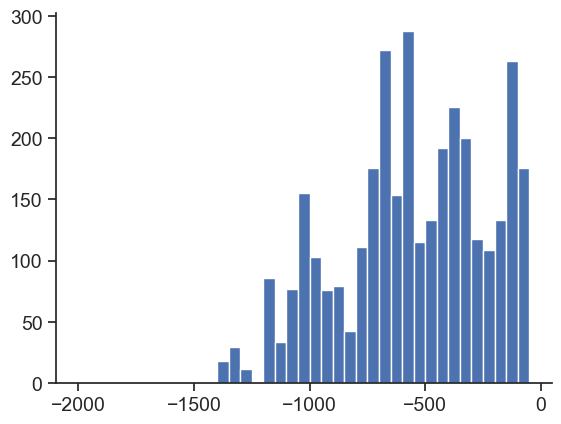

In [234]:
plt.close('all')
plt.hist(spikes_in_ripple_df.time_aligned.values,bins=np.arange(-2000,0,50))

In [248]:
# look at trial by trial

correlation = [[] for ii in range(4)]
pvalues = [[] for ii in range(4)]

dates = ['031723','032823','033123','032023']


for date in dates:
        
    date_int = int(date[1:])
    probe_info, spikesData, unitNames, neuron_df = load_date_spikes(date)
    ses_probes = probe_info.probe.values
    
    for probe in ses_probes:  
    
        region = unitNames.query("(probe==@probe)").region.unique()[0]
        subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
            
        if region=='HPC':
        
            spikes_in_ripple_df = get_spikes_in_ripples(date, probe, 'all')
            
                
            pairwise_df = get_pairwise_spikes(spikes_in_ripple_df,'ref_node_all',query='spatial_all & (blocktrialnumber==1)',mode='neuron')
            if len(pairwise_df)>0:
                r,p = pearsonr(pairwise_df.distance.values,pairwise_df.abs_interval.values)
                correlation[1].append(r)
                pvalues[1].append(p)
            else: 
                correlation[1].append(np.nan)
                pvalues[1].append(np.nan)
            
                
            pairwise_df = get_pairwise_spikes(spikes_in_ripple_df,'ref_node_all',query='spatial_all & (blocktrialnumber==3)',mode='neuron')
            if len(pairwise_df)>0:
                r,p = pearsonr(pairwise_df.distance.values,pairwise_df.abs_interval.values)
                correlation[3].append(r)
                pvalues[3].append(p)
            else: 
                correlation[3].append(np.nan)
                pvalues[3].append(np.nan)


Ripples from date 031723, probe 4, CA3
Ripples from date 031723, probe 5, CA3
Ripples from date 031723, probe 6, CA3
Ripples from date 032823, probe 4, CA3
Ripples from date 032823, probe 5, CA1
Ripples from date 032823, probe 6, CA1
Ripples from date 033123, probe 4, CA3
Ripples from date 033123, probe 5, CA3
Ripples from date 033123, probe 6, CA3
Ripples from date 032023, probe 4, CA1
Ripples from date 032023, probe 5, CA1


Text(0.5, 0.98, 'ITI')

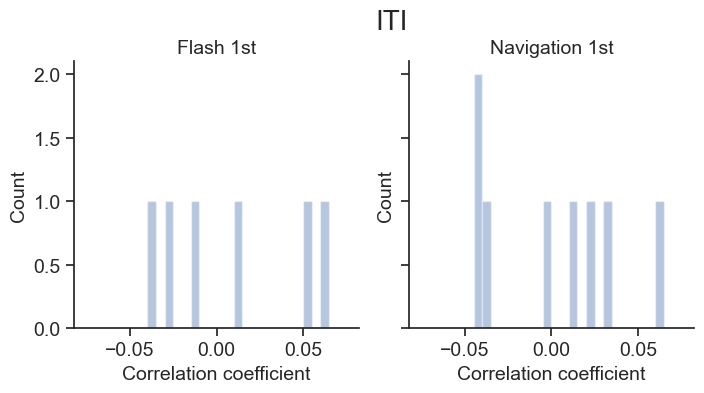

In [252]:
plt.close('all')

fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)
titles = ['Flash 1st','Navigation 1st']
bins = np.arange(-0.075, 0.08, 0.005)

ax = axes[0]
ax.hist(correlation[1], bins=bins, alpha=0.4)
ax.set_xlabel('Correlation coefficient')
ax.set_ylabel('Count')
ax.set_title(titles[0])

ax = axes[1]
ax.hist(correlation[3], bins=bins, alpha=0.4)
ax.set_xlabel('Correlation coefficient')
ax.set_ylabel('Count')
ax.set_title(titles[1])

plt.tight_layout(rect=[0,0,0.9,0.95])
plt.suptitle('ITI')


In [197]:
correlation_df = correlation_df.reset_index()

In [213]:
correlation_df = correlation_df.drop(columns=['index'])

In [ ]:
dates = ['031723','032823','033123','032023','040423','040723']


Ripples from date 032023, probe 5, CA1


(0.0, 45.0)

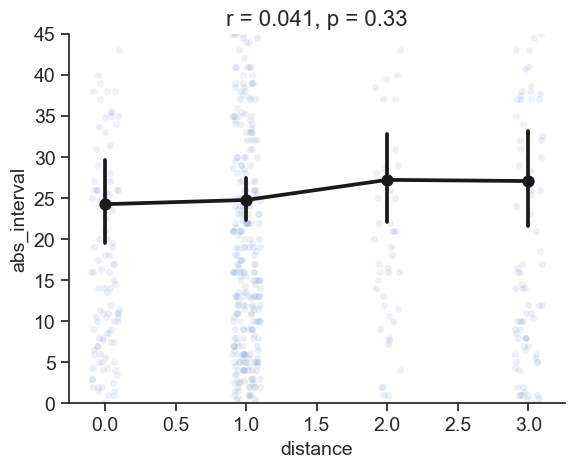

In [197]:
date = '032023'
probe = 5
spikes_in_ripple_df = get_spikes_in_ripples(date, probe, 'all')
pairwise_df = get_pairwise_spikes(spikes_in_ripple_df,'ref_node_all',query='spatial_all & (trialerror==0)',mode='neuron')

# n = 8
# df = pairwise_df.query("node1==@n | node2==@n")
df = pairwise_df.copy()

plt.close('all')
sns.stripplot(data=df, x='distance', y='abs_interval', native_scale=True,
              alpha=.1, legend=False, zorder=1)
sns.pointplot(data =df, x='distance', y='abs_interval',color='k',zorder=2,
              native_scale=True)
r,p = pearsonr(df.distance.values,df.abs_interval.values)
plt.title('r = %.2g, p = %.2g' % (r,p),fontsize=16)
plt.ylim(0,45)

In [217]:
# correlation_df.to_hdf("ripple_correlation.h5",key='data')

In [7]:
# correlation_df = pd.read_hdf("/Volumes/Extreme SSD/ripple_correlation.h5", key="data")

In [9]:
correlation_df['CA3']=correlation_df['subfield']=='CA3'

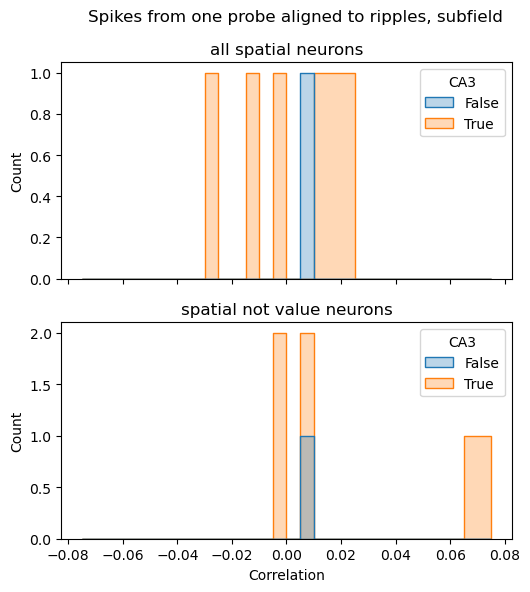

In [45]:


fig, axes = plt.subplots(2, 1, figsize=(6, 6), sharex=True)

cols = [
    ('separate_spatia_first_all', 'all spatial neurons'),
    ('separate_spatia_first_not_value', 'spatial not value neurons'),
]

for ax, (col, label) in zip(axes, cols):
    sns.histplot(data=correlation_df, x=col, bins=np.arange(-0.075,0.08,0.005),hue='CA3',
                 element='step', alpha=0.3, ax=ax)
    ax.set_ylabel('Count')
    ax.set_title(label)

axes[-1].set_xlabel('Correlation')

plt.tight_layout(rect=[0,0,0.9,0.95])
plt.suptitle('Spikes from one probe aligned to ripples, subfield')
plt.savefig('Spikes from one probe aligned to ripples, subfield')

In [208]:
correlation_df['separate_spatia_first_all']=correlation[0]
correlation_df['separate_spatia_all_all']=correlation[1]
correlation_df['separate_spatia_first_not_value']=correlation[2]
correlation_df['separate_spatia_all_not_value']=correlation[3]

In [133]:
correlation_df = pd.DataFrame()
dates = ['031723','032823','033123','032023','040423','040723']

for date in dates:
        
    date_int = int(date[1:])
    probe_info, spikesData, unitNames, neuron_df = load_date_spikes(date)
    ses_probes = probe_info.probe.values
    
    
    for probe in ses_probes:  
    
        region = unitNames.query("(probe==@probe)").region.unique()[0]
        subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
            
        if region=='HPC':

            correlation_df = pd.concat([correlation_df,pd.DataFrame(data={'Session':date,'probe':probe,'subfield':subfield},index=[0])])

In [219]:
correlation_df

,Session,probe,subfield,spatia_first_all,spatia_all_all,spatia_first_not_value,spatia_all_not_value,separate_spatia_first_all,separate_spatia_all_all,separate_spatia_first_not_value,separate_spatia_all_not_value
0,031723,4,CA3,-0.016248,0.010365,0.001039,0.002162,0.024506,0.015406,0.065538,0.029874
1,031723,5,CA3,-0.014569,0.024417,0.007610,0.006564,0.018013,0.088358,0.073424,0.103874
2,031723,6,CA3,-0.004283,0.009898,0.015646,0.002289,-0.025443,0.039232,0.008880,0.037429
3,032823,4,CA3,-0.006933,0.031254,0.015997,0.037032,-0.012604,0.031484,0.005820,0.048842
4,032823,5,CA1,-0.004276,0.040424,0.004398,0.035277,-0.144116,NaN,-0.144116,NaN
5,032823,6,CA1,-0.001998,0.030704,0.016826,0.041234,NaN,NaN,NaN,NaN
6,033123,4,CA3,-0.005541,-0.016997,-0.009186,-0.034320,0.010218,-0.050944,-0.002380,-0.135348
7,033123,5,CA3,0.006683,-0.007409,0.002357,-0.017530,NaN,NaN,NaN,NaN
8,033123,6,CA3,-0.002206,-0.015639,-0.004817,-0.035334,-0.000941,0.056280,-0.002958,0.031765
9,032023,4,CA1,0.000855,0.040671,0.000855,0.040671,NaN,NaN,NaN,NaN


In [243]:
pairwise_df.drop_duplicates(['cell1','cell2'])

,ripple_id,cell1,cell2,probe1,probe2,node1,node2,distance,interval,abs_interval
0,0.0,134.0,159.0,5.0,5.0,4.0,15.0,2.0,52.333333,52.333333
1,0.0,134.0,164.0,5.0,5.0,4.0,1.0,2.0,-12.666667,12.666667
2,0.0,159.0,164.0,5.0,5.0,15.0,1.0,2.0,-65.000000,65.000000
5,6.0,149.0,164.0,5.0,5.0,14.0,1.0,3.0,-75.000000,75.000000
6,7.0,149.0,159.0,5.0,5.0,14.0,15.0,1.0,30.000000,30.000000
9,11.0,134.0,149.0,5.0,5.0,4.0,14.0,3.0,18.000000,18.000000
51,122.0,150.0,164.0,5.0,5.0,14.0,1.0,3.0,17.000000,17.000000
52,125.0,149.0,150.0,5.0,5.0,14.0,14.0,0.0,-18.571429,18.571429
53,127.0,134.0,150.0,5.0,5.0,4.0,14.0,3.0,3.500000,3.500000
60,142.0,150.0,159.0,5.0,5.0,14.0,15.0,1.0,11.200000,11.200000


Ripples from date 031723, probe 4, CA3
Ripples from date 031723, probe 5, CA3
Ripples from date 031723, probe 6, CA3
Ripples from date 032823, probe 4, CA3
Ripples from date 032823, probe 5, CA1
Ripples from date 032823, probe 6, CA1
Ripples from date 033123, probe 4, CA3
Ripples from date 033123, probe 5, CA3
Ripples from date 033123, probe 6, CA3
Ripples from date 032023, probe 4, CA1
Ripples from date 032023, probe 5, CA1
Ripples from date 040423, probe 4, RAD
Ripples from date 040423, probe 5, CA1
Ripples from date 040423, probe 6, CA1
Ripples from date 040723, probe 4, OFC
Ripples from date 040723, probe 5, RAD
Ripples from date 040723, probe 6, RAD


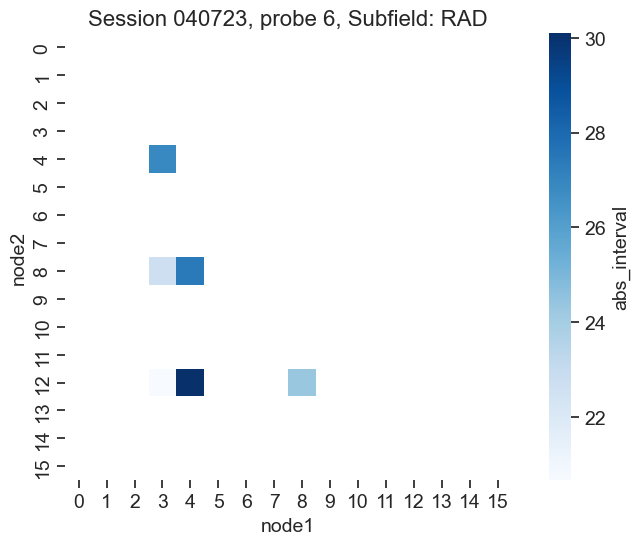

In [179]:
dates = ['031723','032823','033123','032023','040423','040723']

# dates = ['032823']


for date in dates:
        
    date_int = int(date[1:])
    probe_info, spikesData, unitNames, neuron_df = load_date_spikes(date)
    ses_probes = probe_info.probe.values
    
    
    for probe in ses_probes:  
    
        region = unitNames.query("(probe==@probe)").region.unique()[0]
        subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
            
        if region=='HPC':
        
            spikes_in_ripple_df = get_spikes_in_ripples(date, probe, 'all')
            pairwise_df = get_pairwise_spikes(spikes_in_ripple_df,query="spatial",mode='node')
            
            df = pairwise_df.groupby(['node1','node2'])['abs_interval'].mean().reset_index()
            nodes = np.arange(16)
            heatmap_data = df.pivot(index="node2", columns="node1", values="abs_interval")
            heatmap_data = heatmap_data.reindex(index=nodes, columns=nodes)

            plt.close('all')
            plt.figure(figsize=(8,6))
            sns.heatmap(
                heatmap_data,
                cmap="Blues",
                annot=False,
                square=True,
                cbar_kws={"label": "abs_interval"},
                mask=heatmap_data.isna()  # hide blanks
            )
            
            plt.xlabel("node1")
            plt.ylabel("node2")
            
            plt.xticks(np.arange(16) + 0.5, np.arange(16))
            plt.yticks(np.arange(16) + 0.5, np.arange(16))
            plt.tight_layout(h_pad=2,w_pad=2,rect=[0, 0, 1, 0.9])
            
            plt.title('Session %s, probe %i, Subfield: %s' % (date,probe, subfield), fontsize=16)
            plt.savefig('Session %s, probe %i, heatmap' % (date,probe))

Ripples from date 031723, probe 4, CA3
Ripples from date 031723, probe 5, CA3
Ripples from date 031723, probe 6, CA3
Ripples from date 032823, probe 4, CA3
Ripples from date 032823, probe 5, CA1
Ripples from date 032823, probe 6, CA1
Ripples from date 033123, probe 4, CA3
Ripples from date 033123, probe 5, CA3
Ripples from date 033123, probe 6, CA3
Ripples from date 032023, probe 4, CA1
Ripples from date 032023, probe 5, CA1
Ripples from date 040423, probe 4, RAD
Ripples from date 040423, probe 5, CA1
Ripples from date 040423, probe 6, CA1
Ripples from date 040723, probe 4, OFC
Ripples from date 040723, probe 5, RAD
Ripples from date 040723, probe 6, RAD


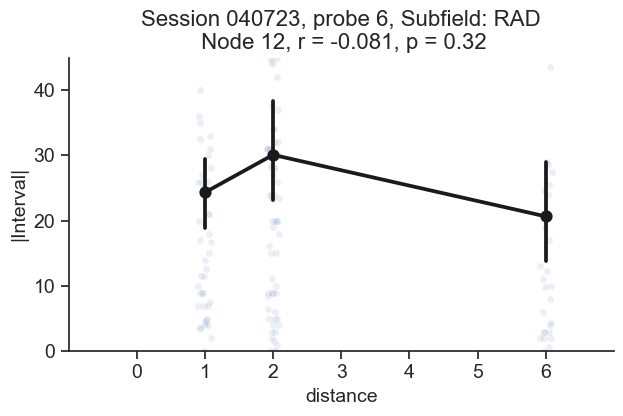

In [145]:
dates = ['031723','032823','033123','032023','040423','040723']

# dates = ['032823']


for date in dates:
        
    date_int = int(date[1:])
    probe_info, spikesData, unitNames, neuron_df = load_date_spikes(date)
    ses_probes = probe_info.probe.values
    
    
    for probe in ses_probes:  
    
        region = unitNames.query("(probe==@probe)").region.unique()[0]
        subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
            
        if region=='HPC':
        
            spikes_in_ripple_df = get_spikes_in_ripples(date, probe, 'all')
            pairwise_df = get_pairwise_spikes(spikes_in_ripple_df,query="spatial",mode='node')

            for n in range(16):
                    
                df = pairwise_df.query("node1==@n | node2==@n")
    
                if len(df)>0:

                    plt.close('all')
                    sns.stripplot(data=df, x='distance', y='abs_interval', native_scale=True,
                                  alpha=.1, legend=False, zorder=1)
                    sns.pointplot(data =df, x='distance', y='abs_interval',color='k',zorder=2,
                                  native_scale=True)
                    r,p = pearsonr(df.distance.values,df.abs_interval.values)
                    
                    plt.ylabel('|Interval|')
                    plt.ylim(0, 45)
                    plt.xlim(-1, 7)
                    plt.xticks(np.arange(7))
                    plt.title('Session %s, probe %i, Subfield: %s\n Node %i, r = %.2g, p = %.2g' % (date,probe, subfield, n, r, p), fontsize=16)
                
                    plt.tight_layout(h_pad=2,w_pad=2,rect=[0, 0, 1, 0.9])
                    plt.savefig('Session %s, probe %i, node %i correlation' % (date,probe,n))

Ripples from date 032823, probe 4, CA3
Ripples from date 032823, probe 5, CA1
Ripples from date 032823, probe 6, CA1


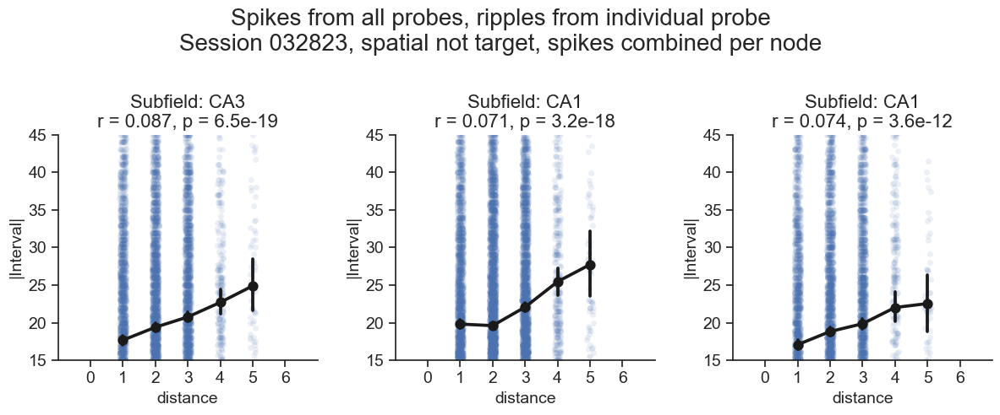

In [125]:
dates = ['031723','032823','033123','032023','040423','040723']

dates = ['032823']


for date in dates:
        
    date_int = int(date[1:])
    probe_info, spikesData, unitNames, neuron_df = load_date_spikes(date)
    ses_probes = probe_info.probe.values
    
    plt.close('all')
    fig, ax = plt.subplots(1,3,figsize=(12,5))
    plt.suptitle('Session %s' % date)
    
    for probe in ses_probes:  
    
        region = unitNames.query("(probe==@probe)").region.unique()[0]
        subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
            
        if region=='HPC':
        
            spikes_in_ripple_df = get_spikes_in_ripples(date, probe, 'all')
            pairwise_df = get_pairwise_spikes(spikes_in_ripple_df,query="spatial & ~target",mode='node')

            if len(pairwise_df)>0:
        
                sns.stripplot(data=pairwise_df, x='distance', y='abs_interval', native_scale=True,
                              alpha=.1, legend=False, zorder=1, ax=ax[probe-4])
                sns.pointplot(data =pairwise_df, x='distance', y='abs_interval',color='k',zorder=2,
                              ax=ax[probe-4],native_scale=True)
                r,p = pearsonr(pairwise_df.distance.values,pairwise_df.abs_interval.values)
                
                ax[probe-4].set_title('Session %s' % date)
                ax[probe-4].set_ylabel('|Interval|')
                ax[probe-4].set_ylim(15,45)
                ax[probe-4].set_xlim(-1,7)
                ax[probe-4].set_xticks(np.arange(7))
                ax[probe-4].set_title('Subfield: %s\nr = %.2g, p = %.2g' % (subfield,r,p),fontsize=16)

            else:

                ax[probe-4].axis('off')
    
    plt.tight_layout(h_pad=2,w_pad=2,rect=[0, 0, 1, 0.9])
    plt.suptitle('Spikes from all probes, ripples from individual probe\nSession %s, spatial not target, spikes combined per node' % date)
    plt.savefig('Spikes from all probes, ripples from individual probe, Session %s, spatial not target, spikes combined per node' % date)

040423 4 RAD
040423 5 CA1
040423 6 CA1


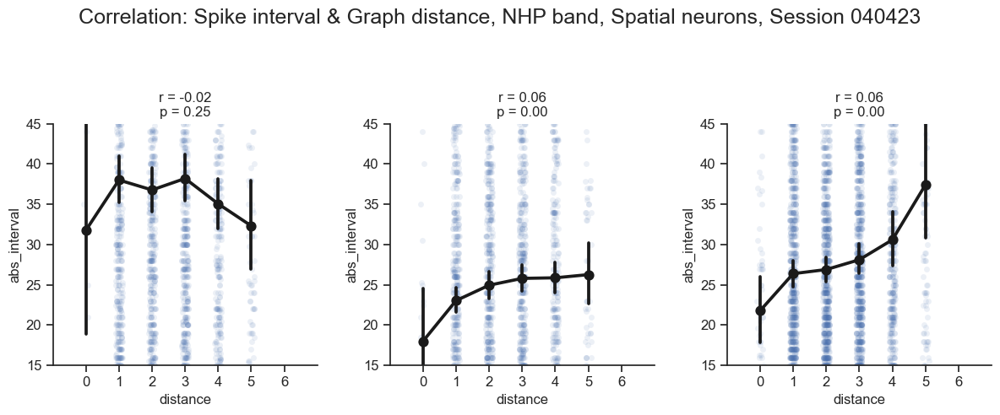

In [67]:
# proportion of cells activated during individual ripple, seperate by probes


dates = ['031723','032823','033123','032023','040423','040723']


for ss, date in enumerate(dates):

    if ss==4:
        
        idx = np.arange(Num_neuron[ss],Num_neuron[ss+1])
        ts = np.argmax(sig.mean(axis=0))
        ses_MI = MI[idx,ts]
        ses_Lambda_i = np.argmax(Lambda_i[idx,ts,:],axis=1)
        ses_sig = sig[idx,ts]
    
        date_int = int(date[1:])
        probe_info = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx').query("date==@date_int")
        ses_probes = probe_info.probe.values
        
        lfpFile = h5py.File('/Volumes/Extreme SSD/Teleworld/bart_I/raw/spikes/Bart_TeleWorld_v13_%s-spikes.mat' % date, 'r')
        spikesData = lfpFile['spikeTable']
    
        nwbfile = import_behavior(date)
        unitNames = nwbfile.units.to_dataframe()
        unit_params = {"drift": 2, "min_fr": 1}
        unit_idx = np.where((unitNames.region == 'HPC') & (unitNames.group == "good") & (unitNames.drift <= unit_params["drift"]) & (unitNames.fr >= unit_params["min_fr"]))[0]
        
        
        ripple_info = pd.DataFrame([])
        spikes_in_ripple_df = pd.DataFrame([])
    
        plt.close('all')
        fig, ax = plt.subplots(1,3,figsize=(12,5))
        plt.suptitle('Session %s' % date)
        
        for probe in ses_probes:  
    
            pairwise = []
            region = unitNames.query("(probe==@probe)").region.unique()[0]
            subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
            
            if region=='HPC':
    
                print(date, probe, subfield)
                ripple_df = combine_ripples_per_probe(date,probe-4,[80,180])
                ch_start, ch_end = probe_info.query("probe==@probe")[['start_channel','end_channel']].values[0]  
                
                num_spikes = np.zeros((len(peaks),len(unit_idx)))
                
                for ii in range(len(peaks)):
                
                    timestamps = np.arange(ons[ii],offs[ii])
                    ripple_spikes = spikesData[timestamps,:][:,unit_idx]      
                    num_spikes[ii,:] = ripple_spikes.sum(axis=0)
    
                    spikes_in_ripple = [[],[]]
                    for cid in range(ripple_spikes.shape[1]):
                        cid_spikes = np.where(ripple_spikes[:,cid])[0]
                        if len(cid_spikes)>0:
                            spikes_in_ripple[0].append(np.array([cid, cid_spikes.mean(), len(cid_spikes), ses_Lambda_i[cid], ses_sig[cid]]))
                            spikes_in_ripple[1].append(cid_spikes)
                            
                    df1 = pd.DataFrame(spikes_in_ripple[0], columns=["Neuron", "SpikeTime", "Counts", "Node", "Spatial"])
                    df1["SpikesArray"] = spikes_in_ripple[1]
                    df1["ripple_id"] = ii
                    df1["probe"] = probe
                    spikes_in_ripple_df = pd.concat([spikes_in_ripple_df,df1])
    
                    if len(spikes_in_ripple[0])>1:
                        temp = np.vstack(spikes_in_ripple[0])
                        for i, j in itertools.combinations(np.arange(temp.shape[0]), 2):
                            distance = D[int(temp[i,3]),int(temp[j,3])]
                            interval = temp[i,1]-temp[j,1]
                            pairwise.append(np.array([probe,ii,int(temp[i,0]),int(temp[j,0]),int(temp[i,3]),int(temp[j,3]),
                                                      int(temp[i,4]),int(temp[j,4]),distance,interval]))
    
                
                probe_ripple_info = pd.DataFrame({
                    "Session": [date]*len(peaks),
                    "probe": probe*np.ones(len(peaks)),
                    "ripple_id": np.arange(len(peaks)),
                    "peaks": peaks,
                    "ons": ons,
                    "offs": offs,
                    "smoothed": smoothed,
                    "zscored": zscored,
                    "channels": channels,
                    "active_neuron": np.sum(num_spikes>0,axis=1),
                    "active_spatial": np.sum(num_spikes[:,ses_sig]>0,axis=1),
                })
                ripple_info = pd.concat([ripple_info,probe_ripple_info])
                
    
                # plot_active_neurons_in_ripple(date, probe, subfield, active_neuron,active_spatial,active_nonspatial)
        
                # plot_active_neurons_in_ripple_session(date, np.vstack(active_neuron_all), np.vstack(active_spatial_all))
                pairwise_df = pd.DataFrame(data = np.vstack(pairwise), columns=['probe','ripple_id','cell1','cell2','node1','node2',
                                                                                'spatial1','spatial2','distance','interval'])
                pairwise_df['abs_interval'] = np.abs(pairwise_df['interval'])
                pair_df = pairwise_df.query("(spatial1==1)&(spatial2==1)")
                # pair_df = pairwise_df.groupby(['cell1','cell2']).mean().query("(spatial1==1)&(spatial2==1)")
                # print(pearsonr(pairwise_df.distance.values,pairwise_df.abs_interval.values))
                
                # abs(interval) vs distance
                # corrs_abs = (
                #     pairwise_df
                #     .groupby(["probe","ripple_id"])
                #     .apply(lambda g: corr_with_pval(g["abs_interval"], g["distance"]),include_groups=False)
                # ).reset_index()
                
                # ripple_corr = ripple_info.merge(corrs_abs,left_on=["probe","ripple_id"],right_on=["probe","ripple_id"])
                # trial_df = nwbfile.intervals['trials'].to_dataframe()
                # trial_time = trial_df[['start_time','stop_time']].values
                # plot_spikes_in_ripple(ripple_corr)
            
                sns.stripplot(data=pair_df, x='distance', y='abs_interval', native_scale=True,
                              alpha=.1, legend=False, zorder=1, ax=ax[probe-4])
                sns.pointplot(data =pair_df, x='distance', y='abs_interval',color='k',zorder=2,
                              ax=ax[probe-4],native_scale=True)
                r,p = pearsonr(pair_df.distance.values,pair_df.abs_interval.values)
                
                # sns.pointplot(data=pairwise_df,x='distance',y='abs_interval',ax=ax[np.divmod(ss,3)],native_scale=True)
                ax[probe-4].set_title('Session %s' % date)
                ax[probe-4].set_ylim(15,45)
                ax[probe-4].set_xlim(-1,7)
                ax[probe-4].set_xticks(np.arange(7))
                ax[probe-4].set_title('r = %.2f\np = %.2f' % (r,p))
        
        # plt.close('all')
        
        # fig, ax = plt.subplots(2,1,figsize=(6,6))
        
        # sns.histplot(data=corrs_abs,x='r',bins=np.arange(-1,1.05,0.05),ax=ax[0],label='All ripples')
        # ax[0].axvline(0,color='r',ls='--')
        # ax[0].set_xticklabels('')
        # ax[0].set_xlabel('')
        # ax[0].legend(frameon=False)
        
        # sns.histplot(data=corrs_abs.query("p<0.05"),x='r',bins=np.arange(-1,1.05,0.05),ax=ax[1],label='Significant ripples')
        # plt.axvline(0,color='r',ls='--')
        # ax[1].set_xlabel('Correlation')
        # ax[1].legend(frameon=False)
        
        # plt.tight_layout(h_pad=2,w_pad=2,rect=[0, 0, 1, 0.9])
        # plt.suptitle('Correlation: Spike interval & Graph distance\nSession %s, Rat band, Spatial neurons' % date)
        # plt.savefig('Session %s, spike interval & graph distance, rat band, spatial' % date)
    
        plt.tight_layout(h_pad=2,w_pad=2,rect=[0, 0, 1, 0.9])
        plt.suptitle('Correlation: Spike interval & Graph distance, NHP band, Spatial neurons, Session %s' % date)
        plt.savefig('All Sessions, spike interval & graph distance, NHP band, Spatial, Session %s' % date)

In [263]:
def plot_spikes_in_ripple(ripple_corr):
        
    # Sort by zscored and take top 100, then pick 20 at random
    sorted_df = ripple_corr.query("p<0.05").sort_values("r", ascending=False)
    sampled_rows = sorted_df.head(100).sample(int(len(sorted_df)/10), replace=False)
    
    for _, row in sampled_rows.iterrows():
        
        pp = int(row["peaks"])
        on = int(row["ons"])
        off = int(row["offs"])
        z = row["zscored"]
        probe = int(row["probe"])
        date = row["Session"]  # adjust column name if different
        channel = int(row["channels"])
        
        timestamps = np.arange(pp - 200, pp + 200)
        
        # get signals from probe
        lfps, nhp_ripple_band = get_signal_per_probe(probe_info, date, probe, timestamps, [80, 180])
        
        # extract spikes only for this ripple
        ripple_spike = spikesData[np.arange(on, off), :][:, unit_idx]
        
        plt.close("all")
        fig, ax = plt.subplots(
            2, 2, figsize=(10, 8), gridspec_kw={"height_ratios": [0.4, 0.6]}
        )
        
        # LFP trace
        ax[0,0].plot(lfps[:, channel], "k-")
        ax[0,0].plot(nhp_ripple_band[:, channel] * 5 - 0.25, "k-")
        ax[0,0].axis("off")
        ax[0,0].set_xlim(0, 400)
        ax[0,0].axvspan(on - (pp - 200), off - (pp - 200), color="yellow", alpha=0.1)
        
        ax[0,1].axis("off")
        
        
        # spikes
        order_spikes = []
        for ii, nn in enumerate(np.where(ses_sig)[0]):
            nn_spikes = np.where(ripple_spike[:, nn])[0] + on - (pp - 200)
            if ses_sig[nn] and len(nn_spikes) > 0:        
                order_spikes.append(np.array([nn_spikes.mean(),ses_Lambda_i[nn]]))
                ax[1,0].errorbar(
                    nn_spikes.mean(),
                    ii,
                    xerr=nn_spikes.std() / np.sqrt(len(nn_spikes)),
                    fmt="o",
                    capsize=2,
                    color=cmap_2d[np.divmod(ses_Lambda_i[nn], 4)[::-1]],
                    label = "node %i" % ses_Lambda_i[nn],
                )
        order_spikes = np.vstack(order_spikes)
        node_order = order_spikes[np.argsort(order_spikes[:,0]),1]
        ax[1,0].axvspan(on - (pp - 200), off - (pp - 200), color="yellow", alpha=0.1)
        ax[1,0].set_xlim(0, 400)
        ax[1,0].legend()
        ax[1,0].set_title(",".join(str(int(x)) for x in node_order))
    
        trial_num = np.where((pp > trial_time[:,0]) & (pp < trial_time[:,1]))[0]
        if len(trial_num)>0:
            trial_nodes = trial_df.iloc[trial_num].nodes.values
        # else:  # if ripples happened during ITI
        #     trial_num = np.where((pp > trial_time[:-1,1]) & (pp < trial_time[1:,0]))[0]
        #     trial_nodes = trial_df.iloc[trial_num].nodes
        
            for node in np.arange(0, 16):
                y, x = np.divmod(node, 4)            
                ax[1,1].scatter(x, y, s=1000, color = cmap_2d[x, y])
                ax[1,1].text(x, y, str(node), fontsize=15, ha='center', va='center', color='w')
            
            for ii in range(len(node_order)-1):
                y1, x1 = np.divmod(node_order[ii], 4)  
                y2, x2 = np.divmod(node_order[ii+1], 4)  
                ax[1,1].arrow(x1,y1,x2-x1,y2-y1,color='k',width=0.05,zorder=2)
            
            ax[1,1].set_xlim([-0.5, 3.5])
            ax[1,1].set_ylim([-0.5, 3.5])
            ax[1,1].set_xticks([0, 1, 2, 3], labels = ["", "", "", ""])
            ax[1,1].set_yticks([0, 1, 2, 3], labels = ["", "", "", ""])
            ax[1,1].invert_yaxis()  # Invert the y-axis
            ax[1,1].axis("off")
            ax[1,1].set_title(trial_nodes)
            
            plt.suptitle(f"Session {date}, Probe {probe}, Ripple time {pp}\nRipple amp {row["zscored"]:.2f}, Corr {row["r"]:.2f}, p-val {row["p"]:.2f}")
            plt.savefig(f"Session {date}, Probe {probe}, Ripple time {pp} with spikes.jpg")


IndexError: Fancy indexing out of range for (0-5306068)

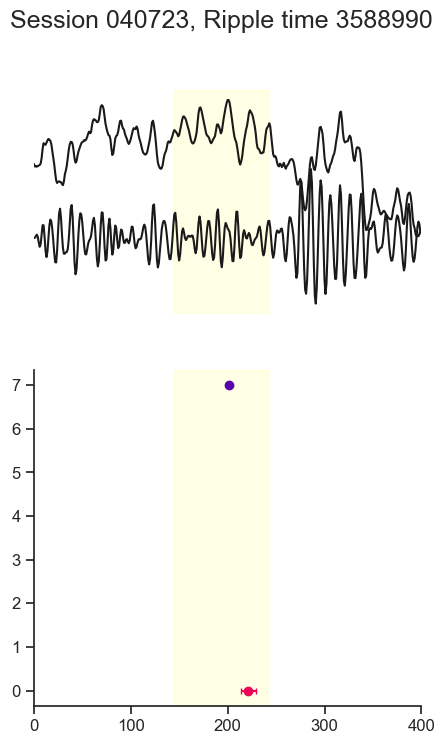

In [261]:
sorted_idx = np.argsort(zscored)[::-1]
for idx in np.random.choice(sorted_idx[:100], size=20, replace=False):

    pp = peaks[idx]
    timestamps = np.arange(pp-200,pp+200)
    lfps,nhp_ripple_band = get_signal_per_probe(probe_info,date,probe,timestamps,[80,180])
    ripple_spike = spikesData[np.arange(ons[idx],offs[idx]),:][:,unit_idx]
    
    plt.close('all')
    fig, ax = plt.subplots(2,1,figsize=(5,8),height_ratios=[0.4,0.6])
    ii = -1
    ax[0].plot(lfps[:,ii],'k-')
    ax[0].plot(nhp_ripple_band[:,ii]*5-0.25,'k-')
    ax[0].axis('off')
    ax[0].set_xlim(0,400)
    ax[0].axvspan(ons[idx]- (pp-200),offs[idx]- (pp-200),color='yellow',alpha=0.1)

    for ii, nn in enumerate(np.where(ses_sig)[0]):
        nn_spikes = np.where(ripple_spike[:,nn])[0] + ons[idx] - (pp-200)
        if ses_sig[nn]:
            # ax[1].scatter(nn_spikes.mean(),ii,50,marker='|',color=cmap_2d[np.divmod(ses_Lambda_i[nn],4)])
            if len(nn_spikes)>0:
                ax[1].errorbar(nn_spikes.mean(), ii, xerr=nn_spikes.std()/np.sqrt(len(nn_spikes)), fmt='o', capsize=2,
                              color=cmap_2d[np.divmod(ses_Lambda_i[nn],4)])

    ax[1].axvspan(ons[idx]- (pp-200),offs[idx]- (pp-200),color='yellow',alpha=0.1)
    ax[1].set_xlim(0,400)
    # for ii, nn in enumerate(np.where(ses_sig)[0]):
    #     nn_spikes = np.where(ripple_spike[:,nn])[0]
    #     if ses_sig[nn]:
    #         ax[1].scatter(nn_spikes,ii*np.ones(len(nn_spikes)),50,marker='|',color=cmap_2d[np.divmod(ses_Lambda_i[nn],4)])
        # else:
        #     plt.scatter(nn_spikes,nn*np.ones(len(nn_spikes)),50,marker='|',color='gray')
    
    plt.suptitle('Session %s, Ripple time %i' % (date,pp))
    plt.savefig('Session %s, Ripple time %i with spikes.jpg' % (date,pp))

In [15]:
def plot_active_neurons_in_ripple_session(date, active_neuron, active_spatial):

    plt.close('all')
    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    
    # ==== First row: histograms ====
    # 1st column: number of active neurons
    ax[0].hist(active_neuron.sum(axis=1), bins=np.arange(-1,40,1))
    ax[0].set_xlabel('# Neurons')
    ax[0].set_ylabel('# Ripples')
    ax[0].set_title('All neurons')
    
    # 2nd column: number of spatial neurons
    ax[1].hist(active_spatial.sum(axis=1), bins=np.arange(0,40,1))
    ax[1].set_xlabel('# Neurons')
    ax[1].set_ylabel('# Ripples')
    ax[1].set_title('Spatial neurons')
    
    # 3rd column: ratio spatial/active
    spatial_per_active = active_spatial.mean(axis=1)/active_neuron.mean(axis=1)
    ax[2].hist(spatial_per_active, bins=np.arange(-0.05,0.5,0.02))
    ax[2].axvline(ses_sig.sum()/len(ses_sig), color='r', linestyle='--')
    ax[2].set_xticks(np.arange(0.1,1,0.2))
    ax[2].set_xlabel('Spatial / All')
    ax[2].set_ylabel('# Ripples')
    ax[2].set_title('Spatial / All')

    plt.tight_layout(h_pad=2,w_pad=2,rect=[0, 0, 1, 0.9])
    plt.suptitle('Session %s, number of neurons per ripple' % date)
    plt.savefig('Session %s, neuron counts in ripple' % date)

In [29]:
# proportion of cells activated during individual ripple

dates = ['031723','032823','033123','032023','040423','040723']

dates = ['031723']

for ss, date in enumerate(dates):
    
    date_int = int(date[1:])
    
    idx = np.arange(Num_neuron[ss],Num_neuron[ss+1])
    ses_MI = MI[idx,9]
    ses_Lambda_i = np.argmax(Lambda_i[idx,9,:],axis=1)
    ses_sig = sig[idx,9]
    
    probe_info = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx').query("date==@date_int")
    lfpFile = h5py.File('/Volumes/Extreme SSD/Teleworld/bart_I/raw/spikes/Bart_TeleWorld_v13_%s-spikes.mat' % date, 'r')
    spikesData = lfpFile['spikeTable']

    nwbfile = import_behavior(date)
    unitNames = nwbfile.units.to_dataframe()
    ses_probes = probe_info.probe.values

    
    for probe in [4]: #ses_probes:  
        
        region = unitNames.query("(probe==@probe)").region.unique()[0]
        
        if region=='HPC':
            
            peaks, ons, offs, smoothed, zscored, channels = combine_ripples_per_probe(date,probe-4)
            ch_start, ch_end = probe_info.query("probe==@probe")[['start_channel','end_channel']].values[0]
            
            subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
            unit_params = {"drift": 2, "min_fr": 1}
            unit_idx = np.where((unitNames.region == 'HPC') & (unitNames.group == "good") & (unitNames.drift <= unit_params["drift"]) & (unitNames.fr >= unit_params["min_fr"]))[0]
            
            nhp_ripple_spikes = []
            num_spikes = np.zeros((len(peaks),len(unit_idx)))
            active_neuron = np.zeros((len(peaks),len(unit_idx)))
            active_spatial = np.zeros((len(peaks),len(unit_idx)))
            active_nonspatial = np.zeros((len(peaks),len(unit_idx)))

            print(date, probe, subfield)
            
            for ii in range(len(peaks)):
            
                timestamps = np.arange(ons[ii],offs[ii])
                ripple_spike = spikesData[timestamps,:][:,unit_idx]
            
                nhp_ripple_spikes.append(ripple_spike)
                num_spikes[ii,:] = ripple_spike.sum(axis=0)
                active_neuron[ii] = num_spikes[ii,:]>0
                active_spatial[ii] = (num_spikes[ii,:]>0) & ses_sig
                active_nonspatial[ii] = (num_spikes[ii,:]>0) & (~ses_sig)

            # plot_active_neurons_in_ripple(date, probe, subfield, active_neuron,active_spatial,active_nonspatial)
            

031723 4 CA3


In [19]:
def plot_active_neurons_in_ripple(date, probe, subfield, active_neuron,active_spatial,active_nonspatial):

    plt.close('all')
    fig, ax = plt.subplots(3, 3, figsize=(15, 12))
    
    # ==== First row: histograms ====
    # 1st column: number of active neurons
    ax[0,0].hist(active_neuron.sum(axis=1), bins=np.arange(-1,40,1))
    ax[0,0].set_xlabel('# Neurons')
    ax[0,0].set_ylabel('# Ripples')
    ax[0,0].set_title('Active neurons per ripple')
    
    # 2nd column: number of spatial neurons
    ax[0,1].hist(active_spatial.sum(axis=1), bins=np.arange(0,40,1))
    ax[0,1].set_xlabel('# Neurons')
    ax[0,1].set_ylabel('# Ripples')
    ax[0,1].set_title('Spatial neurons per ripple')
    
    # 3rd column: ratio spatial/active
    spatial_per_active = active_spatial.mean(axis=1)/active_neuron.mean(axis=1)
    ax[0,2].hist(spatial_per_active, bins=np.arange(-0.05,0.5,0.02))
    ax[0,2].axvline(ses_sig.sum()/len(ses_sig), color='r', linestyle='--')
    ax[0,2].set_xticks(np.arange(0.1,1,0.2))
    ax[0,2].set_xlabel('Spatial / Active')
    ax[0,2].set_ylabel('# Ripples')
    ax[0,2].set_title('Spatial / active neurons')
    
    # ==== Second row: duration correlations ====
    # 1st column
    ax[1,0].scatter(offs-ons, active_neuron.sum(axis=1))
    ax[1,0].set_xlabel('Ripple duration')
    ax[1,0].set_ylabel('# Active neurons')
    ax[1,0].set_title('Active neurons')
    
    # 2nd column
    ax[1,1].scatter(offs-ons, active_spatial.sum(axis=1))
    ax[1,1].set_xlabel('Ripple duration')
    ax[1,1].set_ylabel('# Spatial neurons')
    ax[1,1].set_title('Spatial neurons')
    
    # 3rd column
    ax[1,2].scatter(offs-ons, active_nonspatial.sum(axis=1))
    ax[1,2].set_xlabel('Ripple duration')
    ax[1,2].set_ylabel('# Non-spatial neurons')
    ax[1,2].set_title('Non-spatial neurons')
    
    # ==== Third row: amplitude correlations ====
    # 1st column
    ax[2,0].scatter(zscored, active_neuron.sum(axis=1))
    ax[2,0].set_xlabel('Ripple amplitude (z-scored)')
    ax[2,0].set_ylabel('# Active neurons')
    ax[2,0].set_title('Active neurons')
    
    # 2nd column
    ax[2,1].scatter(zscored, active_spatial.sum(axis=1))
    ax[2,1].set_xlabel('Ripple amplitude (z-scored)')
    ax[2,1].set_ylabel('# Spatial neurons')
    ax[2,1].set_title('Spatial neurons')
    
    # 3rd column
    ax[2,2].scatter(zscored, active_nonspatial.sum(axis=1))
    ax[2,2].set_xlabel('Ripple amplitude (z-scored)')
    ax[2,2].set_ylabel('# Non-spatial neurons')
    ax[2,2].set_title('Non-spatial neurons')
    
    plt.tight_layout(h_pad=2,w_pad=2,rect=[0, 0, 1, 0.95])
    plt.suptitle('Session %s, probe %i, subfield %s' % (date,probe,subfield))
    plt.savefig('Session %s, probe %i, subfield %s, neuron counts in ripple' % (date,probe,subfield))


In [ ]:
which = 'NHP band'
center = 1123094
window = [-1000,2500]
timestamps = np.arange(center+window[0],center+window[1])

plt.close('all')
fig, ax = plt.subplots(figsize=(10,6))

plt.plot(np.arange(window[0],window[1]),preprocessed[timestamps],'k-')
plt.plot(np.arange(window[0],window[1]),rippleband[timestamps]*5-0.5,'k-')
# plt.plot(np.arange(-1000,1000),smoothed[timestamps]*5-4,'k-')

ax2 = ax.twinx()

ax2.plot(np.arange(window[0],window[1]),zscored[timestamps],'r-')
# plt.vlines(peaks_comb[(peaks_comb>timestamps[0]) & (peaks_comb<timestamps[-1])]-center,zscored[timestamps].min(),zscored[timestamps].max())    
# plt.axvspan(ons_comb[idx]-center,offs_comb[idx]-center,color='magenta',alpha=0.1)

plt.suptitle('%s: Subfield %s, Session %s, probe %i, time %i' % (which,subfield,date,nprobe,center),fontsize=18)
plt.savefig('%s: Subfield %s, Session %s, probe %i, time %i' % (which,subfield,date,nprobe,center))


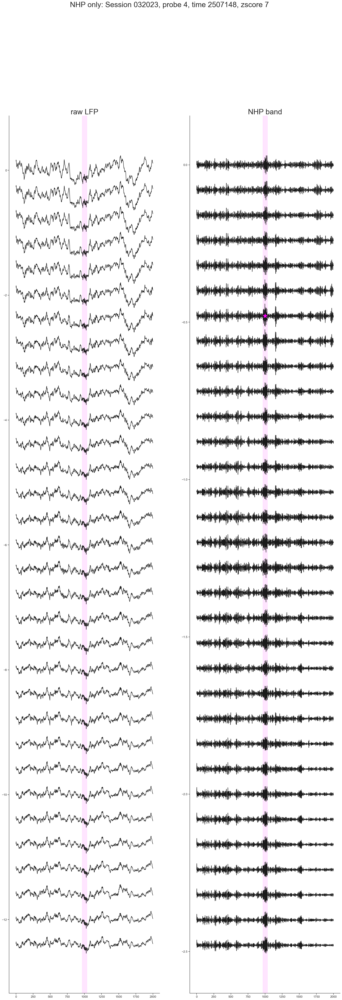

In [79]:
which = 'NHP only'
indices = np.argsort(zscored)[::-1]

for idx in indices[:20]:

    probe = 4
    center = peaks[idx]
    
    timestamps = np.arange(center-1000,center+1000)
    lfps,nhp_ripple_band,_ = get_signal_per_probe(probe_info,peaks,date,probe,timestamps,[80,180])
    
    plt.close('all')
    fig, ax = plt.subplots(1,2,figsize=(24,64))
    
    for ii in range(32):
        
        ax[0].plot(lfps[:,ii]-0.4*ii,'k-')
        ax[1].plot(nhp_ripple_band[:,ii]-0.08*ii,'k-')
    
    ax[1].scatter(1000,-0.08*channels[idx],marker='*',s=400,color='magenta',zorder=2)
    
    ax[0].axvspan(ons[idx]-center+1000,offs[idx]-center+1000,color='magenta',alpha=0.1)
    ax[1].axvspan(ons[idx]-center+1000,offs[idx]-center+1000,color='magenta',alpha=0.1)
    ax[0].set_title('raw LFP',fontsize=30)
    ax[1].set_title('NHP band',fontsize=30)
    
    plt.suptitle('%s: Session %s, probe %i, time %i, zscore %i' % (which,date,probe,center,zscored[idx]),fontsize=30)
    plt.savefig('%s, Session %s, probe %i, time %i' % (which,date,probe,center))

In [69]:
# possibly combine ripples detected at each probe within one session, 
# but from probe to probe, the timing of ripples can be very different, should we keep them all?


peaks = [[] for ii in range(3)]
ons = [[] for ii in range(3)]
offs = [[] for ii in range(3)]
smoothed = [[] for ii in range(3)]
zscored = [[] for ii in range(3)]

for probe in range(3):
    peaks[probe], ons[probe], offs[probe], smoothed[probe], zscored[probe], _ = combine_ripples_per_probe(date,probe)

peaks = np.concatenate(peaks)
zscored = np.concatenate(zscored)

uniques, idx = np.unique(peaks,return_index=True)

while True:

    if np.sum(np.diff(uniques)<25)==0:

        break
        
    else:

        uniques, idx = np.unique(peaks,return_index=True)
        to_be_merged = np.where(np.diff(uniques)<25)[0]
        
        new_idx = idx.copy()
        
        for ii in to_be_merged:
            
            times_to_merge = np.array([peaks[idx[ii]],peaks[idx[ii+1]]])
            lower = np.argmin([zscored[idx[ii]],zscored[idx[ii+1]]])
            lower_idx = np.array([idx[ii],idx[ii+1]])[lower]
            new_idx = new_idx[new_idx!=lower_idx]
            
        peaks = peaks[new_idx]
        # ons = ons[new_idx]
        # offs  = offs[new_idx]
        # smoothed = smoothed[new_idx]
        zscored = zscored[new_idx]
        # channels = channels[new_idx]

In [47]:
def get_session_ripples(date,probe):

    data = np.load("/Volumes/Extreme SSD/Session %s, Band 80 180 ripples.npy" % date, allow_pickle=True).item()
    
    # Now `data` is the dict you originally saved
    peaks = np.concatenate(data["peaks"][probe])
    ons = np.concatenate(data["ons"][probe])
    offs   = np.concatenate(data["offs"][probe])
    smoothed = np.concatenate(data["smoothed"][probe])
    zscored = np.concatenate(data["zscored"][probe])

    return peaks, ons, offs, smoothed, zscored

In [68]:
def merge_close_neighbors(arr, threshold=50):
    
    arr = np.sort(np.array(arr, dtype=float))  # sort & ensure float
    merged = True

    while merged:
        
        merged = False
        new_arr = []
        skip_next = False

        for i in range(len(arr)):
            
            if skip_next:
                skip_next = False
                continue

            if i < len(arr) - 1 and abs(arr[i+1] - arr[i]) < threshold:
                
                # merge the two
                mean_val = (arr[i] + arr[i+1]) / 2
                new_arr.append(mean_val)
                skip_next = True
                merged = True
                
            else:
                new_arr.append(arr[i])

        arr = np.array(sorted(new_arr))
    
    return arr


array([  0,   1,   2, ..., 524, 525, 526])

In [265]:
spatial = np.mean(num_spikes[:,ses_sig]>0,axis=1)
nonspatial = np.mean(num_spikes[:,~ses_sig]>0,axis=1)

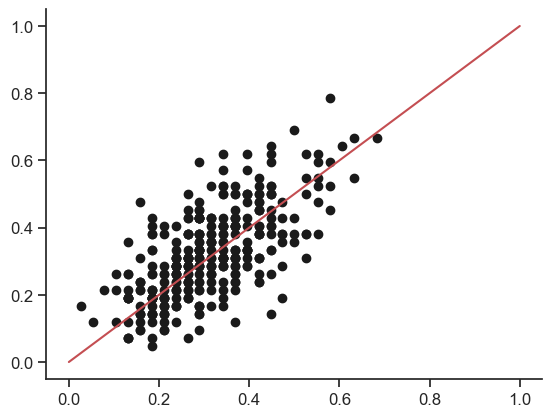

In [269]:
plt.close('all')
plt.scatter(spatial,nonspatial,color='k')
plt.plot([0,1],[0,1],'r-')

In [130]:
diff = np.diff(preprocessed)
zscored_diff = (diff-diff.mean())/diff.std()
print(zscored_diff.max(),zscored_diff.min())

81.07839260212249 -28.097090413541917


(array([3.000000e+00, 1.400000e+01, 1.710000e+02, 1.355000e+03,
        1.084200e+04, 8.361500e+04, 6.536110e+05, 3.696267e+06,
        9.560190e+05, 1.640000e+02]),
 array([-16.20308559, -14.14323538, -12.08338517, -10.02353496,
         -7.96368476,  -5.90383455,  -3.84398434,  -1.78413413,
          0.27571608,   2.33556629,   4.3954165 ]),
 <BarContainer object of 10 artists>)

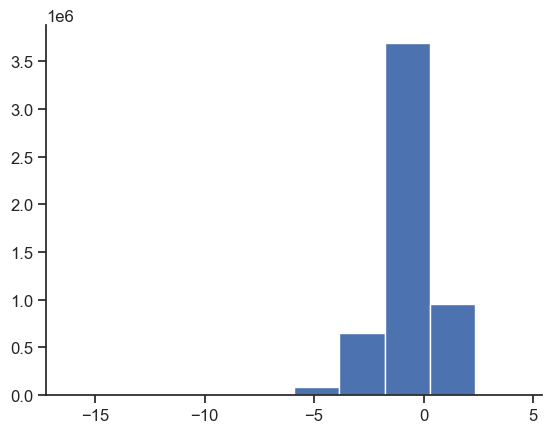

In [148]:
plt.close('all')
plt.hist(np.log(np.abs(zscored_diff))) #,bins=np.arange(20))

In [35]:
tic = time.time()
preprocessed, noise = preprocess_LFP(lfpData[:, 161], cutoff=15, fs=1000)
rippleband, smoothed, zscored, true_peaks, ons, offs = detect_ripple(preprocessed, noise, [80,180])
toc = time.time()
print(toc-tic)

35.267120122909546


In [97]:
_, idx = np.unique(ons,return_index=True)

In [99]:
_, idx2 = np.unique(offs,return_index=True)

In [126]:
# if there are consecutive multiple ripples, multiple peaks could be detected within the same event, combine them
_, idx = np.unique(ons,return_index=True)
ons_comb = ons[idx]
offs_comb = offs[idx]
peaks_comb = true_peaks[idx]

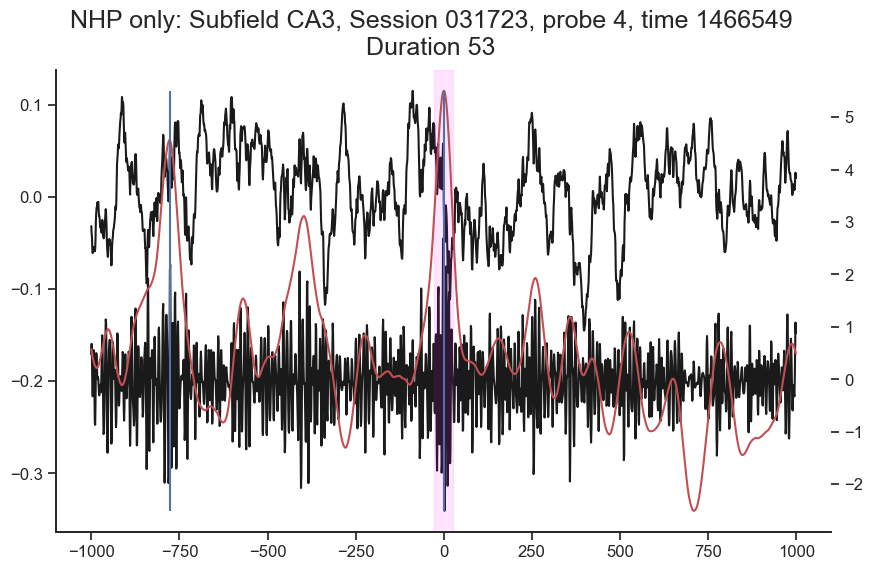

In [179]:
which = 'NHP only'
np.random.seed(42)

for idx in np.random.choice(len(peaks_comb), size=20, replace=False):

    center = peaks_comb[idx]
    timestamps = np.arange(center-1000,center+1000)
    
    plt.close('all')
    fig, ax = plt.subplots(figsize=(10,6))
    
    plt.plot(np.arange(-1000,1000),preprocessed[timestamps],'k-')
    plt.plot(np.arange(-1000,1000),rippleband[timestamps]*5-0.2,'k-')
    # plt.plot(np.arange(-1000,1000),smoothed[timestamps]*5-4,'k-')
    
    ax2 = ax.twinx()
    
    ax2.plot(np.arange(-1000,1000),zscored[timestamps],'r-')
    plt.vlines(peaks_comb[(peaks_comb>timestamps[0]) & (peaks_comb<timestamps[-1])]-center,zscored[timestamps].min(),zscored[timestamps].max())    
    plt.axvspan(ons_comb[idx]-center,offs_comb[idx]-center,color='magenta',alpha=0.1)
    
    plt.suptitle('%s: Subfield %s, Session %s, probe %i, time %i\nDuration %i' % (which,subfield,date,nprobe,center,offs[idx]-ons[idx]),fontsize=18)
    plt.savefig('%s: Subfield %s, Session %s, probe %i, time %i, Duration %i' % (which,subfield,date,nprobe,center,offs[idx]-ons[idx]))


In [185]:
# proportion of cells activated during individual ripple

dates = ['031723','032823','033123','032023','040423','040723']
Num_neuron = np.insert(np.cumsum([80,94,88,73,88,60]),0,0)

dates = ['031723']

# rat_ripple_FR = np.zeros(MI.shape[0])
# nhp_ripple_FR = np.zeros(MI.shape[0])

for ss, date in enumerate(dates):
    
    date_int = int(date[1:])
    probe = 4
    
    idx = np.arange(Num_neuron[ss],Num_neuron[ss+1])
    # ses_MI = MI[idx,9]
    # ses_Lambda_i = np.argmax(Lambda_i[idx,9,:],axis=1)
    # ses_sig = sig[idx,9]

    lfpFile = h5py.File('/Volumes/Extreme SSD/Teleworld/bart_I/raw/spikes/Bart_TeleWorld_v13_%s-spikes.mat' % date, 'r')
    spikesData = lfpFile['spikeTable']
    
    probe_info = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx')
    ch_start, ch_end = probe_info.query("(date==@date_int) & (probe==@probe)")[['start_channel','end_channel']].values[0]
    
    nwbfile = import_behavior(date)
    unitNames = nwbfile.units.to_dataframe()
    subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
    unit_params = {"drift": 2, "min_fr": 1}
    unit_idx = np.where((unitNames.region == 'HPC') & (unitNames.group == "good") & (unitNames.drift <= unit_params["drift"]) & (unitNames.fr >= unit_params["min_fr"]))[0]

    
    nhp_ripple_spikes = []
    num_spikes = np.zeros((len(peaks_comb),len(unit_idx)))
    active_neuron = np.zeros(len(peaks_comb))
    
    for ii in range(len(peaks_comb)):
    
        timestamps = np.arange(ons_comb[ii],offs_comb[ii])
        ripple_spike = spikesData[timestamps,:][:,unit_idx]

        nhp_ripple_spikes.append(ripple_spikes)
        num_spikes[ii,:] = ripple_spike.sum(axis=0)
        active_neuron[ii] = np.sum(num_spikes[ii,:]>0)
        
#         nhp_ripple_FR.append(ripple_spike)

#     nhp_ripple_FR[idx] = nhp_ripple_FR_ss.mean(axis=1)


# ons_comb = ons[idx]
# offs_comb = offs[idx]
# peaks_comb = true_peaks[idx]


In [11]:
def find_match(A,B,offset=50):

    
    # Compare all pairs: shape (len(A), len(B))
    diff_matrix = np.abs(A[:, None] - B[None, :])

    rows,cols = np.where(diff_matrix<=50)
    matches = ((A[rows]+B[cols])/2).astype(int)
        
    # Check if each A has any B within ±tol
    A_has_match = (diff_matrix <= offset).any(axis=1)
    
    # Check if each B has any A within ±tol
    B_has_match = (diff_matrix <= offset).any(axis=0)
    
    A_only = A[~A_has_match].astype(int)
    B_only = B[~B_has_match].astype(int)

    return matches, A_only, B_only

In [13]:
sz1 = 18
sz2 = 24
sns.set(style="ticks", rc={"lines.linewidth": 1.5})
matplotlib.rc('xtick', labelsize=sz1) 
matplotlib.rc('ytick', labelsize=sz1) 
matplotlib.rc('axes', labelsize=sz1)  
matplotlib.rc('axes', titlesize=sz1)  
matplotlib.rc('figure', titlesize=sz2)
matplotlib.rc('legend', fontsize=sz1) 
matplotlib.rc('legend', title_fontsize=sz1)
matplotlib.rcParams['axes.spines.right'] = False
matplotlib.rcParams['axes.spines.top'] = False

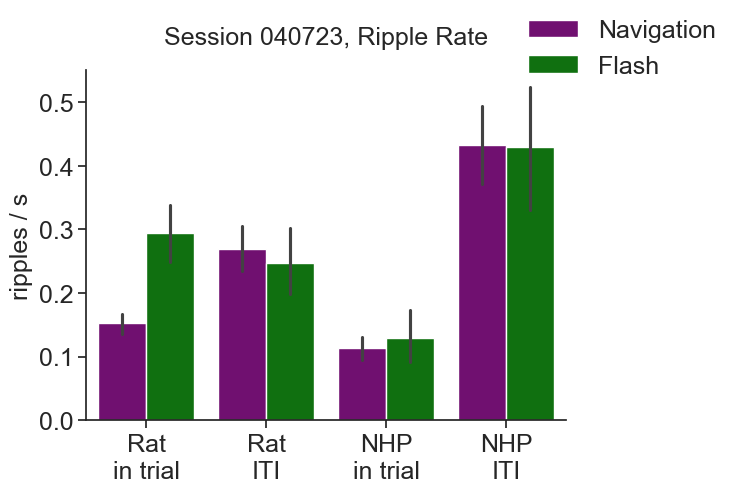

In [179]:
# aligned to behavior epochs, ripple rates

dates = ['031723','032023','032823','033123','040423','040723']
epoch = 'trials'


for date in dates:
    
    date_int = int(date[1:])
    probe = 4
    probe_info = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx')
    ch_start, ch_end = probe_info.query("(date==@date_int) & (probe==@probe)")[['start_channel','end_channel']].values[0]
    
    rat_peaks = import_ripple(date, [150,250])[np.arange(ch_start-1, ch_end)]
    nhp_peaks = import_ripple(date, [80,180])[np.arange(ch_start-1, ch_end)]
    
    rat_peaks_all = np.unique(np.concatenate(rat_peaks))
    nhp_peaks_all = np.unique(np.concatenate(nhp_peaks))

    rat_peaks_merged = merge_close_neighbors(rat_peaks_all)
    nhp_peaks_merged = merge_close_neighbors(nhp_peaks_all)
    
    nwbfile = import_behavior(date)
    df = nwbfile.intervals[epoch].to_dataframe() #.query(beh_query)
    df = df.loc[:,df.columns[:-1]]
    
    starts = df.start_time.values
    stops = df.stop_time.values
    
    rat_within_trial_ripples = [[] for i in range(len(df))]
    nhp_within_trial_ripples = [[] for i in range(len(df))]
    rat_ITI_ripples = [[] for i in range(len(df)-1)]
    nhp_ITI_ripples = [[] for i in range(len(df)-1)]
    
    for tt in range(len(df)):

        rat_within_trial_ripples[tt] = rat_peaks_merged[(rat_peaks_merged>starts[tt]) & (rat_peaks_merged<stops[tt])]-starts[tt]
        nhp_within_trial_ripples[tt] = nhp_peaks_merged[(nhp_peaks_merged>starts[tt]) & (nhp_peaks_merged<stops[tt])]-starts[tt]

        if tt>0:
            rat_ITI_ripples[tt-1] = rat_peaks_merged[(rat_peaks_merged>stops[tt-1]) & (rat_peaks_merged<starts[tt])]-stops[tt-1]
            nhp_ITI_ripples[tt-1] = nhp_peaks_merged[(nhp_peaks_merged>stops[tt-1]) & (nhp_peaks_merged<starts[tt])]-stops[tt-1]

    rat_ITI_ripples =  rat_ITI_ripples + [np.array([])]
    nhp_ITI_ripples =  nhp_ITI_ripples + [np.array([])]
    
    df['rat_intrial'] = rat_within_trial_ripples
    df['nhp_intrial'] = nhp_within_trial_ripples
    df['rat_ITI'] = rat_ITI_ripples
    df['nhp_ITI'] = nhp_ITI_ripples
    df['trial_dur'] = df['stop_time']-df['start_time']
    df['ITI_dur'] = np.insert(df['start_time'].values[1:] - df['stop_time'].values[:-1],-1,np.nan)
    
    df['rat_intrial_rate'] = df.apply(lambda row:len(row['rat_intrial'])/row['trial_dur']*1000, axis=1)
    df['nhp_intrial_rate'] = df.apply(lambda row:len(row['nhp_intrial'])/row['trial_dur']*1000, axis=1)
    df['rat_ITI_rate'] = df.apply(lambda row:len(row['rat_ITI'])/row['ITI_dur']*1000, axis=1)
    df['nhp_ITI_rate'] = df.apply(lambda row:len(row['nhp_ITI'])/row['ITI_dur']*1000, axis=1)

    df_melted = df.melt(
        value_vars=['rat_intrial_rate', 'nhp_intrial_rate', 'rat_ITI_rate', 'nhp_ITI_rate'],
        id_vars = 'trialerror',
        var_name='Condition',
        value_name='Rate'
    )
    
    df_melted = df_melted.query("trialerror<2")
    
    plt.close('all')
    plt.figure(figsize=(8, 5))
    ax = sns.barplot(data=df_melted,x='Condition',y='Rate',hue='trialerror',palette=['purple', 'green'],
                    order=['rat_intrial_rate', 'rat_ITI_rate', 'nhp_intrial_rate', 'nhp_ITI_rate'])
    
    plt.ylabel('ripples / s')
    plt.title('Session %s, Ripple Rate' % date,y=1.05)
    ax.set_xticks(np.arange(4))
    ax.set_xticklabels(['Rat\nin trial', 'Rat\nITI', 'NHP\nin trial', 'NHP\nITI'],rotation=0)
    ax.set_xlabel('')
    
    ax.legend(title="", labels=["Navigation", "Flash"])
    handles, labels = ax.get_legend_handles_labels()
    bar_handles = handles[0:2]
    ax.legend(bar_handles, ["Navigation", "Flash"], title="",loc=(0.9,0.95),frameon=False)
    ax.set_position([0.15,0.15,0.6,0.7])

    plt.savefig('Session %s Ripple Rate, NHP vs rat, ITI vs in trial, nav vs flash' % date)

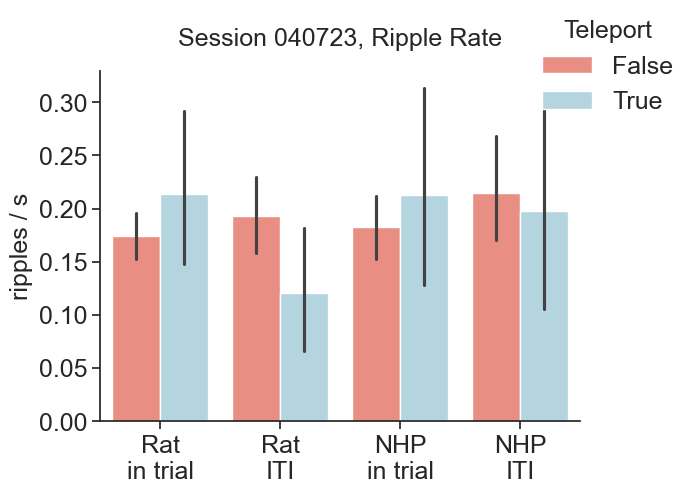

In [465]:
# aligned to behavior epochs, ripple rates

dates = ['031723','032023','032823','033123','040423','040723']
epoch = 'trials'

for date in dates:
    
    date_int = int(date[1:])
    probe = 4
    probe_info = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx')
    ch_start, ch_end = probe_info.query("(date==@date_int) & (probe==@probe)")[['start_channel','end_channel']].values[0]
    
    rat_peaks = import_ripple(date, [150,250])[np.arange(ch_start-1, ch_end)]
    nhp_peaks = import_ripple(date, [80,180])[np.arange(ch_start-1, ch_end)]
    
    rat_peaks_all = np.unique(np.concatenate(rat_peaks))
    nhp_peaks_all = np.unique(np.concatenate(nhp_peaks))

    rat_peaks_merged = merge_close_neighbors(rat_peaks_all)
    nhp_peaks_merged = merge_close_neighbors(nhp_peaks_all)
    
    nwbfile = import_behavior('031723')
    df = nwbfile.intervals['trials'].to_dataframe().query('trialerror==0')
    choice_df = nwbfile.intervals['action_on'].to_dataframe().query('trialerror==0')
    choice_df = graph.append_use_tele(choice_df)
    df['use_tele'] = choice_df.drop_duplicates('trial').use_tele.values

    starts = df.start_time.values
    stops = df.stop_time.values
    
    rat_within_trial_ripples = [[] for i in range(len(df))]
    nhp_within_trial_ripples = [[] for i in range(len(df))]
    rat_ITI_ripples = [[] for i in range(len(df)-1)]
    nhp_ITI_ripples = [[] for i in range(len(df)-1)]
    
    for tt in range(len(df)):

        rat_within_trial_ripples[tt] = rat_peaks_merged[(rat_peaks_merged>starts[tt]) & (rat_peaks_merged<stops[tt])]-starts[tt]
        nhp_within_trial_ripples[tt] = nhp_peaks_merged[(nhp_peaks_merged>starts[tt]) & (nhp_peaks_merged<stops[tt])]-starts[tt]

        if tt>0:
            rat_ITI_ripples[tt-1] = rat_peaks_merged[(rat_peaks_merged>stops[tt-1]) & (rat_peaks_merged<starts[tt])]-stops[tt-1]
            nhp_ITI_ripples[tt-1] = nhp_peaks_merged[(nhp_peaks_merged>stops[tt-1]) & (nhp_peaks_merged<starts[tt])]-stops[tt-1]

    rat_ITI_ripples =  rat_ITI_ripples + [np.array([])]
    nhp_ITI_ripples =  nhp_ITI_ripples + [np.array([])]
    
    df['rat_intrial'] = rat_within_trial_ripples
    df['nhp_intrial'] = nhp_within_trial_ripples
    df['rat_ITI'] = rat_ITI_ripples
    df['nhp_ITI'] = nhp_ITI_ripples
    df['trial_dur'] = df['stop_time']-df['start_time']
    df['ITI_dur'] = np.insert(df['start_time'].values[1:] - df['stop_time'].values[:-1],-1,np.nan)
    
    df['rat_intrial_rate'] = df.apply(lambda row:len(row['rat_intrial'])/row['trial_dur']*1000, axis=1)
    df['nhp_intrial_rate'] = df.apply(lambda row:len(row['nhp_intrial'])/row['trial_dur']*1000, axis=1)
    df['rat_ITI_rate'] = df.apply(lambda row:len(row['rat_ITI'])/row['ITI_dur']*1000, axis=1)
    df['nhp_ITI_rate'] = df.apply(lambda row:len(row['nhp_ITI'])/row['ITI_dur']*1000, axis=1)

    df_melted = df.melt(
        value_vars=['rat_intrial_rate', 'nhp_intrial_rate', 'rat_ITI_rate', 'nhp_ITI_rate'],
        id_vars = 'use_tele',
        var_name='Condition',
        value_name='Rate'
    )
        
    plt.close('all')
    plt.figure(figsize=(8, 5))
    ax = sns.barplot(data=df_melted,x='Condition',y='Rate',hue='use_tele',palette=['salmon', 'lightblue'],
                    order=['rat_intrial_rate', 'rat_ITI_rate', 'nhp_intrial_rate', 'nhp_ITI_rate'])
    
    plt.ylabel('ripples / s')
    plt.title('Session %s, Ripple Rate' % date,y=1.05)
    ax.set_xticks(np.arange(4))
    ax.set_xticklabels(['Rat\nin trial', 'Rat\nITI', 'NHP\nin trial', 'NHP\nITI'],rotation=0)
    ax.set_xlabel('')

    ax.legend(title='Teleport',loc=(0.9,0.85),frameon=False)
    ax.set_position([0.15,0.15,0.6,0.7])

    plt.savefig('Session %s Ripple Rate, NHP vs rat, ITI vs in trial, teleport' % date)

In [ ]:
# should record ripple amplitude, visualize the largest ripples first

In [113]:
beh = import_behavior('032023','trials')
trial = 9
timestamps = np.arange(int(beh.start_time[trial])-1500,int(beh.start_time[trial])+1000)
ripple_exists = np.where((all_peaks[100]>timestamps[0]) & (all_peaks[100]<timestamps[-1]))[0]
print(ripple_exists)


In [157]:
data = np.load("MI first step node 200.npy", allow_pickle=True).item()

# Now `data` is the dict you originally saved
MI         = data["MI"]
zscored_MI = data["zscored_MI"]
sparsity   = data["sparsity"]
Lambda     = data["Lambda"]
Lambda_i   = data["Lambda_i"]
null       = data["null"]
label      = data["label"]

criterion1 = MI > np.percentile(null, 95, axis=1)
criterion2 = Lambda > 1
criterion3 = MI > 0
sig = criterion1*criterion2*criterion3

# number of neurons per session
Num_neuron = np.insert(np.cumsum([80,94,88,73,88,60]),0,0)

ss = 0
idx = np.arange(Num_neuron[ss],Num_neuron[ss+1])
ses_MI = MI[idx,9]
ses_Lambda_i = np.argmax(Lambda_i[idx,9,:],axis=1)
ses_sig = sig[idx,9]
ses_sig.sum()

In [565]:
dates = ['031723','032823','033123','032023','040423','040723']

dates = ['031723']

rat_ripple_FR = np.zeros(MI.shape[0])
nhp_ripple_FR = np.zeros(MI.shape[0])

for ss, date in enumerate(dates):
    
    date_int = int(date[1:])
    probe = 4
    
    idx = np.arange(Num_neuron[ss],Num_neuron[ss+1])
    ses_MI = MI[idx,9]
    ses_Lambda_i = np.argmax(Lambda_i[idx,9,:],axis=1)
    ses_sig = sig[idx,9]

    lfpFile = h5py.File('/Volumes/Extreme SSD/Teleworld/bart_I/raw/spikes/Bart_TeleWorld_v13_%s-spikes.mat' % date, 'r')
    spikesData = lfpFile['spikeTable']
    
    probe_info = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx')
    ch_start, ch_end = probe_info.query("(date==@date_int) & (probe==@probe)")[['start_channel','end_channel']].values[0]
    
    nwbfile = import_behavior(date)
    unitNames = nwbfile.units.to_dataframe()
    subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
    unit_params = {"drift": 2, "min_fr": 1}
    unit_idx = np.where((unitNames.region == 'HPC') & (unitNames.group == "good") & (unitNames.drift <= unit_params["drift"]) & (unitNames.fr >= unit_params["min_fr"]))[0]

    rat_peaks = import_ripple(date, [150,250])[np.arange(ch_start-1, ch_end)]
    nhp_peaks = import_ripple(date, [80,180])[np.arange(ch_start-1, ch_end)]
    
    rat_peaks_all = np.unique(np.concatenate(rat_peaks))
    nhp_peaks_all = np.unique(np.concatenate(nhp_peaks))
    
    rat_peaks_merged = merge_close_neighbors(rat_peaks_all).astype(int)
    nhp_peaks_merged = merge_close_neighbors(nhp_peaks_all).astype(int)

    
    nhp_ripple_FR_ss = np.zeros((len(unit_idx),len(nhp_peaks_merged)))
    for ii, pp in enumerate(nhp_peaks_merged):
    
        timestamps = np.arange(pp-25,pp+25)
        ripple_spike = spikesData[timestamps,:][:,unit_idx]
        nhp_ripple_FR_ss[:,ii]=ripple_spike.mean(axis=0)*1000

    nhp_ripple_FR[idx] = nhp_ripple_FR_ss.mean(axis=1)
    
    rat_ripple_FR_ss = np.zeros((len(unit_idx),len(rat_peaks_merged)))
    for ii, pp in enumerate(rat_peaks_merged):
    
        timestamps = np.arange(pp-50,pp+50)
        ripple_spike = spikesData[timestamps,:][:,unit_idx]
        rat_ripple_FR_ss[:,ii]=ripple_spike.mean(axis=0)*1000

    rat_ripple_FR[idx] = rat_ripple_FR_ss.mean(axis=1)

In [635]:
ripple_spike.shape

(100, 60)

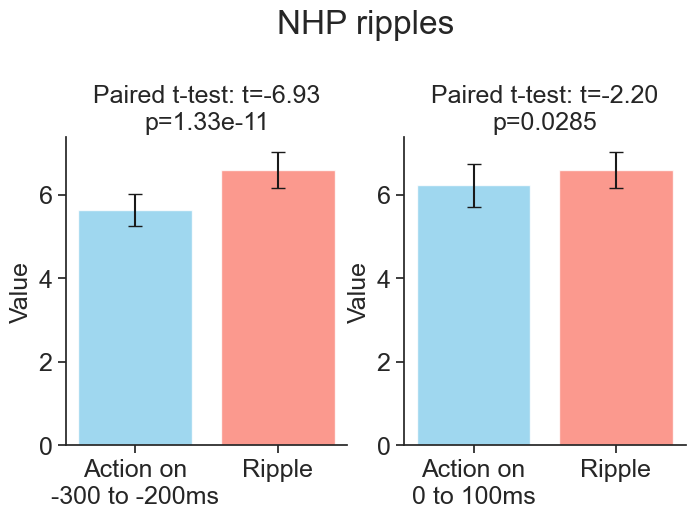

In [615]:
plt.close('all')
fig,ax = plt.subplots(1,2,figsize=(8,4))

ts = 3

tstat, pval = ttest_rel(Lambda[:,ts], nhp_ripple_FR)

# your two paired samples
x1 = Lambda[:, ts]
x2 = nhp_ripple_FR

# means and SEMs
means = [np.mean(x1), np.mean(x2)]
sems = [np.std(x1)/np.sqrt(len(x1)), np.std(x2)/np.sqrt(len(x2))]

# barplot
bars = ax[0].bar([0,1], means, yerr=sems, capsize=5, color=["skyblue","salmon"], alpha=0.8)

# beautify
ax[0].set_xticks([0,1])
ax[0].set_xticklabels(["Action on\n-300 to -200ms", "Ripple"])
ax[0].set_ylabel("Value")
ax[0].set_title(f"Paired t-test: t={tstat:.2f}\np={pval:.3g}")


ts = 9

tstat, pval = ttest_rel(Lambda[:,ts], nhp_ripple_FR)

# your two paired samples
x1 = Lambda[:, ts]
x2 = nhp_ripple_FR

# means and SEMs
means = [np.mean(x1), np.mean(x2)]
sems = [np.std(x1)/np.sqrt(len(x1)), np.std(x2)/np.sqrt(len(x2))]

# barplot
bars = ax[1].bar([0,1], means, yerr=sems, capsize=5, color=["skyblue","salmon"], alpha=0.8)

# beautify
ax[1].set_xticks([0,1])
ax[1].set_xticklabels(["Action on\n0 to 100ms", "Ripple"])
ax[1].set_ylabel("Value")
ax[1].set_title(f"Paired t-test: t={tstat:.2f}\np={pval:.3g}")

plt.suptitle('NHP ripples',y=1.2)
plt.savefig('NHP rippels FR')

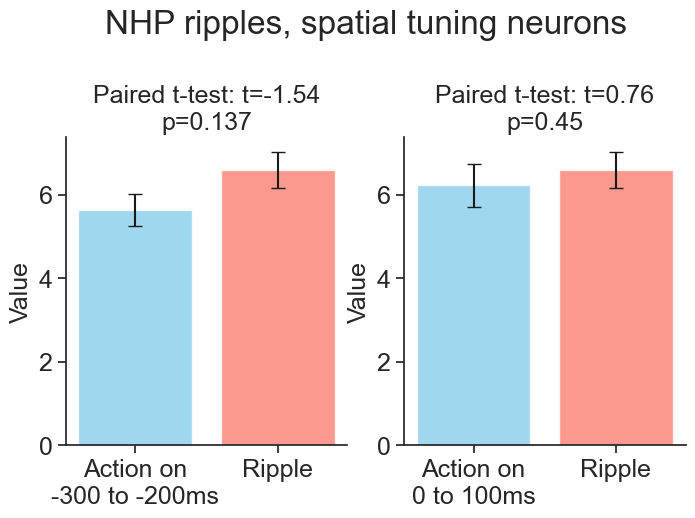

In [625]:
plt.close('all')
fig,ax = plt.subplots(1,2,figsize=(8,4))

ts = 3

tstat, pval = ttest_rel(Lambda[sig[:,ts],ts], nhp_ripple_FR[sig[:,ts]])

# your two paired samples
x1 = Lambda[:, ts]
x2 = nhp_ripple_FR

# means and SEMs
means = [np.mean(x1), np.mean(x2)]
sems = [np.std(x1)/np.sqrt(len(x1)), np.std(x2)/np.sqrt(len(x2))]

# barplot
bars = ax[0].bar([0,1], means, yerr=sems, capsize=5, color=["skyblue","salmon"], alpha=0.8)

# beautify
ax[0].set_xticks([0,1])
ax[0].set_xticklabels(["Action on\n-300 to -200ms", "Ripple"])
ax[0].set_ylabel("Value")
ax[0].set_title(f"Paired t-test: t={tstat:.2f}\np={pval:.3g}")


ts = 9

tstat, pval = ttest_rel(Lambda[sig[:,ts],ts], nhp_ripple_FR[sig[:,ts]])

# your two paired samples
x1 = Lambda[:, ts]
x2 = nhp_ripple_FR

# means and SEMs
means = [np.mean(x1), np.mean(x2)]
sems = [np.std(x1)/np.sqrt(len(x1)), np.std(x2)/np.sqrt(len(x2))]

# barplot
bars = ax[1].bar([0,1], means, yerr=sems, capsize=5, color=["skyblue","salmon"], alpha=0.8)

# beautify
ax[1].set_xticks([0,1])
ax[1].set_xticklabels(["Action on\n0 to 100ms", "Ripple"])
ax[1].set_ylabel("Value")
ax[1].set_title(f"Paired t-test: t={tstat:.2f}\np={pval:.3g}")

plt.suptitle('NHP ripples, spatial tuning neurons',y=1.2)
plt.savefig('NHP rippels FR, spatial tuning neurons')

(0.0, 5.0)

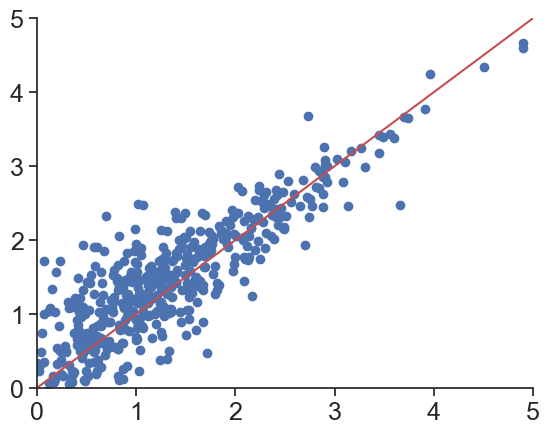

In [587]:
plt.close('all')
plt.scatter(np.log(Lambda[:,9]),np.log(nhp_ripple_FR))
plt.plot([0,15],[0,15],'r-')
plt.xlim(0,5)
plt.ylim(0,5)

In [537]:
from scipy.stats import ttest_rel

In [273]:
colors = sns.color_palette('Set1',16)

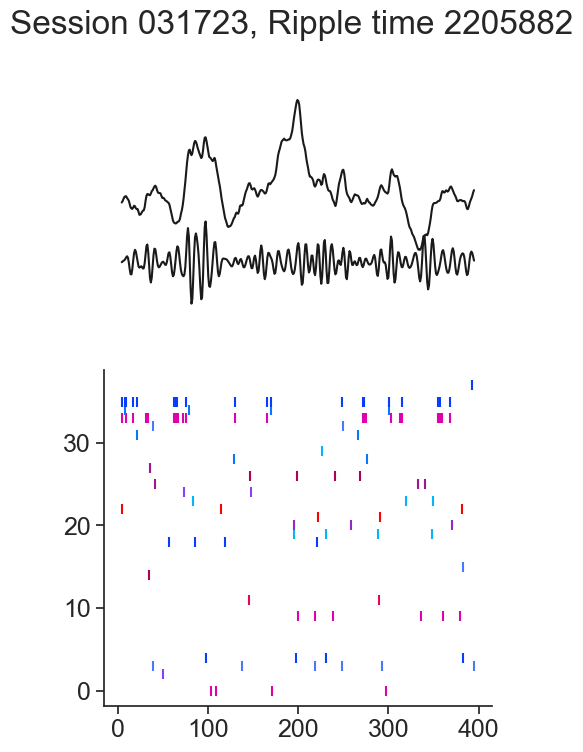

In [335]:
colors = sns.color_palette('Set1',16)
for pp in np.random.choice(nhp_peaks_merged, size=10, replace=False):

    timestamps = np.arange(pp-200,pp+200)
    ripple_spike = spikesData[timestamps,:][:,unit_idx]
    lfps,nhp_ripple_band,nhp_ripple_time = get_signal_per_probe(probe_info,date,probe,timestamps,[80,180])
    
    plt.close('all')
    fig, ax = plt.subplots(2,1,figsize=(5,8),height_ratios=[0.4,0.6])
    ii = -1
    ax[0].plot(lfps[:,ii],'k-')
    ax[0].plot(nhp_ripple_band[:,ii]*5-0.25,'k-')
    ax[0].axis('off')
    
    for ii, nn in enumerate(np.where(ses_sig)[0]):
        nn_spikes = np.where(ripple_spike[:,nn])[0]
        if ses_sig[nn]:
            ax[1].scatter(nn_spikes,ii*np.ones(len(nn_spikes)),50,marker='|',color=cmap_2d[np.divmod(ses_Lambda_i[nn],4)])
        # else:
        #     plt.scatter(nn_spikes,nn*np.ones(len(nn_spikes)),50,marker='|',color='gray')
    
    plt.suptitle('Session %s, Ripple time %i' % (date,pp))
    plt.savefig('Session %s, Ripple time %i.jpg' % (date,pp))

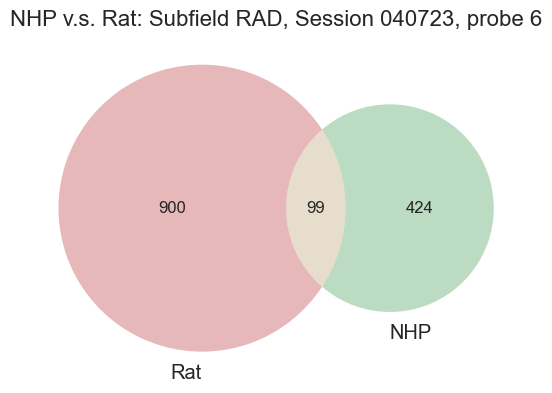

In [29]:
dates = ['031723','032023','032823','033123','040423','040723']
dates = ['031723','032823','033123','040423','040723']

for date in dates:
    
    date_int = int(date[1:])
    probe = 6
    probe_info = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx')
    ch_start, ch_end = probe_info.query("(date==@date_int) & (probe==@probe)")[['start_channel','end_channel']].values[0]

    nwbfile = import_behavior(date)
    unitNames = nwbfile.units.to_dataframe()
    subfield = unitNames.query("(probe==@probe)").subfield.unique()[0]
    
    rat_peaks = import_ripple(date, [150,250])[np.arange(ch_start-1, ch_end)]
    nhp_peaks = import_ripple(date, [80,180])[np.arange(ch_start-1, ch_end)]
    
    rat_peaks_all = np.unique(np.concatenate(rat_peaks))
    nhp_peaks_all = np.unique(np.concatenate(nhp_peaks))
    
    rat_peaks_merged = merge_close_neighbors(rat_peaks_all)
    nhp_peaks_merged = merge_close_neighbors(nhp_peaks_all)
    
    matches, rat_only, nhp_only = find_match(rat_peaks_merged,nhp_peaks_merged)
    
    plt.close('all')
    venn2(subsets=(rat_only.shape[0], nhp_only.shape[0], matches.shape[0]), set_labels=('Rat','NHP'))
    plt.title('NHP v.s. Rat: Subfield %s, Session %s, probe %i' % (subfield,date,probe),fontsize=16)
    plt.savefig('Venn nhp vs rat, Subfield %s, Session %s, probe %i' % (subfield,date,probe))

In [329]:
matches, rat_only, nhp_only = find_match(rat_peaks_merged,nhp_peaks_merged)

In [493]:
rat_ripple_time

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

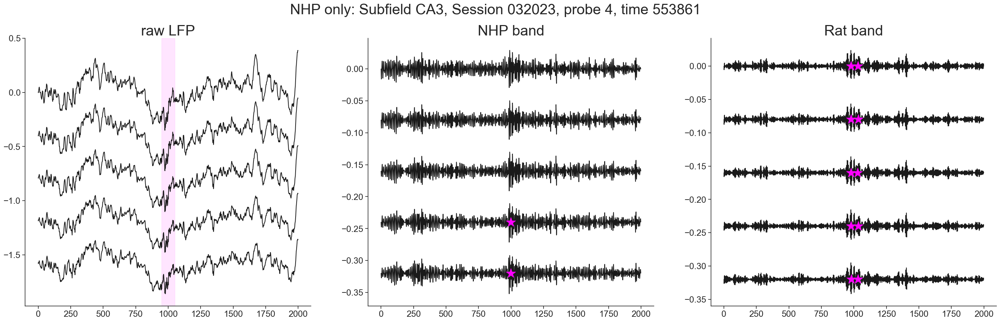

In [499]:
which = 'NHP only'

# for center in np.random.choice(nhp_only, size=10, replace=False):
center = 553861
date = '032023'
probe = 4

timestamps = np.arange(center-1000,center+1000)
lfps,rat_ripple_band,rat_ripple_time = get_signal_per_probe(probe_info,date,probe,timestamps,[150,250])
lfps,nhp_ripple_band,nhp_ripple_time = get_signal_per_probe(probe_info,date,probe,timestamps,[80,180])

plt.close('all')
fig, ax = plt.subplots(1,3,figsize=(36,10))

for ii in range(5):
    
    ax[0].plot(lfps[:,ii]-0.4*ii,'k-')
    ax[1].plot(nhp_ripple_band[:,ii]-0.08*ii,'k-')
    ax[2].plot(rat_ripple_band[:,ii]-0.08*ii,'k-')
    
    cols = np.where(nhp_ripple_time[:,ii])[0]
    for jj, col in enumerate(cols):
        ax[1].scatter(col,-0.08*ii,marker='*',s=400,color='magenta',zorder=2)

    cols = np.where(rat_ripple_time[:,ii])[0]
    for jj, col in enumerate(cols):
        ax[2].scatter(col,-0.08*ii,marker='*',s=400,color='magenta',zorder=2)

ax[0].axvspan(950,1050,color='magenta',alpha=0.1)
ax[0].set_title('raw LFP',fontsize=30)
ax[1].set_title('NHP band',fontsize=30)
ax[2].set_title('Rat band',fontsize=30)

plt.suptitle('%s: Subfield %s, Session %s, probe %i, time %i' % (which,subfield,date,probe,center),fontsize=30)
plt.savefig('%s, Subfield %s, Session %s, probe %i, time %i' % (which,subfield, date,probe,center))

Text(0.5, 1.0, 'Rat band')

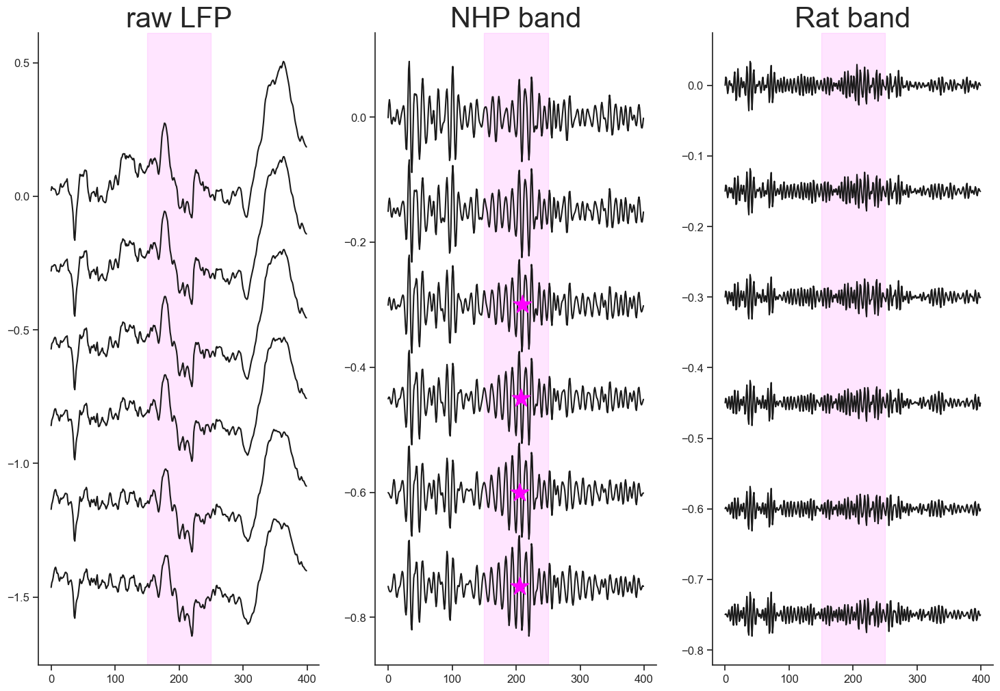

In [203]:
center = 1729071

timestamps = np.arange(center-200,center+200)
lfps,rat_ripple_band,rat_ripple_time = get_signal_per_probe(probe_info,'032023',4,timestamps,[150,250])
lfps,nhp_ripple_band,nhp_ripple_time = get_signal_per_probe(probe_info,'032023',4,timestamps,[80,180])

plt.close('all')
fig, ax = plt.subplots(1,3,figsize=(18,12))

for ii in range(6):
    
    ax[0].plot(lfps[:,ii]-0.3*ii,'k-')
    ax[1].plot(nhp_ripple_band[:,ii]*2.5-0.15*ii,'k-')
    ax[2].plot(rat_ripple_band[:,ii]*2.5-0.15*ii,'k-')
    
    cols = np.where(nhp_ripple_time[:,ii])[0]
    for jj, col in enumerate(cols):
        ax[1].scatter(col,-0.15*ii,marker='*',s=400,color='magenta',zorder=2)

    cols = np.where(rat_ripple_time[:,ii])[0]
    for jj, col in enumerate(cols):
        ax[2].scatter(col,-0.15*ii,marker='*',s=400,color='magenta',zorder=2)

ax[0].axvspan(150,250,color='magenta',alpha=0.1)
ax[1].axvspan(150,250,color='magenta',alpha=0.1)
ax[2].axvspan(150,250,color='magenta',alpha=0.1)

ax[0].set_title('raw LFP',fontsize=30)
ax[1].set_title('NHP band',fontsize=30)
ax[2].set_title('Rat band',fontsize=30)

In [ ]:
### get ripple from specific probe

    timestamps, lfpData = import_LFP(date)
    
    allprobes = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx')
    date_int = int(date[1:])  # removes the first char and converts to int
    probe_info = allprobes.query('date == @date_int')
    region_peaks = []
    
    data = np.load('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/ripple band 80 180/session ripples %s 80 to 180.npz' % date, allow_pickle=True)    
    all_peaks, _ = data['peaks'], data['durs']

    for pp in range(len(probe_info)):
        
        start_ch = probe_info.iloc[pp]['start_channel']
        end_ch = probe_info.iloc[pp]['end_channel']   
        region_peaks.append(all_peaks[start_ch:end_ch+1])

    region_peaks = np.concatenate(region_peaks)

In [151]:
all_peaks[128]

array([  33405,   54373,   54436,   56882,   64706,  100643,  107212,
        112308,  120448,  134307,  137781,  153084,  165867,  237377,
        275101,  275153,  294695,  297054,  307734,  308977,  374507,
        410012,  410445,  439856,  501280,  505887,  597022,  661306,
        724034,  725466,  728807,  738816,  780340,  781522,  844142,
        923410,  968347, 1041381, 1060435, 1132878, 1145906, 1198536,
       1206716, 1211381, 1211432, 1233926, 1267617, 1482891, 1609467,
       1611280, 1611331, 1644049, 1647977, 1667504, 1686805, 1716014,
       1742178, 1760661, 1825745, 1946559, 1950753, 1963838, 1963890,
       1974943, 2094559, 2113407, 2134320, 2143411, 2158338, 2174596,
       2179523, 2186125, 2294742, 2308368, 2392733, 2392789, 2569822,
       2632391, 2670929, 2681254, 2684861, 2693812, 2714945, 2796628,
       2801884, 2844138, 2865610, 2888296, 2894750, 2916966, 2974083,
       3053024, 3070583, 3106056, 3145863, 3158348, 3265256, 3279311,
       3309178, 3347

In [ ]:
def get_signal_per_channel()

"""this retrieves signal from one channels across multiple timestamps/windows
"""

In [763]:
def get_signal(all_peaks, date, channel, time=[], aligned = 0, epoch = [], window = 1000):

    lfp = lfpData[time,channel]
    ripple_time = peaks[(peaks> time[0]) & (peaks<time[-1])]-time[0]

    return lfp, ripple_time

In [763]:
def get_signal(all_peaks, date, channel, time=[], aligned = 0, epoch = [], window = 1000):
    
    timestamps, lfpData = import_LFP(date)
    peaks = all_peaks[channel]

    if aligned:

        nwbfile = import_behavior(date)
        df = nwbfile.intervals[epoch].to_dataframe() #.query('trialerror==1')
        df = df.loc[:,df.columns[:-1]]
        
        lfp = np.zeros((len(df),np.diff(window)[0]))
        ripple_time = np.zeros((len(df),np.diff(window)[0]))
        starts = df.start_time.values
        
        for tt in range(len(df)):

            start = int(starts[tt]-1000)
            end = int(starts[tt]+1000)

            lfp[tt,:] = lfpData[start:end,channel]
            rel_onset = (peaks[(peaks> start) & (peaks<end)]-start).astype(int)
        
            if len(rel_onset)>0:
                ripple_time[tt,rel_onset] = 1
                
    else:

        if len(time)>0:
            lfp = lfpData[time,channel]
            ripple_time = peaks[(peaks> time[0]) & (peaks<time[-1])]-time[0]
        else:
            lfp = lfpData[:,channel]
            ripple_time = peaks
    
    return lfp, ripple_time

In [765]:
date = '032023'
band = [150,250]
all_peaks = import_ripple(date, band)
channel = 120
lfp, ripple_time = get_signal(all_peaks, date, channel, time=[], aligned = 1, epoch = 'trials', window = [-1000,1000])


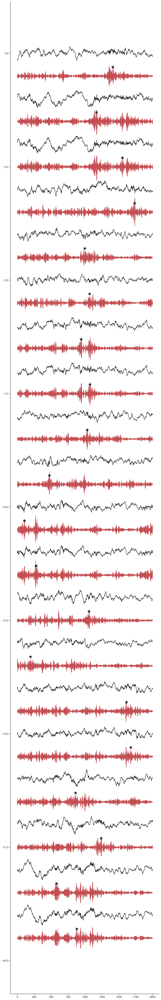

In [440]:
date = '032023'
band = [150,250]
all_peaks = import_ripple(date, band)
channel = 120
lfp, ripple_time = get_signal(all_peaks, date, channel, time=[], aligned = 1, epoch = 'trials', window = [-1000,1000])

rippleband = np.zeros(lfp.shape)
sos = butter(5, band, btype='bandpass', output='sos', fs=1000)

for ii in range(lfp.shape[0]):
    preprocessed, _ = preprocess_LFP(lfp[ii,:])
    rippleband[ii,:] = sosfiltfilt(sos, preprocessed)

rows,cols = np.where(ripple_time)

idx = np.arange(20,40)

plt.close('all')
plt.figure(figsize=(12,4*20))

for ii, (row, col) in enumerate(zip(rows[idx],cols[idx])):
    
    plt.plot(lfp[row,:]-ii,'k-')
    plt.plot(rippleband[row,:]*10-ii-0.5,'r-')
    plt.scatter(col,-ii-0.3,marker='*',s=200,color='k',zorder=2)

plt.savefig('Session %s, band %i to %i, channel %i, ripple example' % (date,band[0],band[1],channel))

In [513]:
date = '032023'
band = [80,180]
channel = 120

all_peaks = import_ripple(date, band)
lfp = np.zeros((all_peaks[channel].shape[0],400))
rippleband = np.zeros((all_peaks[channel].shape[0],400))
sos = butter(5, band, btype='bandpass', output='sos', fs=1000)

for ii, peak in enumerate(all_peaks[channel]):
    
    lfp[ii,:], _ = get_signal(all_peaks, date, channel, time=np.arange(peak-200,peak+200), aligned = 0)
    preprocessed, _ = preprocess_LFP(lfp[ii,:])
    rippleband[ii,:] = sosfiltfilt(sos, preprocessed)
    

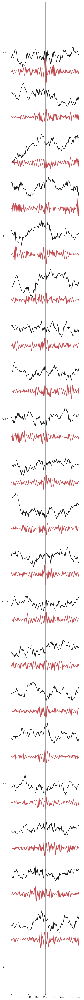

In [519]:
idx = np.arange(40,60)

plt.close('all')
plt.figure(figsize=(6,4*20))

for ii in idx:
    
    plt.plot(lfp[ii,:]-ii*0.5,'k-')
    plt.plot(rippleband[ii,:]*3-ii*0.5-0.2,'r-')

plt.axvline(200,color='gray',linestyle='-',lw=0.5)
# plt.savefig('Session %s, band %i to %i, channel %i, ripple example, aligned to ripple' % (date,band[0],band[1],channel))

In [663]:
def get_ripple(date, band, channel):

    all_peaks = import_ripple(date, band)
    lfp = np.zeros((all_peaks[channel].shape[0],400))
    rippleband = np.zeros((all_peaks[channel].shape[0],400))
    sos = butter(5, band, btype='bandpass', output='sos', fs=1000)
    
    for ii, peak in enumerate(all_peaks[channel]):
        
        lfp[ii,:], _ = get_signal(all_peaks, date, channel, time=np.arange(peak-200,peak+200), aligned = 0)
        preprocessed, _ = preprocess_LFP(lfp[ii,:])
        rippleband[ii,:] = sosfiltfilt(sos, preprocessed)
    
    return lfp, rippleband


In [725]:
rat_lfp, rat_ripple = get_ripple('032023', [150,250], 120)
nhp_lfp, nhp_ripple = get_ripple('032023', [80,180], 120)

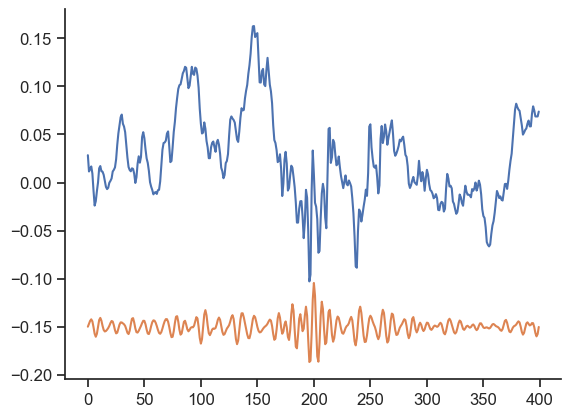

In [755]:
plt.close('all')
plt.plot(nhp_lfp[19,:])
plt.plot(nhp_ripple[19,:]-0.15)

In [743]:
# nhp_lfp, nhp_ripple = get_ripple('032823', [80,180], 180)
plot_ripple_spectrum('032023',120,)

ValueError: The length of the input vector x must be greater than padlen, which is 63.

In [721]:
def plot_ripple_spectrum(date,channel,lfp,idx):
    
    os.chdir('/Users/lianghexin/Documents/Berkeley/Teleworld/Code')
    
    for ii in idx:
            
        coefficients, freqs, power = wavelet(lfp[ii,:])
        zscored_power = (power-power.mean(axis=1)[:, None])/power.std(axis=1)[:, None]
        
        
        # 1. robust center: for each frequency, find the median 
        # center = np.nanmedian(power, axis=1)
        
        # # 2. fit on freq range that avoids narrowband peaks, e.g., 2-100 Hz:
        # use = (freqs >= 1) & (freqs <= 250)
        # coef = np.polyfit(freqs[use], np.log(center[use]), 1)
        # fit = np.exp(coef[0] * freqs + coef[1])
        
        # # 3. flatten
        # power_flat = power / fit[:, None]
        
        # Plot scalogram: time vs frequency with power as color
        plt.close('all')
        plt.figure(figsize=(8, 6))
        plt.contourf(np.arange(-200,200), freqs, zscored_power, 100, cmap='jet')
        # plt.yscale('log')
        # plt.ylim(20,80)
        plt.colorbar(label='Power')
        # plt.ylim(150,250)
        plt.axhline(80,color='w')
        plt.axhline(180,color='w')
        plt.xlim(-200,200)
        
        plt.xlabel('Time (ms)')
        plt.ylabel('Frequency (Hz)')
        plt.title('Band: %i - %i Hz' % (band[0],band[1]),fontsize=20)
        plt.tight_layout()
        plt.savefig('Session %s, band %i to %i, channel %i, ripple id %i' % (date,band[0],band[1],channel,ii))

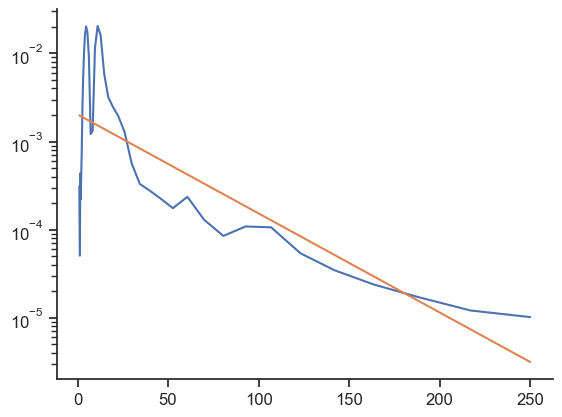

In [599]:
plt.close('all')
plt.semilogy(freqs,center)
plt.semilogy(freqs,fit)

In [659]:
# this looks like real ripple

date = '032023'
band = [80,180]
channel = 120

all_peaks = import_ripple(date, band)
lfp = np.zeros((all_peaks[channel].shape[0],400))
rippleband = np.zeros((all_peaks[channel].shape[0],400))
sos = butter(5, band, btype='bandpass', output='sos', fs=1000)

for ii, peak in enumerate(all_peaks[channel]):
    
    lfp[ii,:], _ = get_signal(all_peaks, date, channel, time=np.arange(peak-200,peak+200), aligned = 0)
    preprocessed, _ = preprocess_LFP(lfp[ii,:])
    rippleband[ii,:] = sosfiltfilt(sos, preprocessed)
    

plt.close('all')
plt.figure(figsize=(8,4))

for ii in [36]:
    
    plt.plot(lfp[ii,:]-ii*0.5,'k-')
    plt.plot(rippleband[ii,:]*3-ii*0.5-0.2,'r-')


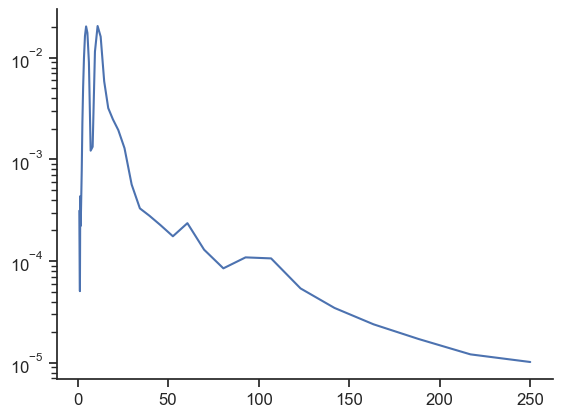

In [585]:
plt.close('all')
plt.semilogy(freqs,center)
plt.semilogy(freqs,fit)

In [539]:
def wavelet(sig, fs=1000):

    # notch filter 60hz and harmonics
    
    lfp_filt = sig.copy()
    for f0 in [60, 120, 180, 240]:# design 10th order band-stop (Butterworth) filter for each noise frequency +/- 2 Hz
        notchfilt = butter(10, (f0-2,f0+2), 'bandstop', fs=1000, output='sos')
        lfp_filt = sosfiltfilt(notchfilt, lfp_filt)

    t = np.arange(lfp.shape[1])
    p = np.polyfit(t, lfp_filt, deg=3)  # cubic fit
    trend = np.polyval(p, t)
    detrended = lfp_filt - trend

    
    # Define frequencies of interest (1 to 100 Hz, logarithmically spaced)
    freqs = np.logspace(np.log10(1), np.log10(250), num=40)
    
    # Convert frequencies to scales for Morlet wavelet in pywt
    # The formula depends on the wavelet center frequency:
    wavelet = 'cmor1.5-1.0'  # complex Morlet with bandwidth=1.5, center freq=1.0
    center_freq = pywt.central_frequency(wavelet)
    scales = center_freq * fs / freqs
    

    # Compute the Continuous Wavelet Transform (CWT)
    coefficients, frequencies = pywt.cwt(detrended, scales, wavelet, sampling_period=1/fs)
    
    # Compute power (magnitude squared of coefficients)
    power = np.abs(coefficients) ** 2

    return coefficients, frequencies, power

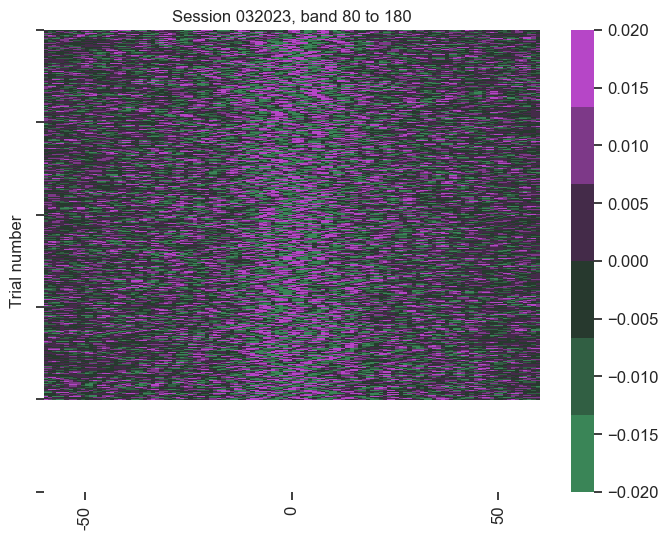

In [523]:
plt.close('all')
plt.figure(figsize=(8,6))
sns.heatmap(rippleband,vmin=-0.02,vmax=0.02, cmap = sns.diverging_palette(140,300,center='dark'))
plt.xlim(140,260)
plt.xticks(np.arange(150,260,50),labels=np.arange(-50,60,50))
plt.yticks(np.arange(0,560,100))
plt.ylabel('Trial number')
plt.title('Session %s, band %i to %i' % (date,band[0],band[1]))
plt.savefig('Session %s, band %i to %i, channel %i, ripple heatmap' % (date,band[0],band[1],channel))

In [191]:
lfp = get_signal('031723', 180, time=np.arange(4968976-20000,4968976+60000))
preprocessed, noise = preprocess_LFP(lfp,cutoff=4)
rippleband, smoothed, zscored, true_peaks, ons, offs = detect_ripple(preprocessed, noise, [80,180])

(-10.0, 20.0)

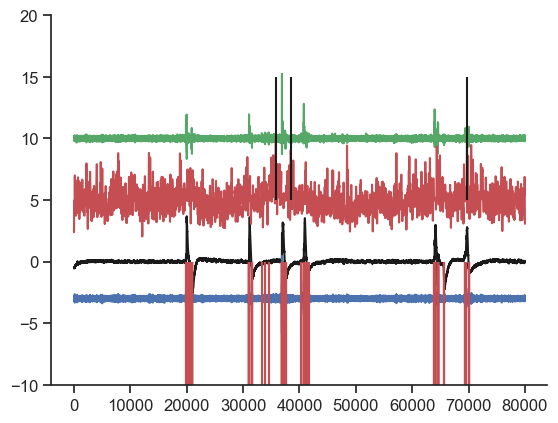

In [201]:
plt.close('all')
plt.plot(preprocessed,'k-')
plt.plot(zscored_diff/10+10,'g-')
plt.plot(rippleband*10-3)
plt.plot(zscored + 5,'r-')
plt.vlines(true_peaks,5,15,color='k',linestyle='-')
plt.vlines(noise,-10,0,color='r',linestyle='-')
# plt.xlim(69000,71000)
plt.ylim(-10,20)

In [17]:
def merge_close_neighbors(arr, threshold=50):
    
    arr = np.sort(np.array(arr, dtype=float))  # sort & ensure float
    merged = True

    while merged:
        
        merged = False
        new_arr = []
        skip_next = False

        for i in range(len(arr)):
            
            if skip_next:
                skip_next = False
                continue

            if i < len(arr) - 1 and abs(arr[i+1] - arr[i]) < threshold:
                
                # merge the two
                mean_val = (arr[i] + arr[i+1]) / 2
                new_arr.append(mean_val)
                skip_next = True
                merged = True
                
            else:
                new_arr.append(arr[i])

        arr = np.array(sorted(new_arr))
    
    return arr


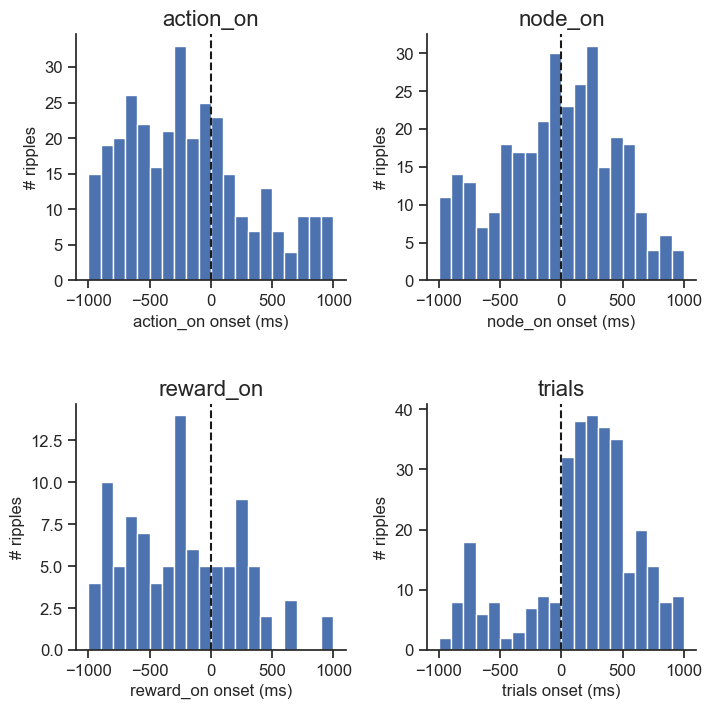

In [65]:
# aligned to behavior epochs, histogram counts

epochs = ['action_on', 'node_on', 'reward_on', 'trials']

plt.close('all')
fig, ax = plt.subplots(2,2,figsize=(8,8))


for ii, epoch in enumerate(epochs):
    
    df = nwbfile.intervals[epoch].to_dataframe() #.query('trialerror==1')
    df = df.loc[:,df.columns[:-1]]

    ripple_time = []
    starts = df.start_time.values
    ends = df.stop_time.values
    
    for tt in range(len(df)):
        
        rel_onset = (peaks[(peaks> starts[tt]-1000) & (peaks<ends[tt])]-starts[tt]).astype(int)
    
        ripple_time.append(rel_onset)

    
    ax[np.divmod(ii,2)].hist(np.concatenate(ripple_time),bins=np.arange(-1000,1100,100))
    ax[np.divmod(ii,2)].set_xlabel('%s onset (ms)' % epoch)
    ax[np.divmod(ii,2)].set_ylabel('# ripples')
    ax[np.divmod(ii,2)].set_title(epoch,fontsize=16)
    ax[np.divmod(ii,2)].axvline(0,color='k',linestyle='--')

fig.subplots_adjust(hspace=0.5, wspace=0.3)
# fig.savefig('Ripple counts, session %s' % date)

In [9]:
# dates = ['031723','032023','032823','033123','040423','040723']

dates = ['032023','032823','033123','040423','040723']


for date in dates:

    timestamps, lfpData, nwbfile = import_data(date)
    
    # check ripples across all channels
    
    num_ch = lfpData.shape[1]
    all_peaks = [[] for i in range(num_ch)]
    all_durs = [[] for i in range(num_ch)]
    
    for ch in tqdm(range(num_ch)):

        try:
            all_peaks[ch], all_durs[ch] = detect_ripple(timestamps,lfpData[:, ch],band=[150,250])
        except:
            pass
    
    
    peaks_obj = np.array(all_peaks, dtype=object)
    durs_obj = np.array(all_durs, dtype=object)
    np.savez('session ripples %s 150 to 250.npz' % date,
             peaks=peaks_obj,
             durs=durs_obj)

# os.chdir(Path('/Users/lianghexin/Documents/Berkeley/Teleworld/Code'))
# data = np.load('session 031723 ripples.npz', allow_pickle=True)
# all_peaks, all_durs = data['peaks'], data['durs']

100%|███████████████████████████████████████| 192/192 [1:58:47<00:00, 37.12s/it]


In [89]:
down_ts = timestamps[::10]
count_ripple = np.zeros((64,len(down_ts)))

for ii in range(64,64*2):
    
    temp = np.zeros(len(timestamps))
    temp[all_peaks[ii]]=1
    count_ripple[ii-64,:] = np.convolve(temp,np.ones(10),mode='same')[::10]

peaks = down_ts[count_ripple.sum(axis=0)>20]

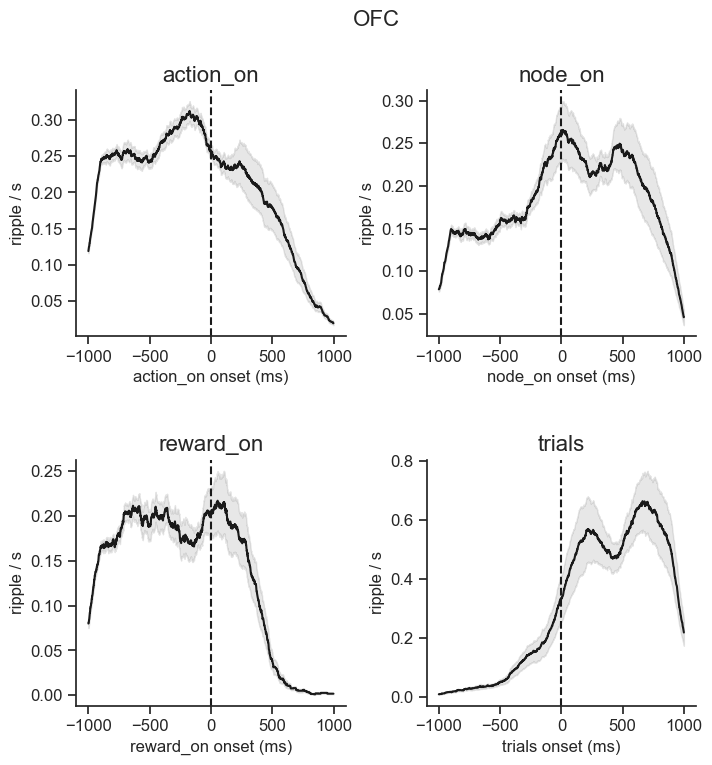

In [231]:
region = 'OFC'

plt.close('all')
fig, ax = plt.subplots(2,2,figsize=(8,8))

plot_ripple_rate_all("region==@region")

fig.subplots_adjust(hspace=0.5, wspace=0.3)
plt.suptitle(region,fontsize=16)
plt.savefig('%s ripple rate' % region)

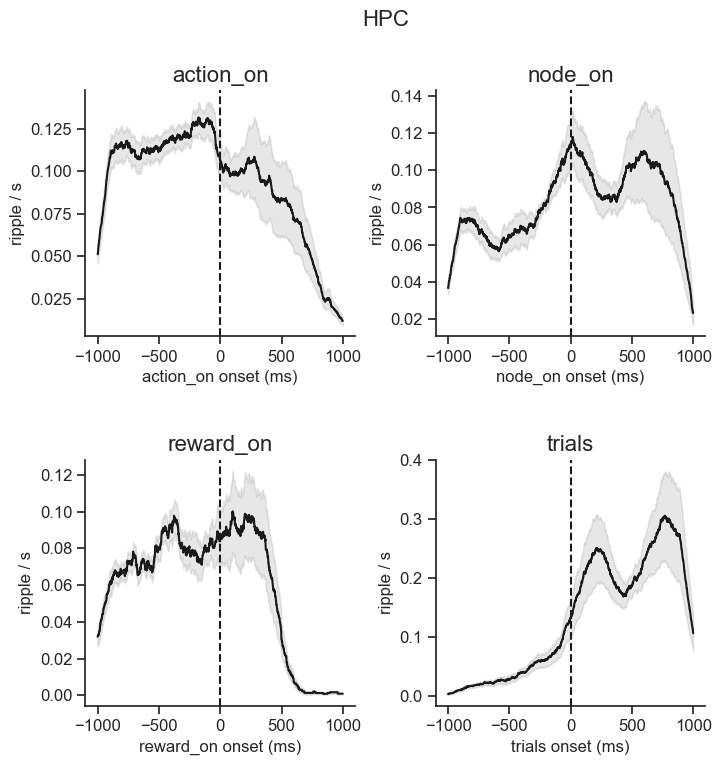

In [230]:
region = 'HPC'

plt.close('all')
fig, ax = plt.subplots(2,2,figsize=(8,8))

plot_ripple_rate_all("region==@region")

fig.subplots_adjust(hspace=0.5, wspace=0.3)
plt.suptitle(region,fontsize=16)
plt.savefig('%s ripple rate' % region)

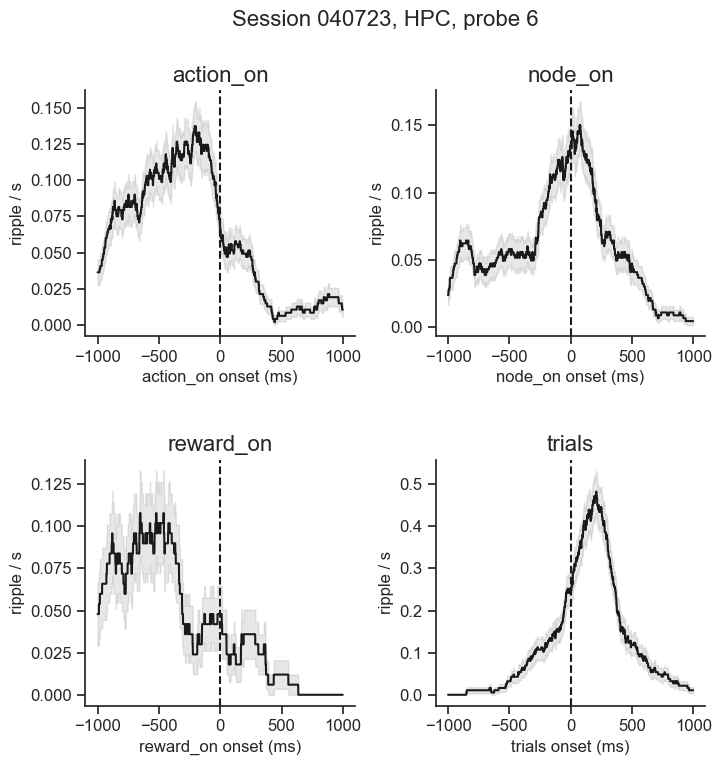

In [227]:
for pp in range(len(probe_info)):

    plt.close('all')
    fig, ax = plt.subplots(2,2,figsize=(8,8))
    
    plot_ripple_rate_single(probe_info.iloc[pp,:])
    date, region, probe = probe_info.iloc[pp,:][['date','region','probe']]
    
    fig.subplots_adjust(hspace=0.5, wspace=0.3)
    plt.suptitle('Session 0%i, %s, probe %i' % (date,region,probe),fontsize=16)
    plt.savefig('Session 0%i, %s, probe %i, ripple rate' % (date,region,probe))

In [229]:
def plot_ripple_rate_all(query): 

    # aligned to behavior epochs, ripple rates
    
    epochs = ['action_on', 'node_on', 'reward_on', 'trials']
    df_region = probe_info.query(query)
    ripple_time_all = np.zeros((len(epochs),len(df_region),2000))
    
    for pp in range(len(df_region)):
        
        date = df_region.iloc[pp]['date']
        peaks = df_region.iloc[pp]['ripples']
        timestamps, lfpData, nwbfile = import_data('0%i' % date)
        
        for ii, epoch in enumerate(epochs):
            
            df = nwbfile.intervals[epoch].to_dataframe() #.query('trialerror==1')
            df = df.loc[:,df.columns[:-1]]
        
            ripple_time = np.zeros((len(df),2000))
            starts = df.start_time.values
            
            for tt in range(len(df)):
                
                rel_onset = (peaks[(peaks> starts[tt]-1000) & (peaks<starts[tt]+1000)]-(starts[tt]-1000)).astype(int)
            
                if len(rel_onset)>0:
                    ripple_time[tt,rel_onset] = 1
        
            ripple_time_all[ii,pp,:] = 1000*np.convolve(ripple_time.mean(axis=0),np.ones(200)/200,mode='same')
    
    
    for ii, epoch in enumerate(epochs):
        
        ripple_rate = ripple_time_all[ii,:,:]
        ripple_mean = ripple_rate.mean(axis=0)
        ripple_sem = ripple_rate.std(axis=0)/np.sqrt(ripple_rate.shape[0])
    
        ax[np.divmod(ii,2)].plot(np.arange(-1000,1000),ripple_mean,color='k')
        ax[np.divmod(ii,2)].fill_between(np.arange(-1000,1000), ripple_mean-ripple_sem, ripple_mean+ripple_sem,color='k',alpha=0.1)
        ax[np.divmod(ii,2)].set_xlabel('%s onset (ms)' % epoch)
        ax[np.divmod(ii,2)].set_ylabel('ripple / s')
        ax[np.divmod(ii,2)].set_title(epoch,fontsize=16)
        ax[np.divmod(ii,2)].axvline(0,color='k',linestyle='--')
        


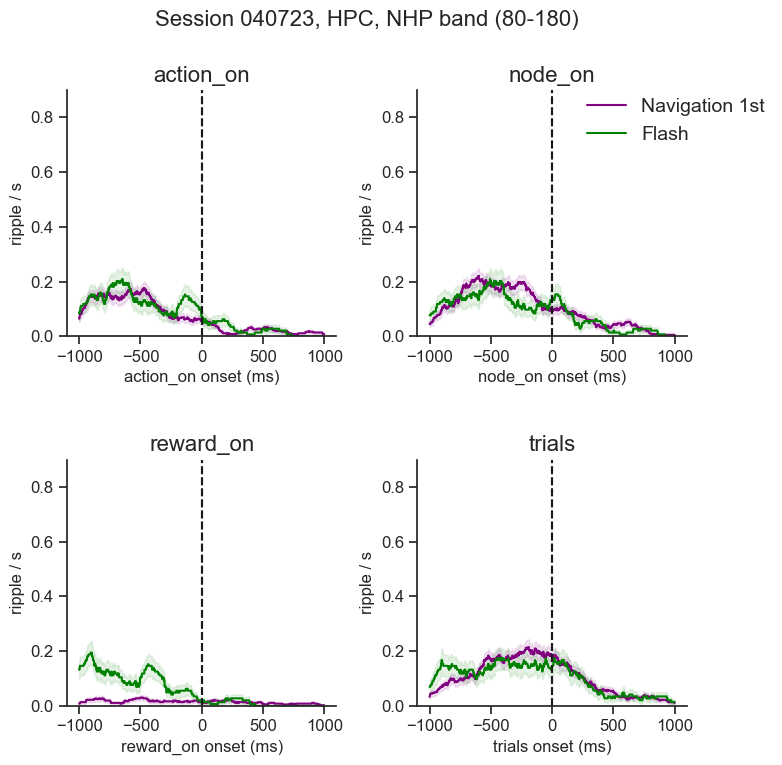

In [57]:
# planning first v.s. cued

region = 'HPC'

dates = ['031723','032023','032823','033123','040423','040723']

ylims = [0.8, 0.9, 1.3, 1.2, 1.1, 0.9]

for ii,dd in enumerate(dates):

    date = int(dd[1:])
    
    plt.close('all')
    fig, ax = plt.subplots(2,2,figsize=(8,8))
    
    ripple_time_all = plot_ripple_rate_date("(region==@region) & (date==@date)",
                                            "(trialerror==0) & (step==0)",'purple', ylims[ii],
                                           epochs = ['action_on', 'node_on'])
    
    ripple_time_all = plot_ripple_rate_date("(region==@region) & (date==@date)",
                                            "(trialerror==0) ",'purple',ylims[ii],
                                           epochs = ['', '', 'reward_on','trials'])

    ripple_time_all = plot_ripple_rate_date("(region==@region) & (date==@date)","trialerror==1",
                                            'green',ylims[ii],
                                            epochs = ['action_on', 'node_on', 'reward_on','trials'])
    

    ax[0,1].plot([0,0],[0,0],color='purple',label='Navigation 1st')
    ax[0,1].plot([0,0],[0,0],color='green',label='Flash')
    ax[0,1].legend(frameon=False,loc=(0.6,0.75),fontsize=14)
    
    fig.subplots_adjust(hspace=0.5, wspace=0.3)
    plt.suptitle('Session 0%i, %s, NHP band (80-180)' % (date,region),fontsize=16)
    plt.savefig('Session 0%i, %s, ripple rate NHP, planning 1st vs cue' % (date,region))


In [31]:
def add_ripple_to_probe(band,neighbor=5):

    probe_info = pd.read_excel('/Users/lianghexin/Documents/Berkeley/Teleworld/Code/Bart Probe Info for Hexin.xlsx')

    ripples = []
    
    for pp in range(len(probe_info)):
        
        start_ch = probe_info.iloc[pp]['start_channel']
        end_ch = probe_info.iloc[pp]['end_channel']
        date = probe_info.iloc[pp]['date']
        
        all_peaks = import_ripple('0'+str(date), band)
        timestamps,_ = import_LFP('0'+str(date))
        
        down_ts = timestamps[::10]
        count_ripple = np.zeros((32,len(down_ts)))
            
        for ii in range(start_ch-1,end_ch):
            
            temp = np.zeros(len(timestamps))
            temp[all_peaks[ii-1]]=1
            count_ripple[ii-start_ch+1,:] = np.convolve(temp,np.ones(10),mode='same')[::10]
    
        peaks = np.round(down_ts[count_ripple.sum(axis=0)>neighbor],decimals=2)
        ripples.append(merge_close_neighbors(peaks))
    
    probe_info['ripples'] = ripples

    return probe_info

In [57]:
rat_ripples = add_ripple_to_probe([150,250])
nhp_ripples = add_ripple_to_probe([80,180])

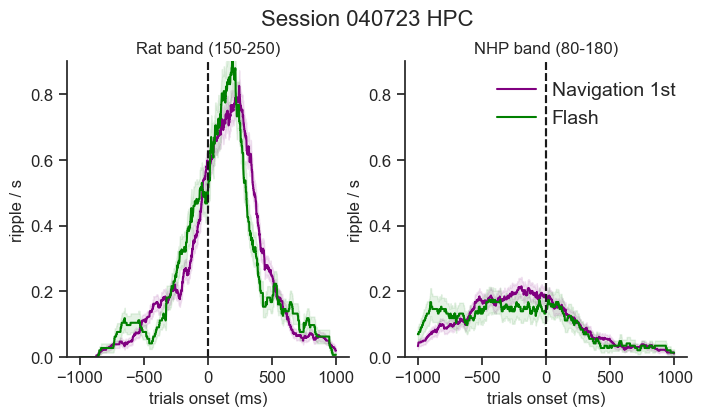

In [71]:
# planning first v.s. cued, trials on 

region = 'HPC'

dates = ['031723','032023','032823','033123','040423','040723']
ylims = [0.8, 0.9, 1.3, 1.2, 1.1, 0.9]

rat_ripple_time_all_nav = [[] for ii in range(6)]
rat_ripple_time_all_flash = [[] for ii in range(6)]
nhp_ripple_time_all_nav = [[] for ii in range(6)]
nhp_ripple_time_all_flash = [[] for ii in range(6)]

for ii, dd in enumerate(dates):

    date = int(dd[1:])
    
    plt.close('all')
    fig, ax = plt.subplots(1,2,figsize=(8,4))
    
    
    rat_ripple_time_all_nav = plot_ripple_rate_date(rat_ripples, "(region==@region) & (date==@date)",
                                            "(trialerror==0) ",'purple', ylims[ii], ax[0],
                                           epochs = ['trials'])
    rat_ripple_time_all_flash = plot_ripple_rate_date(rat_ripples, "(region==@region) & (date==@date)",
                                            "(trialerror==1) ",'green', ylims[ii], ax[0],
                                           epochs = ['trials'])
    ax[0].set_title('Rat band (150-250)')
    
    
    nhp_ripple_time_all_nav = plot_ripple_rate_date(nhp_ripples, "(region==@region) & (date==@date)",
                                            "(trialerror==0) ",'purple', ylims[ii], ax[1],
                                           epochs = ['trials'])
    nhp_ripple_time_all_flash = plot_ripple_rate_date(nhp_ripples, "(region==@region) & (date==@date)",
                                            "(trialerror==1) ",'green', ylims[ii], ax[1],
                                           epochs = ['trials'])
    ax[1].set_title('NHP band (80-180)')
    ax[1].plot([0,0],[0,0],color='purple',label='Navigation 1st')
    ax[1].plot([0,0],[0,0],color='green',label='Flash')
    ax[1].legend(frameon=False,loc=(0.3,0.75),fontsize=14)

    fig.subplots_adjust(top=0.85)  # reduce the top space used by subplots
    plt.suptitle('Session 0%i %s' % (date,region),fontsize=16)
    plt.savefig('Session 0%i, %s, rat vs NHP, planning 1st vs cue' % (date,region))


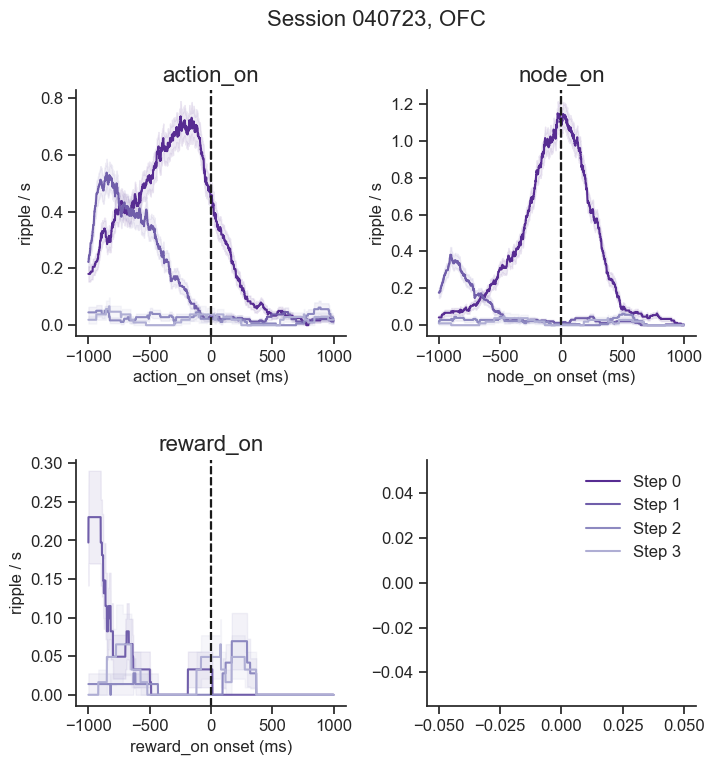

In [324]:
# planning step

region = 'OFC'

dates = ['031723','032023','032823','033123','040423','040723']
colors = sns.color_palette('Purples_r',6)[:4]

for dd in dates:

    date = int(dd[1:])
    
    plt.close('all')
    fig, ax = plt.subplots(2,2,figsize=(8,8))
    
    for step in range(4):
        ripple_time_all = plot_ripple_rate_date("(region==@region) & (date==@date)",
                                                "(trialerror==0) & (step==@step)",colors[step],
                                               epochs = ['action_on', 'node_on', 'reward_on'])
    
        ax[1,1].plot([0,0],[0,0],color=colors[step],label='Step %i' % step)
    
    ax[1,1].legend(frameon=False)
    
    fig.subplots_adjust(hspace=0.5, wspace=0.3)
    plt.suptitle('Session 0%i, %s' % (date,region),fontsize=16)
    plt.savefig('Session 0%i, %s, ripple rate, planning by step' % (date,region))



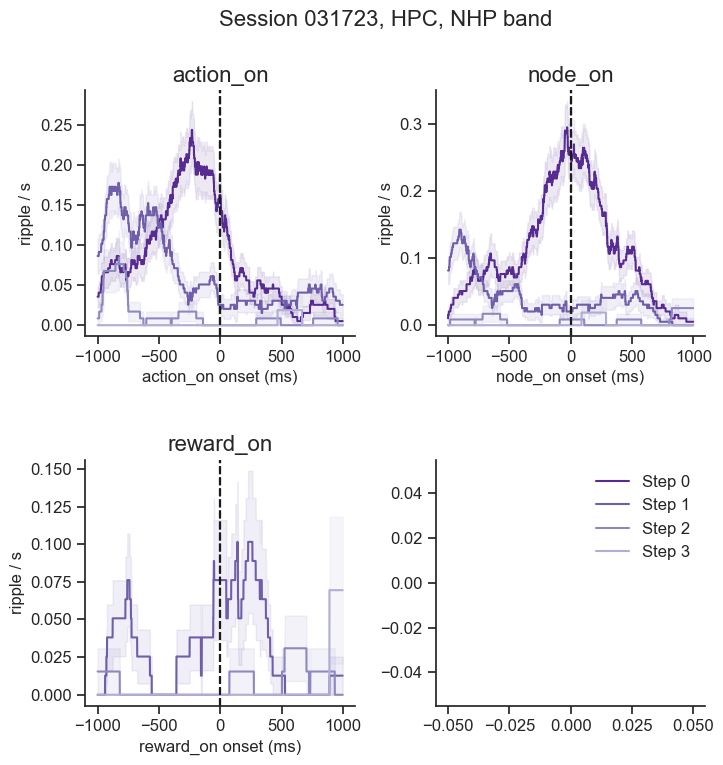

In [71]:
# planning step

region = 'HPC'

dates = ['031723','032023','032823','033123','040423','040723']
dates = ['031723']

colors = sns.color_palette('Purples_r',6)[:4]

for dd in dates:

    date = int(dd[1:])
    
    plt.close('all')
    fig, ax = plt.subplots(2,2,figsize=(8,8))
    
    for step in range(4):
        ripple_time_all = plot_ripple_rate_date("(region==@region) & (date==@date)",
                                                "(trialerror==0) & (step==@step)",colors[step],
                                               epochs = ['action_on', 'node_on', 'reward_on'])
    
        ax[1,1].plot([0,0],[0,0],color=colors[step],label='Step %i' % step)
    
    ax[1,1].legend(frameon=False)
    
    fig.subplots_adjust(hspace=0.5, wspace=0.3)
    plt.suptitle('Session 0%i, %s, NHP band' % (date,region),fontsize=16)
    plt.savefig('Session 0%i, %s, ripple rate, planning by step, NHP band' % (date,region))



In [51]:
def plot_ripple_rate_date(probe_info,ripple_query,beh_query,color,ylim,ax,epochs = ['action_on', 'node_on', 'reward_on', 'trials']): 

    # aligned to behavior epochs, ripple rates
    
    df_region = probe_info.query(ripple_query)
    ripple_time_all = [[] for _ in range(len(epochs))]
    
    for pp in range(len(df_region)):
        
        date = df_region.iloc[pp]['date']
        peaks = df_region.iloc[pp]['ripples']
        
        timestamps,_ = import_LFP('0'+str(date))
        nwbfile = import_behavior('0%i' % date)
        
        for ii, epoch in enumerate(epochs):

            if epoch!='':
            
                df = nwbfile.intervals[epoch].to_dataframe().query(beh_query)
                df = df.loc[:,df.columns[:-1]]
    
                if len(df)>0:
                
                    ripple_time = np.zeros((len(df),2000))
                    starts = df.start_time.values
                    
                    for tt in range(len(df)):
                        
                        rel_onset = (peaks[(peaks> starts[tt]-1000) & (peaks<starts[tt]+1000)]-(starts[tt]-1000)).astype(int)
                    
                        if len(rel_onset)>0:
                            ripple_time[tt,rel_onset] = 1
        
                        ripple_time_all[ii].append(1000*np.convolve(ripple_time[tt,:],np.ones(200)/200,mode='same'))
            
    
    for ii, epoch in enumerate(epochs):

        if len(ripple_time_all[ii])>0:
        
            ripple_rate = np.array(ripple_time_all[ii])
            ripple_mean = ripple_rate.mean(axis=0)
            ripple_sem = ripple_rate.std(axis=0)/np.sqrt(ripple_rate.shape[0])
        
            ax.plot(np.arange(-1000,1000),ripple_mean,color=color)
            ax.fill_between(np.arange(-1000,1000), ripple_mean-ripple_sem, ripple_mean+ripple_sem,color=color,alpha=0.1)
            ax.set_xlabel('%s onset (ms)' % epoch)
            ax.set_ylabel('ripple / s')
            ax.set_ylim(0,ylim)
            ax.set_title(epoch,fontsize=16)
            ax.axvline(0,color='k',linestyle='--')
        

    # if len(epochs)<4:
        
    #     for spine in ax[1,1].spines.values():
    #         spine.set_visible(False)
        
    #     # Remove ticks and labels
    #     ax[1,1].set_xticks([])
    #     ax[1,1].set_yticks([])
    
    return ripple_time_all

In [223]:
def plot_ripple_rate_single(df_region): 

    # aligned to behavior epochs, ripple rates
    
    epochs = ['action_on', 'node_on', 'reward_on', 'trials']
    ripple_time_all = np.zeros((len(epochs),len(df_region),2000))
        
    date = df_region['date']
    peaks = df_region['ripples']
    timestamps, lfpData, nwbfile = import_data('0%i' % date)
    
    for ii, epoch in enumerate(epochs):
        
        df = nwbfile.intervals[epoch].to_dataframe() #.query('trialerror==1')
        df = df.loc[:,df.columns[:-1]]
    
        ripple_time = np.zeros((len(df),2000))
        starts = df.start_time.values
        
        for tt in range(len(df)):
            
            rel_onset = (peaks[(peaks> starts[tt]-1000) & (peaks<starts[tt]+1000)]-(starts[tt]-1000)).astype(int)
        
            if len(rel_onset)>0:
                ripple_time[tt,rel_onset] = 1
                ripple_time[tt,:] = 1000*np.convolve(ripple_time[tt,:],np.ones(200)/200,mode='same')
    
        ripple_mean = ripple_time.mean(axis=0)
        ripple_sem = ripple_time.std(axis=0)/np.sqrt(ripple_time.shape[0])
    
        ax[np.divmod(ii,2)].plot(np.arange(-1000,1000),ripple_mean,color='k')
        ax[np.divmod(ii,2)].fill_between(np.arange(-1000,1000), ripple_mean-ripple_sem, ripple_mean+ripple_sem,color='k',alpha=0.1)
        ax[np.divmod(ii,2)].set_xlabel('%s onset (ms)' % epoch)
        ax[np.divmod(ii,2)].set_ylabel('ripple / s')
        ax[np.divmod(ii,2)].set_title(epoch,fontsize=16)
        ax[np.divmod(ii,2)].axvline(0,color='k',linestyle='--')
        


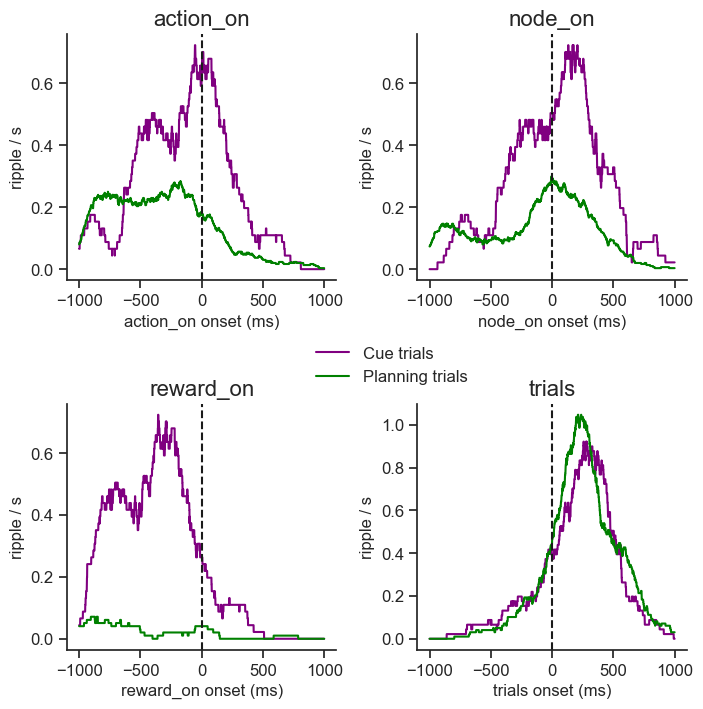

In [75]:
# aligned to behavior epochs, ripple rates, separate for cue and planning trials

epochs = ['action_on', 'node_on', 'reward_on', 'trials']

plt.close('all')
fig, ax = plt.subplots(2,2,figsize=(8,8))


for ii, epoch in enumerate(epochs):
    
    df_both = nwbfile.intervals[epoch].to_dataframe() 
    df = df_both.loc[:,df_both.columns[:-1]].query('trialerror==1')

    ripple_time = np.zeros((len(df),2000))
    starts = df.start_time.values
    
    for tt in range(len(df)):
        
        rel_onset = (peaks[(peaks> starts[tt]-1000) & (peaks<starts[tt]+1000)]-(starts[tt]-1000)).astype(int)
    
        if len(rel_onset)>0:
            ripple_time[tt,rel_onset] = 1

    
    ax[np.divmod(ii,2)].plot(np.arange(-1000,1000),1000*np.convolve(ripple_time.mean(axis=0),np.ones(200)/200,mode='same'),
                             color='purple',label='Cue trials')


    df = df_both.loc[:,df_both.columns[:-1]].query('trialerror==0')

    ripple_time = np.zeros((len(df),2000))
    starts = df.start_time.values
    
    for tt in range(len(df)):
        
        rel_onset = (peaks[(peaks> starts[tt]-1000) & (peaks<starts[tt]+1000)]-(starts[tt]-1000)).astype(int)
    
        if len(rel_onset)>0:
            ripple_time[tt,rel_onset] = 1

    
    ax[np.divmod(ii,2)].plot(np.arange(-1000,1000),1000*np.convolve(ripple_time.mean(axis=0),np.ones(200)/200,mode='same'),
                             color='green',label='Planning trials')
    
    ax[np.divmod(ii,2)].set_xlabel('%s onset (ms)' % epoch)
    ax[np.divmod(ii,2)].set_ylabel('ripple / s')
    ax[np.divmod(ii,2)].set_title(epoch,fontsize=16)
    ax[np.divmod(ii,2)].axvline(0,color='k',linestyle='--')

plt.legend(loc=(-0.4,1.05),frameon=False)
fig.subplots_adjust(hspace=0.5, wspace=0.3)
# fig.savefig('Ripple rate, cue vs planning, session %s' % date)

/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_1877/895323967.py:27: RuntimeWarning: Mean of empty slice.
  ax[ii].plot(np.arange(-1000,1000),1000*np.convolve(ripple_time.mean(axis=0),np.ones(200)/200,mode='same'),
/opt/anaconda3/lib/python3.12/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


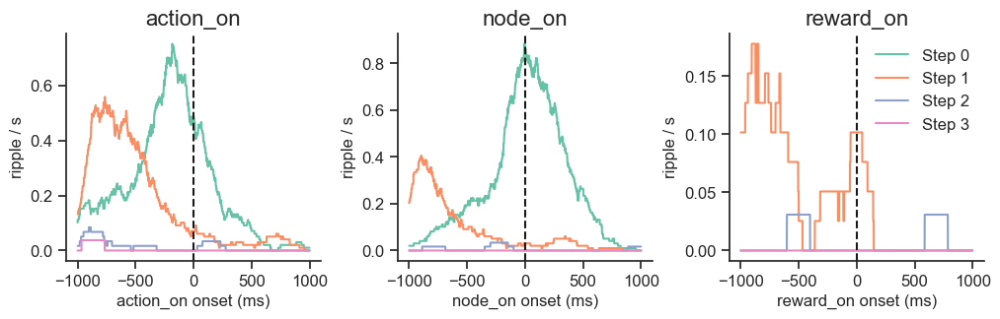

In [77]:
# aligned to behavior epochs, ripple rates, separate for each step in planning trials

epochs = ['action_on', 'node_on', 'reward_on']

plt.close('all')
fig, ax = plt.subplots(1,3,figsize=(12,3))


for ii, epoch in enumerate(epochs):
    
    df_both = nwbfile.intervals[epoch].to_dataframe() 

    for step in range(4):

        df = df_both.loc[:,df_both.columns[:-1]].query('(step==@step) & (trialerror==0)')
        ripple_time = np.zeros((len(df),2000))
        starts = df.start_time.values
        
        for tt in range(len(df)):
            
            rel_onset = (peaks[(peaks> starts[tt]-1000) & (peaks<starts[tt]+1000)]-(starts[tt]-1000)).astype(int)
        
            if len(rel_onset)>0:
                ripple_time[tt,rel_onset] = 1
    
        
        ax[ii].plot(np.arange(-1000,1000),1000*np.convolve(ripple_time.mean(axis=0),np.ones(200)/200,mode='same'),
                                 color=sns.color_palette('Set2',6)[step],label='Step %i' % step)

    
    ax[ii].set_xlabel('%s onset (ms)' % epoch)
    ax[ii].set_ylabel('ripple / s')
    ax[ii].set_title(epoch,fontsize=16)
    ax[ii].axvline(0,color='k',linestyle='--')
    
    if ii==2:
        ax[ii].legend(frameon=False)
    
fig.subplots_adjust(hspace=0.5, wspace=0.3)
# fig.savefig('Ripple rate, step number, session %s' % date)

/var/folders/vp/0ygvp9fj4dj79f756hg2wnwc0000gn/T/ipykernel_1877/4257358488.py:42: RuntimeWarning: Mean of empty slice.
  ax[ii].plot(np.arange(-1000,1000),1000*np.convolve(ripple_time.mean(axis=0),np.ones(200)/200,mode='same'),
/opt/anaconda3/lib/python3.12/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


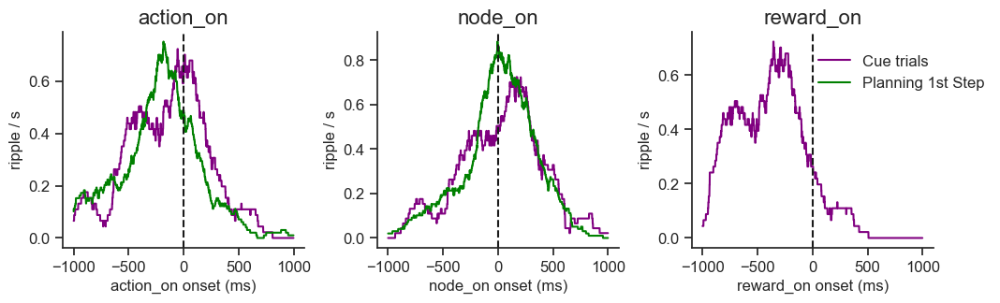

In [79]:
# aligned to behavior epochs, ripple rates, compare first step in planning trials and cue trials

epochs = ['action_on', 'node_on', 'reward_on']

plt.close('all')
fig, ax = plt.subplots(1,3,figsize=(12,3))


for ii, epoch in enumerate(epochs):
    
    df_both = nwbfile.intervals[epoch].to_dataframe() 


    df = df_both.loc[:,df_both.columns[:-1]].query('trialerror==1')
    ripple_time = np.zeros((len(df),2000))
    starts = df.start_time.values
    
    for tt in range(len(df)):
        
        rel_onset = (peaks[(peaks> starts[tt]-1000) & (peaks<starts[tt]+1000)]-(starts[tt]-1000)).astype(int)
    
        if len(rel_onset)>0:
            ripple_time[tt,rel_onset] = 1

    
    ax[ii].plot(np.arange(-1000,1000),1000*np.convolve(ripple_time.mean(axis=0),np.ones(200)/200,mode='same'),
                             color='Purple',label='Cue trials')

    
    df = df_both.loc[:,df_both.columns[:-1]].query('(step==0) & (trialerror==0)')
    ripple_time = np.zeros((len(df),2000))
    starts = df.start_time.values
    
    for tt in range(len(df)):
        
        rel_onset = (peaks[(peaks> starts[tt]-1000) & (peaks<starts[tt]+1000)]-(starts[tt]-1000)).astype(int)
    
        if len(rel_onset)>0:
            ripple_time[tt,rel_onset] = 1

    
    ax[ii].plot(np.arange(-1000,1000),1000*np.convolve(ripple_time.mean(axis=0),np.ones(200)/200,mode='same'),
                             color='Green',label='Planning 1st Step')

    
    ax[ii].set_xlabel('%s onset (ms)' % epoch)
    ax[ii].set_ylabel('ripple / s')
    ax[ii].set_title(epoch,fontsize=16)
    ax[ii].axvline(0,color='k',linestyle='--')
    
    if ii==2:
        ax[ii].legend(loc=(0.5,0.7),frameon=False)
    
fig.subplots_adjust(hspace=0.5, wspace=0.3)
# fig.savefig('Ripple rate, cue vs planning 1st, session %s' % date)

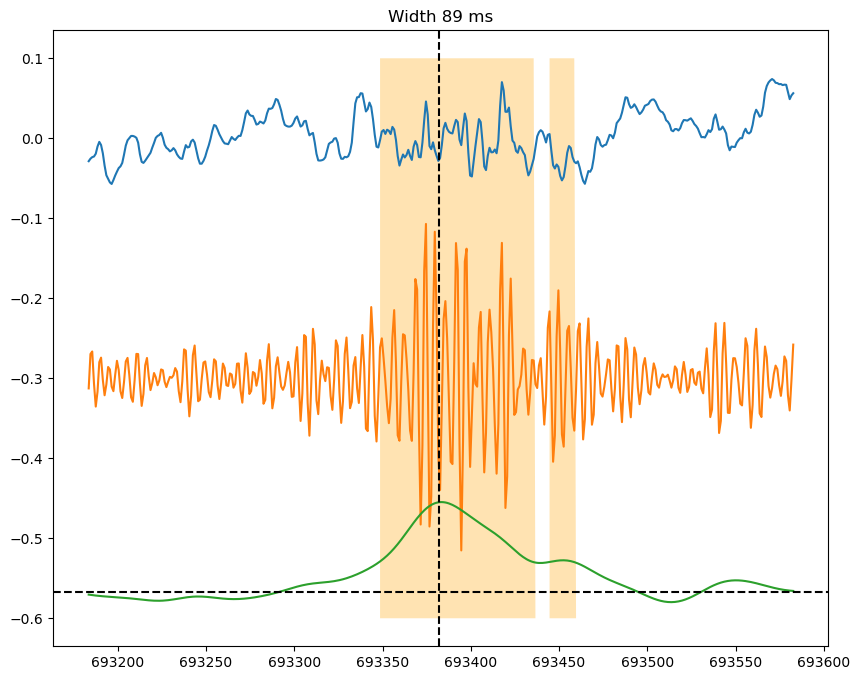

In [370]:
# check individual ripple event

# for ii,peak in enumerate(peaks):
ii=101
peak=peaks[ii]
idx = np.arange(peak-200,peak+200)
chunk = dataset[idx, 16]
plt.close('all')
plt.figure(figsize=(10,8))
plt.plot(ts[idx],chunk)
plt.plot(ts[idx],filtered[idx]*10-0.3)
plt.plot(ts[idx],smoothed[idx]*10-0.6)
plt.axhline(smoothed.mean()*10-0.6,color='k',linestyle='--')
plt.axvline(peak,color='k',linestyle='--')
plt.title('Width %i ms' % widths[ii])

plt.fill_between(
    ts[idx].ravel(),-0.6,0.1,
    where=zscored[idx] > 3,
    interpolate=True,
    facecolor='orange',
    alpha=0.3,
    label='Above Threshold'
)

# plt.ylim(-0.5,1.5)
# plt.axhline(3)
# plt.xlim(6,7)

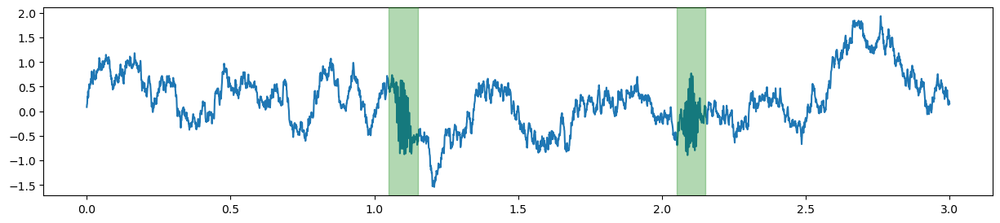

In [12]:
from ripple_detection.simulate import simulate_LFP

true_ripple_midtime = [1.1, 2.1]
RIPPLE_DURATION = 0.100
lfps = simulate_LFP(
    time, true_ripple_midtime, noise_amplitude=1.2, ripple_amplitude=1.5
)[:, np.newaxis]
speed = np.ones_like(time)

fig, ax = plt.subplots(figsize=(15, 3))
plt.plot(time, lfps)


for midtime in true_ripple_midtime:
    plt.axvspan(
        midtime - RIPPLE_DURATION / 2,
        midtime + RIPPLE_DURATION / 2,
        alpha=0.3,
        color="green",
        zorder=1000,
    )

In [ ]:
filtered_lfps = filter_ripple_band(x)

ripple_times = Kay_ripple_detector(
    time, filtered_lfps, speed, SAMPLING_FREQUENCY
)

display(ripple_times)

fig, ax = plt.subplots(figsize=(15, 3))
ax.plot(time, lfps)

for midtime in true_ripple_midtime:
    ax.axvspan(
        midtime - RIPPLE_DURATION / 2,
        midtime + RIPPLE_DURATION / 2,
        alpha=0.3,
        color="green",
        zorder=9,
    )

for ripple in ripple_times.itertuples():
    ax.axvspan(ripple.start_time, ripple.end_time, alpha=0.3, color="red", zorder=10)